In [23]:
import os
import numpy as np
import itertools
import time
import random
from collections import OrderedDict, Counter, defaultdict
from functools import partial
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
import math, copy, time
from torch.autograd import Variable
import matplotlib.pyplot as plt
%matplotlib inline

import copy
from torch.utils.data import Dataset, DataLoader
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.utils.data import random_split

import math
import json
from typing import Callable, Iterable, Tuple
from torch.optim import Optimizer
from torch.utils.data import WeightedRandomSampler

import wandb
wandb.login()
from pytorch_lightning.loggers import WandbLogger

import collections

## Data -- Generation

In [3]:
def generate_cards(attributes, attr_order, num_attributes, num_attr_vals):
    
    attr_order = attr_order[:num_attributes]
    attributes = {att_k:attributes[att_k][:num_attr_vals] for att_k in attributes if att_k in attr_order}
    
    cards = []
    idx_to_card = {}
    card_to_idx = {}

    i = 0
    attr_vals = [attributes[attr] for attr in attr_order]
    for combo in itertools.product(*attr_vals):
        card = tuple(combo)
        cards.append(card)
        card_to_idx[card] = i
        idx_to_card[i] = card
        i += 1
    
    assert len(cards) == len(set(cards))
    print(f'Generated {len(cards)} unqiue cards')                
    return cards, idx_to_card, card_to_idx


def num_shared_attributes(card1, card2):
    matching_concepts = tuple(s1 if s1==s2 else '-' for s1,s2 in zip(card1,card2))
    num_matching_concepts = len([c for c in matching_concepts if c != '-'])
    return matching_concepts, num_matching_concepts


def generate_card_pairs(cards, card_to_idx):
    '''
    find all combos of cards, filter down to the ones that share concepts.
    '''
    cardpairs_with_shared_concepts = []
    cardpairs_without_shared_concepts = []

    cardpair_to_idx, idx_to_cardpair, idx = {}, {}, 0
    num_matching_concepts_all = {}
    for card1, card2 in itertools.combinations(cards,2):
        if card1 != card2:
            matching_concepts, num_matching_concepts = num_shared_attributes(card1, card2)
            num_matching_concepts_all[(card1, card2)] = num_matching_concepts
            if num_matching_concepts:
                cardpairs_with_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            else:
                cardpairs_without_shared_concepts.append(((card_to_idx[card1], card_to_idx[card2]), matching_concepts))
            idx_to_cardpair[idx] = (card_to_idx[card1], card_to_idx[card2])
            cardpair_to_idx[(card_to_idx[card1], card_to_idx[card2])] = idx
            idx += 1
    print(f'Generated {len(cardpairs_with_shared_concepts) + len(cardpairs_without_shared_concepts)} cardpairs')
    print(f'-- {len(cardpairs_with_shared_concepts)} cardpairs with shared concept')
    print(f'-- {len(cardpairs_without_shared_concepts)} cardpairs without shared concept')
    print(Counter(num_matching_concepts_all.values()).most_common())
    return cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair


def match_concept_to_card(concept, card):
    '''
    Given a concept, determine if card matches.
    
    Arguments:
        concept: ('red', 'void', '-', '-')
        card: ex1. ('red', 'void', 'triangle', 'XOX')
              ex2. ('green', 'void', 'square', 'OXX')
    Returns:
        match: bool. ex1. True,
                     ex2. False
    '''
    match = 0
    for ct, cd in zip(concept, card):
        # As long as one concept matches, it is a match!
        if ct == cd:
            match += 1
    return match


def default_to_regular(d):
    if isinstance(d, defaultdict):
        d = {k: default_to_regular(v) for k, v in d.items()}
    return d

def gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=100, debug=False):
    
    # all cards
    cards, idx_to_card, card_to_idx = generate_cards(attributes, attr_order, num_attributes, num_attr_vals)
    # all card pairs
    cardpairs_with_shared_concepts, cardpairs_without_shared_concepts, cardpair_to_idx, idx_to_cardpair = \
        generate_card_pairs(cards, card_to_idx)
    
    # generate answers
    all_matches = []
    number_of_shared_concepts_per_match = []
    cardpair_to_matches = defaultdict(lambda : defaultdict(int))
#     for cardpair in cardpairs_with_shared_concepts + cardpairs_without_shared_concepts: # NOTE!!
    for cardpair in cardpairs_with_shared_concepts:
        shared_concept = cardpair[1]
        # look for all matching cards
        # ((card pair query), matching card)
        for card in cards:
            num_matched_concepts = match_concept_to_card(shared_concept, card)
            if num_matched_concepts:
                all_matches.append((cardpair_to_idx[cardpair[0]], card_to_idx[card]))
                cardpair_to_matches[cardpair_to_idx[cardpair[0]]][card_to_idx[card]] = num_matched_concepts
                number_of_shared_concepts_per_match.append(num_matched_concepts)
    cardpair_to_matches = default_to_regular(cardpair_to_matches)
    print('Total number of matches = ', len(all_matches))
    print('Number of shared concepts per match = ', Counter(number_of_shared_concepts_per_match).most_common())
    
    # hold out some cardpairs
    unseen_cardpair_indices = list(np.random.choice(len(cardpair_to_idx), size=num_unseen_cardpairs, replace=False))
    train_cardpair_indices = [idx for idx in range(len(cardpair_to_idx)) if idx not in unseen_cardpair_indices]
    assert len(set(unseen_cardpair_indices) | set(train_cardpair_indices)) == len(cardpair_to_idx)
    
    data = {
        'idx_to_key': idx_to_card,
        'key_to_idx': card_to_idx,
        'query_to_idx': cardpair_to_idx, 
        'idx_to_query': idx_to_cardpair,
        'all_matches': all_matches, # list of tuples (query idx, answer card)
        'query_to_keys': cardpair_to_matches, # lookup query idx:{'card1':num matched concepts, 'card2':num matched concepts,...}
        'unseen_query_indices': unseen_cardpair_indices,
        'seen_query_indices': train_cardpair_indices
    }
    return data


attributes = {
    'color': ['red', 'green', 'blue', 'orange', 'cyan', 'magenta', 'black', 'yellow'],
    'fill': ['void', 'dashed', 'solid', 'checkered', 'dotted', 'mosaic', 'noise', 'brushed'],
    'shape': ['square', 'circle', 'triangle', 'star', 'hexagon', 'pentagon', 'ellipse', 'rectangle'],
    'config': ['OOO', 'OOX', 'OXO', 'OXX', 'XOO', 'XOX', 'XXO', 'XXX']
}

attr_order = ['color', 'fill', 'shape', 'config']

num_attributes = 2
num_attr_vals = 8
game_data = gen_card_data(attributes, attr_order, num_attributes, num_attr_vals, num_unseen_cardpairs=0, debug=False)

Generated 64 unqiue cards
Generated 2016 cardpairs
-- 448 cardpairs with shared concept
-- 1568 cardpairs without shared concept
[(0, 1568), (1, 448)]
Total number of matches =  3584
Number of shared concepts per match =  [(1, 3584)]


## Data -- Distribution, Splits

In [4]:
distribution_epsilon = 1e-100

count_table = np.zeros((len(game_data['idx_to_key']), len(game_data['idx_to_query'])))
        
for q, k in game_data['all_matches']:
    count_table[k, q] += 1    
        
xy = count_table/np.sum(count_table)
xy += distribution_epsilon
xy /= np.sum(xy)

x = np.sum(xy,0)
y = np.sum(xy,1)
xyind = y[None].T @ x[None]

In [5]:
# + 0.1
[(0.0029940119760479044, 270), (0.003548458638278998, 54)]
# + nothing
Counter(list(xy.reshape(-1))).most_common()

[(1e-100, 125440), (0.00027901785714285713, 3584)]

In [6]:
np.sum(count_table)

3584.0

In [7]:
xy_rank = np.linalg.matrix_rank(xy)
print('xy_rank=',xy_rank)

xy_div_xyind_rank = np.linalg.matrix_rank((xy/xyind))
print('xy_div_xyind_rank=',xy_div_xyind_rank)

xy_rank= 15
xy_div_xyind_rank= 15


In [32]:
figsize = (20,15)
# figrange = (fx_s, fx_e, fy_s, fy_e)
# figrange = (0, len(game_data['idx_to_key']), 0, len(game_data['idx_to_query']))
figrange = (0, len(game_data['idx_to_key']), 0, 300)

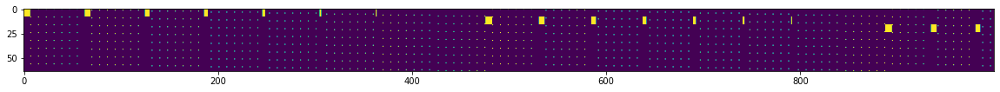

In [9]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

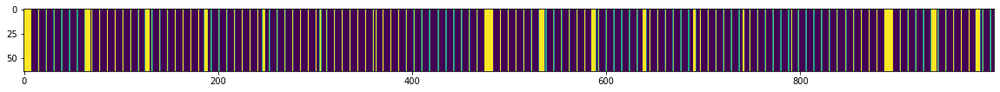

In [10]:
# all
plt.figure(figsize = figsize)
plt.imshow((xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

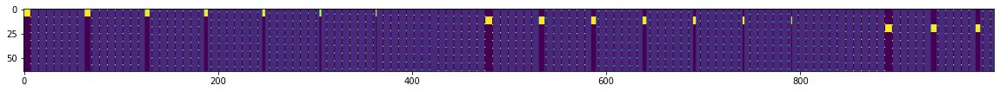

In [11]:
# all
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [12]:
Counter(list((xy/xyind).reshape(-1))).most_common()

[(0.9999999999999988, 64288),
 (0.9999999999999986, 21952),
 (2.8672000000000013e-96, 19600),
 (0.9999999999999989, 14112),
 (2.867200000000001e-96, 5488),
 (8.000000000000004, 2800),
 (8.000000000000002, 784)]

## Dataset

In [13]:
### One embed per query!

class GameDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return self.query_support_size * self.key_support_size
    
    def __getitem__(self, idx):
        '''
        key_idx: (xy_i) * (xy.shape[1]=self.query_support_size) + (xy_j)
        '''
        x_i, y_j = idx//self.query_support_size, idx%self.query_support_size
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0
        
        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('key\n', x_i, self.raw_data['idx_to_key'][x_i])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
        
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        )    

game_dataset = GameDataset(raw_data=game_data, debug=True)
game_dataset[10] 
print('-----')
game_dataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
key
 0 ('red', 'void')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
key
 0 ('red', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [14]:
class GameTestFullDataset(Dataset):
    
    def __init__(self, raw_data, debug=False):
        '''
        raw_data: object returned by gen_card_data.
        queries_with_shared_attr_only: bool.
        '''
        super().__init__()
        self.raw_data = raw_data
        self.debug = debug
        # y
        self.query_support_size = len(self.raw_data['idx_to_query'])
        # x
        self.key_support_size = len(self.raw_data['idx_to_key'])
        
    def __len__(self):
        return len(self.raw_data['idx_to_query'])
    
    def __getitem__(self, idx):
        '''
        key_idx: int. 0 to query_support_size-1
        '''
        y_j = idx
        x_i = torch.empty(1) # just a meaningless value
        all_matches = list(self.raw_data['query_to_keys'].get(y_j, {}).keys())
        gt = np.zeros(self.key_support_size)
        gt[all_matches] = 1.0

        if self.debug:
            yj1, yj2 = self.raw_data['idx_to_query'][y_j]
            print('query\n', y_j,":", yj1, yj2, self.raw_data['idx_to_key'][yj1], self.raw_data['idx_to_key'][yj2])
            print('all matches \n', [self.raw_data['idx_to_key'][m] for m in all_matches])
            
            
        return (
            idx, 
            torch.tensor([y_j]).long(), # query
            torch.tensor([x_i]).long(), # gt key
            torch.tensor(gt).long()     # all gt keys
        ) 
    
game_testdataset = GameTestFullDataset(raw_data=game_data, debug=True)
game_testdataset[10]
print('-----')
game_testdataset[7] # 7 has zero prob of being sampled

query
 10 : 0 11 ('red', 'void') ('green', 'checkered')
all matches 
 []
-----
query
 7 : 0 8 ('red', 'void') ('green', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]


(7,
 tensor([7]),
 tensor([0]),
 tensor([1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]))

In [15]:
class GameDataModule(pl.LightningDataModule):
    
    def __init__(self, batch_size, raw_data, seen_train_xy, seen_val_xy, debug=False):
        super().__init__()
        self.batch_size = batch_size
        self.dataset = GameDataset(raw_data=raw_data, debug=debug)
#         self.testdataset = GameTestFullDataset(raw_data=raw_data, debug=debug)
        self.seen_train_xy = seen_train_xy
        self.seen_val_xy = seen_val_xy
        self.setup_samplers()
        
    def setup_samplers(self):
        self.train_sampler = WeightedRandomSampler(
            weights=self.seen_train_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        ) 
        self.val_sampler = WeightedRandomSampler(
            weights=self.seen_val_xy.reshape(-1), num_samples=self.batch_size, replacement=True
        )
        
    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            self.train = self.dataset
            self.val = self.dataset
#         if stage == 'test' or stage is None:
#             self.test = self.testdataset
            
    def train_dataloader(self):
        train_loader = DataLoader(
            self.train, batch_size=self.batch_size, shuffle=False, sampler=self.train_sampler
        )
        return train_loader
    
    def val_dataloader(self):
        val_loader = DataLoader(
            self.val, batch_size=self.batch_size,  shuffle=False, sampler=self.val_sampler
        )
        return val_loader
    
#     def test_dataloader(self):
#         test_loader = DataLoader(
#             self.test, batch_size=self.batch_size, shuffle=False
#         )
#         return test_loader  

## Model Architecture

In [16]:
def construct_full_model(hparams):
    '''
    return: nn.Module.
    '''
    # embeddings
    query_embed_X = ScaledEmbedding(hparams['query_support_size'], hparams['d_model'])
    key_embed_X = ScaledEmbedding(hparams['key_support_size'], hparams['d_model'])
    embed_dropout = nn.Dropout(hparams['embed_dropout'])
    
    # full model
    model = EncoderPredictor(
        inp_query_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', query_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        inp_key_layer = nn.Sequential(
            OrderedDict([
                ('scaled_embed', key_embed_X),
                ('embed_dropout', embed_dropout)
            ])
        ),
        classifier = nn.Sequential(
            OrderedDict([   
                ('linear1', nn.Linear(2*hparams['d_model'], hparams['d_model'])),
                ('nonLinear1', nn.ReLU()),
                ('linear-out', nn.Linear(hparams['d_model'], 1)),
            ])
        ) if not hparams['dotproduct_bottleneck'] else None, 
        
        key_support_size = hparams['key_support_size'],
        d_model = hparams['d_model'],
        debug = hparams['debug'],
    )
    
    return model

In [17]:
class ScaledEmbedding(nn.Module):

    def __init__(self, V, d_model):
        super(ScaledEmbedding, self).__init__()
        self.embedding = nn.Embedding(V, d_model)
        # scale embedding to have variance 0.01
        nn.init.normal_(self.embedding.weight, mean=0., std=(0.01)**(1/2))
        self.d_model = d_model

    def forward(self, tokens):
        '''
        tokens: shape (batch_size=b, len)
        '''
        # shape (b, len, d_model)
        embedded = self.embedding(tokens) * math.sqrt(self.d_model)
        if torch.max(embedded) > 2000.:
            import pdb; pdb.set_trace()
        return embedded

In [18]:
class EncoderPredictor(nn.Module):
    
    def __init__(self, inp_query_layer, inp_key_layer, classifier, key_support_size, d_model, debug=False):
        super().__init__()
        self.inp_query_layer = inp_query_layer
        self.inp_key_layer = inp_key_layer
        self.classifier = classifier
        self.key_support_size = key_support_size
        self.d_model = d_model
        
    def forward(self, X_query, X_key, val_bool, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1) if test bool, else (b, num matched cards) or None.
        '''
        if X_key is not None: assert X_query.shape == X_key.shape
        if val_bool:
            return self.forward_norm_support(X_query, debug=debug)
        else:
            assert X_key is not None, 'X_key should not be None for normalizing over minibatch keys.'
            return self.forward_norm_minibatch(X_query, X_key, debug=debug)

    def forward_norm_minibatch(self, X_query, X_key, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)
        
        # shape(b, d_model)
        key_repr = self.encode_key(X_key).squeeze(1)
        assert key_repr.shape == (b, self.d_model)

        if self.classifier:
            # shape(b, b, d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, b, self.d_model)
            # shape(b, b, d_model)
            key_repr_tiled = key_repr.unsqueeze(0).expand(b, b, self.d_model)
            # shape(b, b, 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            assert query_key_concat.shape == (b, b, 2*self.d_model)
            # shape(b*b, 2*d_model)
            query_key_concat = query_key_concat.reshape(b*b, 2*self.d_model)
            # shape(b*b, 1)
            logits = self.classifier(query_key_concat)
            assert logits.shape == (b*b, 1)
            # shape(b, b)
            logits = logits.squeeze(1).reshape(b, b)
        else:
            # shape(b, b) dotproduct=logit matrix
            logits = torch.matmul(query_repr, key_repr.T)
        assert logits.shape == (b, b)
        
        # shape(b, b)
        return logits

    def forward_norm_support(self, X_query, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        
        # shape(b, d_model)
        query_repr = self.encode_query(X_query).squeeze(1)
        assert query_repr.shape == (b, self.d_model)

        # shape(size(support), d_model)
        keys_repr = self.encode_all_keys()
        assert keys_repr.shape == (self.key_support_size, self.d_model)
        
        if self.classifier:
            # shape(b, size(support), d_model)
            query_repr_tiled = query_repr.unsqueeze(1).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), d_model)
            key_repr_tiled = keys_repr.unsqueeze(0).expand(b, self.key_support_size, self.d_model)
            # shape(b, size(support), 2*d_model)
            query_key_concat = torch.cat([query_repr_tiled, key_repr_tiled], dim=2)
            # shape(b*size(support), 2*d_model)
            query_key_concat = query_key_concat.reshape(b*self.key_support_size, 2*self.d_model)
            # shape(b*size(support), 1)
            logits = self.classifier(query_key_concat)
            # shape(b, size(support))
            logits = logits.squeeze(1).reshape(b, self.key_support_size)
        else:
            # shape(b, size(support)) dotproduct=logit matrix
            logits = torch.matmul(query_repr, keys_repr.T)
        assert logits.shape == (b, self.key_support_size)
        
        # shape(b, size(support)) 
        return logits

    def encode_query(self, X):
        '''
        X: (batch_size=b,1)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_query_layer(X)
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed     
        
    def encode_key(self, X):
        '''
        X: (batch_size=b)
        '''
        b = X.shape[0] 
        # shape(b, 1, embed_dim)
        inp_embed = self.inp_key_layer(X) 
        assert inp_embed.shape == (b, 1, self.d_model)
        return inp_embed  

    def encode_all_keys(self):
        
        # shape(size(support), embed_dim)
        all_embed = self.inp_key_layer.scaled_embed.embedding.weight
        assert all_embed.requires_grad == True
        assert all_embed.shape == (self.key_support_size, self.d_model)
        
        return all_embed

## Loss, Metric

In [19]:
class InfoCELoss(nn.Module):
    '''
    InfoCE Loss on a (b, b) logits matrix with Temperature scaling
    '''

    def __init__(self, temperature_const=1.0):
        super().__init__()
        self.temperature_const = temperature_const
        self.CE_loss = nn.CrossEntropyLoss(reduction='sum')

    def forward(self, logits, debug=False):
        '''
        logits: shape (batch_size=b, b)
        '''
        assert logits.shape[0] == logits.shape[1]
        b = logits.shape[0]
        
        logits /= self.temperature_const
        
        labels = torch.arange(b).type_as(logits).long()
        sum_loss_per_row = self.CE_loss(logits, labels)
        sum_loss_per_col = self.CE_loss(logits.T, labels)
        
        if debug:
            print('sum_loss_per_row=',sum_loss_per_row)
            print('sum_loss_per_col=',sum_loss_per_col)

        loss = (sum_loss_per_row + sum_loss_per_col) * 0.5
        return loss


# ---------------------------    
loss_criterion = InfoCELoss(temperature_const=0.1)

logits = torch.tensor([
    [1.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))
print('-------------')
logits = torch.tensor([
    [3.,2.,3.],
    [6.,7.,4.],
    [5.,8.,9.]
])
print('avg loss=',loss_criterion(logits, True))


# ref
# sum_loss_per_row= tensor(20.0001)
# sum_loss_per_col= tensor(60.0001)
# avg loss= tensor(40.0001)
# -------------
# sum_loss_per_row= tensor(0.6933)
# sum_loss_per_col= tensor(40.0001)
# avg loss= tensor(20.3467)

sum_loss_per_row= tensor(20.0001)
sum_loss_per_col= tensor(60.0001)
avg loss= tensor(40.0001)
-------------
sum_loss_per_row= tensor(0.6933)
sum_loss_per_col= tensor(40.0001)
avg loss= tensor(20.3467)


In [20]:
class ThresholdedMetrics(nn.Module):
    
    def __init__(self, raw_data):
        '''
        tot_k: total number of candidates. e.g. 81 cards
        '''
        super().__init__()
        self.raw_data = raw_data
        self.key_support_size = len(self.raw_data['idx_to_key'])
        self.threshold = 1.0 / (self.key_support_size)
        self.softmax = nn.Softmax(dim=1)

    def breakdown_errors(self, X_query, corrects):
        '''
        X_query: shape (b,1) (if one embed per query)
        corrects: shape (b, support size)
        '''
        b = X_query.shape[0]
        assert corrects.shape == (b, self.key_support_size)
        
        X_query_list = X_query.squeeze(-1)
        wrongs = (1 - corrects).cpu().numpy()
        
        num_matched_concepts = [
             self.raw_data['query_to_keys'].get(X_query_list[batch_i].item(), {}).get(card_idx, 0)
            for batch_i in range(b) for card_idx in range(self.key_support_size)  
        ]
        
        num_matched_concepts = np.array(num_matched_concepts).reshape(b, self.key_support_size)
        assert num_matched_concepts.shape == wrongs.shape
        
        wrongs_mask = wrongs.reshape(-1).tolist()
        num_matched_concepts = num_matched_concepts.reshape(-1).tolist()

        error_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        total_count_by_num_matched_concepts = {k:0 for k in range(num_attributes)}
        for w,k in zip(wrongs_mask, num_matched_concepts):
            if w == 1:
                error_count_by_num_matched_concepts[k] += 1
            total_count_by_num_matched_concepts[k] += 1    

        error_counts, total_counts = {}, {}
        for k in range(num_attributes):
            err_ct = error_count_by_num_matched_concepts[k]
            tot_ct = total_count_by_num_matched_concepts[k]
            error_counts[f'error_rate_for_{k}_matched_concepts'] = 0 if tot_ct == 0 else (err_ct *1.0 / tot_ct)
            total_counts[f'total_count_for_{k}_matched_concepts'] = tot_ct

        return {**error_counts, **total_counts}    
    
    def forward(self, X_query, logits, X_keys, full_test_bool=False, breakdown_errors_bool=False, debug=False):
        b = X_query.shape[0]
        assert X_query.shape == (b, 1)
        b, key_support_size = logits.shape
        assert key_support_size == self.key_support_size
        assert logits.shape == X_keys.shape
        
        if full_test_bool:
            # filter down to query cards with >0 true matches
            queryIdxs_with_nonzero_matches = list(self.raw_data['query_to_keys'].keys())
            X_query_flat = X_query.squeeze(-1)
            fil = torch.stack([(X_query_flat == qId) for qId in queryIdxs_with_nonzero_matches], dim=1).any(dim=1)
            assert fil.shape == (b, )
            
            # queries with shared attributes
            fil_metrics = self.compute_metrics(X_query[fil], logits[fil], X_keys[fil], breakdown_errors_bool, debug)
            fil_metrics = {'nonNullQueries_'+k:fil_metrics[k] for k in fil_metrics}
            
            # queries without shared attributes
            not_fil = torch.logical_not(fil)
            not_fil_metrics = self.compute_metrics(X_query[not_fil], logits[not_fil], X_keys[not_fil], breakdown_errors_bool, debug)
            not_fil_metrics = {'NullQueries_'+k:not_fil_metrics[k] for k in not_fil_metrics}
            
            # all queries
            all_metrics = self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
            
            return {**fil_metrics, **not_fil_metrics, **all_metrics}
        else:
            return self.compute_metrics(X_query, logits, X_keys, breakdown_errors_bool, debug)
    
    def compute_metrics(self, X_query, logits, X_keys, breakdown_errors_bool=False, debug=False):
        '''
        X_query: shape (b,1) (if one embed per query)
        logits: shape (b, support size)
        X_keys: shape (b, support size). value 1.0 at where card matches. value 0 otherwise.
        '''
        b, key_support_size = logits.shape
        
        # model predictions, shape (b, support size)
        binary_predictions = (self.softmax(logits) >= self.threshold).type(torch.float)
        # ground truth, shape (b, support size)
        gt = X_keys
        # correct predictions, shape (b, support size)
        corrects = (binary_predictions == gt).type(torch.float)
        
        # accuracy, computed per query, average across queries
        # (b,)
        accuracy_row = torch.sum(corrects, dim=1) / key_support_size
        # scalar
        accuracy_meanrows = torch.mean(accuracy_row)
        # accuracy, computed per query-key, average across all
        accuracy_all = torch.sum(corrects) / (b * key_support_size)
        
        # precision, computed per query, average across queries
        # (b,)
        precision_row = torch.sum((corrects * binary_predictions), dim=1) / torch.sum(binary_predictions, dim=1)
        # scalar
        precision_meanrows = torch.mean(precision_row)
        # precision, computed per query-key, average across all
        precision_all = torch.sum((corrects * binary_predictions)) / torch.sum(binary_predictions)

        # recall, computed per query, average across queries
        # (b,)
        recall_row = torch.sum((corrects * gt), dim=1) / torch.sum(gt, dim=1)
        # scalar
        recall_meanrows = torch.mean(recall_row)
        # recall, computed per query-key, average across all
        recall_all = torch.sum((corrects * gt)) / torch.sum(gt)
        
        # f1, computed per query, average across queries
        # (b,)
        f1_row = 2 * (precision_row * recall_row) / (precision_row + recall_row)
        # scalar
        f1_meanrows = torch.mean(f1_row)
        # f1, computed per query-key, average across all
        f1_all = (precision_all * recall_all) / (precision_all + recall_all)
        
        if breakdown_errors_bool:
            error_breakdown_by_num_matched_concepts = self.breakdown_errors(X_query, corrects)
        else:
            error_breakdown_by_num_matched_concepts = {} 
            
        if debug:
            print('####################################################')
            print('Metrics Per Query:')
            print('accuracy_rows', accuracy_row)
            print('precision_row', precision_row)
            print('recall_row', recall_row)
            print('f1_row', f1_row)
            print('####################################################')
            print('Metrics Averaged Across Queries')
            print('accuracy_meanrows', accuracy_meanrows)
            print('precision_meanrows', precision_meanrows)
            print('recall_meanrows', recall_meanrows)
            print('f1_meanrows', f1_meanrows)
            print('####################################################')
            print('Metrics Averaged Across All Query-Key Pairs:')
            print('accuracy_all', accuracy_all)
            print('precision_all', precision_all)
            print('recall_all', recall_all)
            print('f1_all', f1_all)
            print('####################################################')
            print('error_breakdown', error_breakdown_by_num_matched_concepts)
            
        metrics = {
            'accuracy_by_Query': accuracy_meanrows,
            'precision_by_Query': precision_meanrows,
            'recall_by_Query': recall_meanrows,
            'f1_by_Query': f1_meanrows,
            'accuracy_by_QueryKey': accuracy_all,
            'precision_by_QueryKey': precision_all,
            'recall_by_QueryKey': recall_all,
            'f1_by_QueryKey': f1_all
        }
        metrics = {
            **metrics, **error_breakdown_by_num_matched_concepts
        }
        return metrics


def test_metric_module():
    key_support_size=3
    thresh=1./key_support_size

    m_f = ThresholdedMetrics(raw_data=game_data)
    m_f.key_support_size = 3

    logits = torch.tensor(
        [
            [thresh, thresh, thresh],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    print('----------------------------------------------')
    
    logits = torch.tensor(
        [
            [0.4, 0.2, 0.4],
            [thresh, thresh, thresh],
            [thresh, thresh, thresh]
        ]
    )
    X_keys = torch.tensor(
        [
            [1,0,0],
            [0,1,0],
            [1,1,1]
        ]
    )

    print(m_f(None, logits, X_keys, debug=True))
    
    
# test_metric_module()

# reference output
# accuracy_row tensor([0.3333, 0.3333, 1.0000])
# precision_row tensor([0.3333, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.5000, 0.5000, 1.0000])
# {'accuracy': tensor(0.5556), 'precision': tensor(0.5556), 'recall': tensor(1.), 'f1': tensor(0.6667)}
# ----------------------------------------------
# accuracy_row tensor([0.6667, 0.3333, 1.0000])
# precision_row tensor([0.5000, 0.3333, 1.0000])
# recall_row tensor([1., 1., 1.])
# f1_row tensor([0.6667, 0.5000, 1.0000])
# {'accuracy': tensor(0.6667), 'precision': tensor(0.6111), 'recall': tensor(1.), 'f1': tensor(0.7222)}

## Training Module

In [21]:
# Build Lightning Module
# https://colab.research.google.com/drive/1F_RNcHzTfFuQf-LeKvSlud6x7jXYkG31#scrollTo=UIXLW8CO-W8w

thresholded_metrics = ThresholdedMetrics(raw_data=game_data)

class TrainModule(pl.LightningModule):
    
    def __init__(self, hparams, gt_distributions):
        '''
        hparams: dictionary of hyperparams
        gt_distributions: dictionary that stores the groundtruth 'xy', 'xyind' distributions.
                         each is a key_support_size by query_support_size matrix that sums up to 1.0
        '''
        super().__init__()
        self.hparams = hparams
        self.debug = hparams['debug']
        self.save_hyperparameters()
        
        self.model = construct_full_model(hparams)
        self.loss_criterion = InfoCELoss(temperature_const=self.hparams['loss_temperature_const'])
        self.metrics = thresholded_metrics

        self.key_support_size = self.hparams['key_support_size']
        self.query_support_size = self.hparams['query_support_size']
        
        # for pulling model p(x,y) and p(x,y)/[pxpy]
        self.populate_logits_matrix = hparams['populate_logits_matrix']
        if self.populate_logits_matrix:
            self.register_buffer(
                name='model_logits_matrix',
                tensor= torch.zeros(hparams['key_support_size'], hparams['query_support_size'])
            )
            self.setup_gt_distributions(gt_distributions)
        
    def log_metrics(self, metrics_dict):
        for k, v in metrics_dict.items():
            self.log(k, v)
            
    def get_max_memory_alloc(self):
        devices_max_memory_alloc = {}
        for i in range(torch.cuda.device_count()):
            device = torch.device(f'cuda:{i}')
            devices_max_memory_alloc[device] = torch.cuda.max_memory_allocated(device) / 1e6
            torch.cuda.reset_max_memory_allocated(device)
        return devices_max_memory_alloc
    
    ###################################################
    
    def forward(self, X_query, X_key, X_keys, val_bool, full_test_bool=False, debug=False):
        '''
        X_query: (b, 1)
        X_key: (b, 1)
        X_keys: (b, key_support_size) 1s and 0s.
        test_bool: boolean.
        '''
        batch_size = X_query.shape[0]
        
        # ToDo batch_size_b
        
        # shape (b,support) if test_bool else (b, b)
        logits = self.model(X_query, X_key, val_bool, debug=debug)
        # scalar
        loss = None if val_bool else self.loss_criterion(logits, debug=debug)
        # scalar
        metrics = self.metrics(
            logits=logits, X_keys=X_keys, X_query=X_query, 
            debug=debug, full_test_bool=full_test_bool, breakdown_errors_bool=True, 
        ) if val_bool else None

        return logits, loss, metrics
    
    ###################################################
    
    def setup_gt_distributions(self, gt_distributions):
        '''called once during init to setup groundtruth distributions'''
        assert gt_distributions['xy'].shape == gt_distributions['xyind'].shape
        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy',
            tensor= torch.tensor(gt_distributions['xy'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xyind',
            tensor= torch.tensor(gt_distributions['xyind'])
        )        
        # (key_support_size, query_support_size)
        self.register_buffer(
            name='gt_xy_div_xyind',
            tensor= self.gt_xy/self.gt_xyind
        )
        # scalar
        self.register_buffer(
            name='one',
            tensor= torch.tensor([1.0])
        )   
        # scalar
        self.register_buffer(
            name='gt_mi',
            tensor= self.compute_mutual_information(self.gt_xy, self.gt_xy_div_xyind)
        ) 
   
    
    def populate_model_logits_matrix(self, query_idx, logits):
        '''
        query_idx: shape (b,)
        logits: shape(b, key_support_size)
        '''  
        assert query_idx.shape[0] == logits.shape[0]
        b = query_idx.shape[0]
        assert logits.shape[1] == self.key_support_size
        for i in range(b):
            self.model_logits_matrix[:,query_idx[i]] = logits[i]
    
    def compute_mutual_information(self, xy, xy_div_xyind):
        '''
        xy: p(xy). shape(b, key_support_size)
        xy_div_xyind_hat: p(xy)/[p(x)(y)].
                          shape(b, key_support_size)
        '''
        assert torch.isclose(torch.sum(xy), self.one.type_as(xy))
        assert xy.shape == xy_div_xyind.shape == (
            self.key_support_size, self.query_support_size
        )
        pmi = torch.log(xy_div_xyind)
        mi = torch.sum(xy * pmi)
        return mi
    
    def pull_model_distribution(self, debug=True):

        # sanity check
        sum_logits = torch.sum(self.model_logits_matrix)
        assert sum_logits != 0.0
        
        if debug:
            print('Sum of model logits matrix\n', sum_logits)
            print('Number of model logits with zero value\n', torch.sum(self.model_logits_matrix == 0.0)) 
            print('Variance of model logits\n', torch.var(self.model_logits_matrix))
        
        # estimate the full distribution
        # hat( k * pxy/(pxpy)
        f = torch.exp(self.model_logits_matrix)
        # hat( k * pxy)
        xy_hat = f * self.gt_xyind
        # hat( pxy)
        xy_hat = (xy_hat / torch.sum(xy_hat))
        
        # estimate exp(pmi)
        # hat(k)
        k_hat = torch.sum(f) / torch.sum(self.gt_xy_div_xyind)
        # hat(pxy/(pxpy)
        xy_div_xyind_hat = (f / k_hat)
        if torch.any(torch.isnan(xy_div_xyind_hat)):
            import pdb; pdb.set_trace()
        
        # estimate MI
        # scalar
        mi_hat = self.compute_mutual_information(xy_hat, xy_div_xyind_hat)
        # scalar
        mi_gt_minus_hat = self.gt_mi - mi_hat
        
        # estimate KL divergence
        kl_div_val = F.kl_div(torch.log(xy_hat), self.gt_xy)

        # estimate ranks
        xy_hat = xy_hat.detach().cpu().numpy()
        xy_div_xyind_hat = xy_div_xyind_hat.detach().cpu().numpy()
        # hat(pxy rank)
        xy_hat_rank = np.linalg.matrix_rank(xy_hat)
        # hat(pxy/(pxpy rank)
        xy_div_xyind_hat_rank = np.linalg.matrix_rank(xy_div_xyind_hat) 
        
        pulled_distribution_results = {
            'xy_hat':xy_hat,
            'xy_div_xyind_hat':xy_div_xyind_hat,
            'xy_hat_rank':xy_hat_rank,
            'xy_div_xyind_hat_rank':xy_div_xyind_hat_rank,
            'mi_hat':mi_hat,
            'mi_gt_minus_hat':mi_gt_minus_hat,
            'kl_div':kl_div_val
        }
        
        return pulled_distribution_results

    ###################################################
    
    def training_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        # scalar
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        # dict
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('train step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\nX_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:\n', [(m,metrics[m]) for m in metrics]
            )
        
        # log
        step_metrics = {**{'train_loss': loss}, **{'train_'+m:metrics[m] for m in metrics}}
        self.log_metrics(step_metrics)
        return loss
    
    def validation_step(self, batch, batch_nb):
        
        # _, (b, 1), (b, 1), (b, support size)
        _, X_query, X_key, X_keys = batch
        _, loss, _ = self(X_query, X_key, None, val_bool=False, debug=self.debug)
        _, _, metrics = self(X_query, None, X_keys, val_bool=True, debug=self.debug)
        
        if self.debug:
            print('-----------------------------')
            print('validation step')
            print(Counter(torch.sum(X_keys, dim=1).tolist()).most_common())
            print(
                'X_query:',X_query[0], '\X_key:',
                X_key[0], '\nloss:', loss, '\nmetrics:', [(m,metrics[m]) for m in metrics]
            )
            
        # log 
        step_metrics = {**{'val_loss': loss}, **{'val_'+m:metrics[m] for m in metrics}}
        devices_max_memory_alloc = self.get_max_memory_alloc()
        for device, val in devices_max_memory_alloc.items():
            step_metrics[f'step_max_memory_alloc_cuda:{device}'] = val
        self.log_metrics(step_metrics)
        return step_metrics
    
    def test_step(self, batch, batch_nb):
        
        # (b,1), (b,1), _, (b, support size)
        query_idx, X_query, _, X_keys = batch
        
        # compute scores for all keys
        # shape(b, key_support_size), _, dictionary
        logits, _, metrics = self(X_query, None, X_keys, val_bool=True, full_test_bool=True, debug=self.debug)
        
        if self.populate_logits_matrix:
            self.populate_model_logits_matrix(query_idx, logits)
        
        # log
        step_metrics = {'test_'+m:metrics[m] for m in metrics}
        self.log_metrics(step_metrics)
        return step_metrics 
    
    ###################################################
    
    def aggregate_metrics_at_epoch_end(self, outputs):
        # log metrics
        epoch_metrics = {}
        metric_names = outputs[0].keys()
        for m in metric_names:
            if not ('max_memory_alloc_cuda' in m or 'count' in m or 'rate' in m):
                epoch_metrics['avg_'+m] = torch.stack([x[m] for x in outputs]).mean()
            elif '_matched_concepts' in m:
                epoch_metrics['avg_'+m] = np.mean([x[m] for x in outputs])
        self.log_metrics(epoch_metrics)
        return epoch_metrics         
    
    def validation_epoch_end(self, outputs):
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        return averaged_metrics
    
    def test_epoch_end(self, outputs):        
        averaged_metrics = self.aggregate_metrics_at_epoch_end(outputs)
        try:
            assert 'avg_test_error_rate_for_1_matched_concepts' in averaged_metrics
        except:
            import pdb; pdb.set_trace()
            
        return averaged_metrics
    
    ###################################################
    
    def configure_optimizers(self):
        opt = torch.optim.Adam(
            params=self.model.parameters(),
            lr=self.hparams['lr'],
            betas=(
                self.hparams['adam_beta1'], self.hparams['adam_beta2']),
            eps=self.hparams['adam_epsilon'],
            weight_decay=self.hparams['adam_weight_decay']
        )
        return opt

## hparams, init train module

In [24]:
# W&B References
# https://docs.wandb.com/library/integrations/lightning
# colab example
# https://colab.research.google.com/github/wandb/examples/blob/master/colabs/pytorch-lightning/Supercharge_your_Training_with_Pytorch_Lightning_%2B_Weights_%26_Biases.ipynb
# step by step guide
# https://wandb.ai/cayush/pytorchlightning/reports/Use-Pytorch-Lightning-with-Weights-Biases--Vmlldzo2NjQ1Mw


# Distributed Weighted Sampler
# https://discuss.pytorch.org/t/how-to-use-my-own-sampler-when-i-already-use-distributedsampler/62143/8
# https://github.com/PyTorchLightning/pytorch-lightning/discussions/3716#discussioncomment-238296

# torch lightning -- how sampler is added or removed
# https://pytorch-lightning.readthedocs.io/en/stable/multi_gpu.html?highlight=sampler#remove-samplers


hparams = {
    # game difficulty
    'num_attributes': num_attributes,
    'num_attr_vals': num_attr_vals,
    # distribution
    'distribution_epsilon': distribution_epsilon,
    'xy_size': xy.shape,
    # 
    'batch_size': 128,
    # Arch
    'key_support_size': len(game_data['idx_to_key']),
    'query_support_size': len(game_data['idx_to_query']),
    # embedding
    'd_model': 128,
    'embed_dropout': 0.0,
    # final prediction
    'dotproduct_bottleneck':True,
    # loss
    'loss_temperature_const': 1.0,
    # optimizer
    'lr': 0.001,
    'adam_beta1': 0.9,
    'adam_beta2': 0.999,
    'adam_epsilon': 1e-08,
    'warmup_steps': 12000,
    'adam_weight_decay':0,
    'gradient_clip_val': 0,
    # others
    'debug':False,
    'populate_logits_matrix': True
}

pl.seed_everything(42)

# model
trainmodule =  TrainModule(hparams, gt_distributions={'xy':xy, 'xyind':xyind})# , raw_data=game_data)
model_summary = pl.core.memory.ModelSummary(trainmodule, mode='full')
print(model_summary,'\n')

# data
game_datamodule = GameDataModule(
    batch_size = hparams['batch_size'],
    raw_data = game_data,
    seen_train_xy = xy,
    seen_val_xy = xy,
    debug=hparams['debug']
)

# logger
run_name = 'CardGame:OR;attr{}-val{};epsilon{};d_model{};params{}K-dotproduct'.format(num_attributes, num_attr_vals, str(distribution_epsilon), hparams['d_model'], round(max(model_summary.param_nums)/1000,2))
project_name = 'ContrastiveLearning-cardgame-Scaling'
wd_logger = WandbLogger(name=run_name, project=project_name)
print('RUN NAME :\n', run_name)
# check point path
ckpt_dir_PATH = os.path.join('checkpoints', project_name, run_name)

Global seed set to 42


   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 266 K 
1  | model.inp_query_layer                        | Sequential         | 258 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 258 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 258 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 8.2 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 8.2 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 8.2 K 
8  | loss_criterion                               | InfoCELoss         | 0     
9  | loss_criterion.CE_loss                       | CrossEntropyLoss   | 0     
10 | metrics                      

## Run Training

In [25]:
# checkpoints
os.makedirs(ckpt_dir_PATH, exist_ok=True)
checkpoint_callback = ModelCheckpoint(
    monitor='avg_val_accuracy_by_Query',
    dirpath=ckpt_dir_PATH,
    filename='{epoch:02d}-{val_loss:.2f}',
    save_top_k=6,
    save_last=True,
    mode='max',
)

# trainer
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=60000, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

#fit
with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

GPU available: True, used: True
TPU available: None, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
<ipython-input-25-e10bd6447acb>:26: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with torch.autograd.detect_anomaly():


wandb: WARNING Serializing object of type ndarray that is 1032304 bytes
wandb: WARNING Serializing object of type ndarray that is 1032304 bytes

   | Name                                         | Type               | Params
-------------------------------------------------------------------------------------
0  | model                                        | EncoderPredictor   | 266 K 
1  | model.inp_query_layer                        | Sequential         | 258 K 
2  | model.inp_query_layer.scaled_embed           | ScaledEmbedding    | 258 K 
3  | model.inp_query_layer.scaled_embed.embedding | Embedding          | 258 K 
4  | model.inp_query_layer.embed_dropout          | Dropout            | 0     
5  | model.inp_key_layer                          | Sequential         | 8.2 K 
6  | model.inp_key_layer.scaled_embed             | ScaledEmbedding    | 8.2 K 
7  | model.inp_key_layer.scaled_embed.embedding   | Embedding          | 8.2 K 
8  | loss_criterion                              

Validation sanity check:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 0:  50%|█████     | 1/2 [00:00<00:00,  5.73it/s, loss=4.48e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Validating:   0%|          | 0/1 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/torch/cuda/memory.py:231: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  warnings.warn(
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The validation_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)
/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


Epoch 1:  50%|█████     | 1/2 [00:00<00:00,  9.04it/s, loss=4.44e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2:  50%|█████     | 1/2 [00:00<00:00,  9.45it/s, loss=4.45e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3:  50%|█████     | 1/2 [00:00<00:00,  9.57it/s, loss=4.41e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=4.37e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5:  50%|█████     | 1/2 [00:00<00:00,  9.55it/s, loss=4.39e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6:  50%|█████     | 1/2 [00:00<00:00,  7.93it/s, loss=4.38e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7:  50%|█████     | 1/2 [00:00<00:00,  7.86it/s, loss=4.36e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8:  50%|█████     | 1/2 [00:00<00:00,  7.80it/s, loss=4.32e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=4.31e+03, v_num=39pm]
Validating: 0i

Epoch 39: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=3.12e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=3.08e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=3.04e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=3.01e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=2.98e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=2.94e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=2.91e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=2.88e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=2.83e+03, v_num=39pm]
Valid

Epoch 77: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=1.99e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 78: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=1.96e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 79: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=1.96e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 80: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=1.95e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 81: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=1.93e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 82: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=1.92e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 83: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=1.92e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 84: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=1.89e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 85: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=1.87e+03, v_num=39pm]
Valid

Epoch 115: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=1.47e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 116: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=1.45e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 117: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=1.44e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 118: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=1.41e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 119: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=1.39e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 120:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=1.39e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 121: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=1.37e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 122: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=1.35e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 123: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=1.35e+03, v_num=39

Epoch 152: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=1.13e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 153: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=1.12e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 154: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=1.11e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 155: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=1.11e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 156: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=1.1e+03, v_num=39pm] 
Validating: 0it [00:00, ?it/s]
Epoch 157: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=1.09e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 158: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=1.08e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 159: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=1.07e+03, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 160: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=1.07e+03, v_num=39

Epoch 189: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=925, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 190: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=927, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 191: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=921, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 192: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=910, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 193: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=907, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 194: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=905, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 195: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=901, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 196: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=897, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 197: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=882, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 198:

Epoch 229: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=762, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 230: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=761, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 231: 100%|██████████| 2/2 [00:00<00:00, 14.95it/s, loss=761, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 232: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=761, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 233: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=753, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 234: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=750, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 235: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=753, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 236: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=754, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 237: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=749, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 238:

Epoch 268: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=651, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 269: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=648, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 270: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=646, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 271: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=637, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 272: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=635, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 273: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=631, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 274: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=635, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 275: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=633, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 276: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=631, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 277:

Validating: 0it [00:00, ?it/s]
Epoch 308: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=564, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 309: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=566, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 310: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=565, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 311: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=568, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 312: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=564, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 313: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=559, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 314: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=559, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 315: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=555, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 316: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=553, v_num=39pm]
Validating

Validating: 0it [00:00, ?it/s]
Epoch 347: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=531, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 348: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=534, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 349: 100%|██████████| 2/2 [00:00<00:00,  7.66it/s, loss=535, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 350: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=537, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 351: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=536, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 352: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=533, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 353: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=532, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 354: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=529, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 355: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=525, v_num=39pm]
Validating

Epoch 384: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=511, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 385: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=508, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 386: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=509, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 387: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=510, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 388: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=510, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 389: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=509, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 390: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=508, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 391: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=508, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 392: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=505, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 393:

Validating: 0it [00:00, ?it/s]
Epoch 423: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=492, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 424: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=491, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 425: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=490, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 426: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=491, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 427: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=489, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 428: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=490, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 429: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=490, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 430: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=490, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 431: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=491, v_num=39pm]
Validating

Epoch 462: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=496, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 463: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=495, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 464: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=495, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 465: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=496, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 466: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=496, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 467: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=494, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 468: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=491, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 469: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=489, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 470: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=489, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 471:

Epoch 501: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=495, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 502: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=494, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 503: 100%|██████████| 2/2 [00:00<00:00, 13.70it/s, loss=493, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 504:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=492, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 505: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=491, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 506: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=489, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 507: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=487, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 508: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=487, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 509: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=484, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 510:

Epoch 538: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 539: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 540: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 541: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=481, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 542: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 543: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=479, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 544: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 545: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=477, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 546: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 547:

Epoch 576: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=475, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 577: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=475, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 578: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 579: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 580: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 581: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 582: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 583: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 584: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 585:

Epoch 615: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 616: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=471, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 617: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=472, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 618: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 619: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=471, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 620: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=472, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 621: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 622: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=471, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 623: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=472, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 624:

Validating: 0it [00:00, ?it/s]
Epoch 655: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=475, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 656: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=474, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 657: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=475, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 658: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=475, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 659: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=474, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 660: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=472, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 661: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 662: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=472, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 663: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=472, v_num=39pm]
Validating

Epoch 692: 100%|██████████| 2/2 [00:00<00:00, 13.67it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 693: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=475, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 694: 100%|██████████| 2/2 [00:00<00:00, 15.39it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 695: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 696: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=479, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 697: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 698: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 699: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=479, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 700: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=478, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 701:

Epoch 730: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 731: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 732: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 733: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 734: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 735: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 736: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 737: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 738: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 739:

Validating: 0it [00:00, ?it/s]
Epoch 768: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 769: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=470, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 770: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 771: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=471, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 772: 100%|██████████| 2/2 [00:00<00:00, 13.52it/s, loss=472, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 773: 100%|██████████| 2/2 [00:00<00:00, 14.29it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 774: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=472, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 775: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 776: 100%|██████████| 2/2 [00:00<00:00, 13.99it/s, loss=474, v_num=39pm]
Validating

Validating: 0it [00:00, ?it/s]
Epoch 807: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 808: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 809: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 810: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 811: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 812: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 813: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 814: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 815: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=471, v_num=39pm]
Validating

Epoch 844: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=477, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 845: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=477, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 846: 100%|██████████| 2/2 [00:00<00:00, 13.81it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 847: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 848: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=477, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 849: 100%|██████████| 2/2 [00:00<00:00,  8.62it/s, loss=476, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 850: 100%|██████████| 2/2 [00:00<00:00, 15.84it/s, loss=475, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 851: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 852: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=473, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 853:

Validating: 0it [00:00, ?it/s]
Epoch 883: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 884: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 885: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 886: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 887: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 888: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 889: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 890: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 891: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=464, v_num=39pm]
Validating

Epoch 920: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 921: 100%|██████████| 2/2 [00:00<00:00, 14.81it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 922: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 923: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 924: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 925: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 926: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 927: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 928: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 929:

Validating: 0it [00:00, ?it/s]
Epoch 959: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 960: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 961: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 962: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=470, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 963: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=470, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 964: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 965: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=471, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 966: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 967: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=469, v_num=39pm]
Validating

Epoch 997: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 998: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 999: 100%|██████████| 2/2 [00:00<00:00,  8.31it/s, loss=470, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1000: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1001: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=470, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1002: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=470, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1003: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1004: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1005: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoc

Epoch 1036: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1037: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1038: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1039: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1040: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1041: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1042: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1043: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1044: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1074: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1075: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1076: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1077: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1078: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1079: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1080: 100%|██████████| 2/2 [00:00<00:00, 13.55it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1081: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1082: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 1112: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1113: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=468, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1114: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=469, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1115: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1116: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1117: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1118: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1119: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=460, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1120: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=460, v_num=39pm]
V

Epoch 1149: 100%|██████████| 2/2 [00:00<00:00,  7.64it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1150: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1151: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1152: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1153: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=460, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1154: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1155: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=460, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1156: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=460, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1157: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1187: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1188: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1189: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1190: 100%|██████████| 2/2 [00:00<00:00, 13.28it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1191: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1192: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1193: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1194: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1195: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1225: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1226: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1227: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1228: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1229: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1230: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1231: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1232: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1233: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=460, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1264: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1265: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1266: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1267: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1268: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=467, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1269: 100%|██████████| 2/2 [00:00<00:00, 15.55it/s, loss=465, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1270: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1271: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1272: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1303: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1304: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1305: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1306: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1307: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1308: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1309: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1310: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=464, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1311: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=466, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1340: 100%|██████████| 2/2 [00:00<00:00, 13.64it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1341: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1342: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1343: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1344: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1345: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1346: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=463, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1347: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1348: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=462, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1378: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1379: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1380: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1381: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1382: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1383: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=449, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1384: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=449, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1385: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1386: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1417: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1418: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=458, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1419: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1420: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1421: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=460, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1422: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1423: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1424: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1425: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1455: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=455, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1456: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=454, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1457: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=454, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1458: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=455, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1459: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1460: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1461: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1462: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1463: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1493: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=454, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1494: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=454, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1495: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1496: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1497: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1498: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1499: 100%|██████████| 2/2 [00:00<00:00,  8.13it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1500: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1501: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1531: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1532: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=455, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1533: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=454, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1534: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=455, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1535: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1536: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1537: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=455, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1538: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=454, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1539: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=455, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1569: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=458, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1570: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1571: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=454, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1572: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1573: 100%|██████████| 2/2 [00:00<00:00, 13.59it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1574: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1575: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1576: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1577: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=458, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1609: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1610: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1611: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1612: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1613: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1614: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1615: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1616: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1617: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1649: 100%|██████████| 2/2 [00:00<00:00,  8.69it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1650: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=460, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1651: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1652: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1653: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=461, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1654:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=459, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1655: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=458, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1656: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=457, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1657: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=456, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1689: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1690: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1691: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1692: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1693: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1694: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1695: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1696: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1697: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=449, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1729: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1730: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1731: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1732: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1733: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1734: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1735: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1736: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1737: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1768: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1769: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1770: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1771: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1772: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1773: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1774: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=449, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1775: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1776:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=449, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1807: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1808: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1809: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1810: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1811: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1812: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1813: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1814: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1815: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1847: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1848: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1849: 100%|██████████| 2/2 [00:00<00:00,  8.56it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1850: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1851: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1852: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1853: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1854: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1855: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1886: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1887: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1888: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1889: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1890: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1891: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1892: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1893: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=453, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1894: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=452, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1925: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=451, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1926: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1927: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1928: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1929: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1930: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1931: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1932: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1933: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 1964: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1965: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1966: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1967: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1968: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1969: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1970: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1971: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 1972: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2003: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2004: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2005: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=449, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2006: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2007: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2008: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2009: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2010: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2011: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2042: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2043: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2044: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2045:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2046: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2047: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2048: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2049: 100%|██████████| 2/2 [00:00<00:00,  8.61it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2050: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=449, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2082: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2083: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2084: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2085: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2086: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=447, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2087: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=450, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2088: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2089: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=448, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2090: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=447, v_num=39pm]
V

Epoch 2121: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2122: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2123: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2124: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2125: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2126: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2127: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2128: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2129: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 2160: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2161: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2162: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=440, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2163: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2164: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2165: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2166: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2167: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2168: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=444, v_num=39pm]
V

Epoch 2198: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2199: 100%|██████████| 2/2 [00:00<00:00,  8.58it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2200: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2201: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2202:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2203: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2204: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2205: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2206: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2238: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2239: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2240: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2241: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=440, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2242: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2243: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2244: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2245: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2246: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2276: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2277: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2278: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2279: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2280: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2281: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2282: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2283: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2284: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2315: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2316: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=440, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2317: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2318: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2319: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2320:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2321: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=440, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2322: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2323: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2355: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2356: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2357: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2358: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2359: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2360: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2361: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2362: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2363: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=440, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2394:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2395: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2396: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2397: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2398: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2399: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2400: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2401: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2402: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2433: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2434: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2435:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2436: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2437: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2438: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2439: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2440: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2441: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2471: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2472: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2473: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2474: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2475: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2476: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2477: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2478: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=441, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2479: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2510: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=446, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2511: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2512: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=445, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2513: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2514: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=444, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2515: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2516: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2517: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=443, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2518: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=442, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2548: 100%|██████████| 2/2 [00:00<00:00, 13.63it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2549: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2550: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2551: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2552: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2553:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2554: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2555: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2556: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2588: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2589: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2590: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2591: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2592: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2593: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2594: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2595: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2596:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2627: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2628: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2629: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2630: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2631: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2632: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2633: 100%|██████████| 2/2 [00:00<00:00, 13.13it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2634: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2635: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2666: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2667: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2668: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2669: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2670: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2671: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2672: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2673: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2674: 100%|██████████| 2/2 [00:00<00:00, 13.50it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2705: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2706: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2707: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2708: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2709: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2710: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2711: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2712: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2713: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2744: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2745: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2746: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2747: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2748: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2749: 100%|██████████| 2/2 [00:00<00:00,  8.76it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2750: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=440, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2751: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2752: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2784: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2785: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2786: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2787: 100%|██████████| 2/2 [00:00<00:00, 13.65it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2788:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2789: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2790: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2791: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2792: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2822: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2823: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2824: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2825: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=439, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2826: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2827: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2828: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2829: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2830: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2862: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2863: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2864: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2865: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2866: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2867: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2868: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2869: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2870: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2901: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2902: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2903: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2904: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2905: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=437, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2906: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2907: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2908: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2909: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=438, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2940: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2941: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2942: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2943: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2944: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2945: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2946: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2947: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2948: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 2978: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2979: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=436, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2980: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2981: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2982: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2983: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2984: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2985: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 2986: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=433, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3018: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3019: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3020: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3021: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3022: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3023: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3024: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3025: 100%|██████████| 2/2 [00:00<00:00, 13.77it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3026: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3058: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3059: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3060: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3061: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3062: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3063: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3064: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3065: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3066: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3096: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3097: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=435, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3098: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=434, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3099: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3100: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3101: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3102: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3103: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3104: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=432, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3135: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3136: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3137: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3138: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3139: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3140: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3141: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3142: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3143: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3175:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3176: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3177: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3178: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3179: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3180: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3181: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3182: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3183: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3215:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3216: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=431, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3217: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3218: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3219: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3220: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3221: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3222: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3223: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3255: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3256: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3257: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3258: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3259: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3260: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3261: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3262: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3263:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=426, v_num=39pm]
V

Epoch 3292: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3293: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3294: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3295: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3296: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=427, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3297: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3298:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3299: 100%|██████████| 2/2 [00:00<00:00,  8.86it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3300: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3331: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3332: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3333: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3334: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3335: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3336: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3337: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3338: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3339: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3371: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3372: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3373: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3374: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3375: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3376: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3377: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3378: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3379: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3411: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3412: 100%|██████████| 2/2 [00:00<00:00, 14.84it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3413: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=428, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3414: 100%|██████████| 2/2 [00:00<00:00, 13.57it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3415: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=429, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3416: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3417: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3418: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=430, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3419: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=431, v_num=39pm]
V

Epoch 3449: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3450: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3451: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3452:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3453: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3454: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3455: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3456: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3457: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3487: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3488: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3489: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3490: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3491: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3492: 100%|██████████| 2/2 [00:00<00:00, 13.22it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3493: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3494: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3495: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3527: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3528: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3529: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3530: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3531: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3532: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3533: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3534: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3535: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=422, v_num=39pm]
V

Epoch 3566: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3567: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3568: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3569: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3570: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3571: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3572: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3573: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3574: 100%|██████████| 2/2 [00:00<00:00, 14.41it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3607: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3608: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3609: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3610: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3611: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3612: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3613: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3614: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3615: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3645: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3646: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3647: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3648: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3649: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3650: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3651: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3652: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3653: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3684: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3685: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3686: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3687: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3688: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3689: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3690: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3691: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3692: 100%|██████████| 2/2 [00:00<00:00, 13.92it/s, loss=423, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3723: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3724: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=426, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3725: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3726: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3727: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3728: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3729: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3730: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=424, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3731: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=425, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3763: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3764: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3765: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3766: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3767: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3768: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3769: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3770:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3771: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=420, v_num=39pm]
V

Epoch 3801: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3802: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3803: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3804: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3805: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3806:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3807: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3808: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3809: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3841: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3842: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3843: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3844: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3845: 100%|██████████| 2/2 [00:00<00:00, 13.36it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3846: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3847:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3848: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3849: 100%|██████████| 2/2 [00:00<00:00,  8.53it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 3881: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3882: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3883: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3884: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3885: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3886:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3887: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3888: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3889: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=417, v_num=39pm]
V

Epoch 3919: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3920: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3921: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3922: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3923: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3924: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3925: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3926: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3927:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=422, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3958: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3959: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3960: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3961: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3962: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3963: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3964: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3965: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3966: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 3998: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 3999: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4000: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4001: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4002: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4003: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4004: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4005: 100%|██████████| 2/2 [00:00<00:00, 14.05it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4006: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=421, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4038: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4039: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4040: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4041: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4042: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4043: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4044: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4045: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=419, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4046: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=420, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4078: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4079: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4080: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4081: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4082: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4083: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4084: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4085: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4086: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4117: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4118: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4119: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4120: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4121: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4122: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4123: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4124: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4125: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4157: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4158: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4159: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4160: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4161: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4162: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4163: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4164: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4165: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=417, v_num=39pm]
V

Epoch 4196: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4197:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4198: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4199: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4200: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4201: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4202: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4203: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4204: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4236: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4237: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4238: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4239: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4240: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4241: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4242: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4243: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4244: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4275: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4276: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4277: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4278: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4279: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4280: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4281: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4282: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4283: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4314: 100%|██████████| 2/2 [00:00<00:00, 14.30it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4315: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4316: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4317: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4318: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4319: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4320: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4321: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4322: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4353: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4354: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4355: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4356: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4357: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4358: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4359: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4360: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4361: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4392: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4393: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4394: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4395: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4396: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4397: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4398: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4399: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4400: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4431: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4432: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4433: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4434: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4435: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4436: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4437: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4438: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4439: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4471: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4472: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4473: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4474: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4475: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4476: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4477: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4478: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4479: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4511: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4512: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4513: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4514: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4515: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4516: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4517: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4518: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4519: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4550: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4551: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4552: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4553: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4554: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4555: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4556: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4557: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4558: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4590: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4591: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4592: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4593: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4594: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4595: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4596: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4597: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4598: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4629: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4630: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4631: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4632: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4633: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4634: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=415, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4635: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4636: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=414, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4637:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4669: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4670: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4671: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4672: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4673:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4674: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4675: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4676: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4677: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4708: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4709: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4710: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4711: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4712: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4713: 100%|██████████| 2/2 [00:00<00:00, 13.79it/s, loss=418, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4714: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4715: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=417, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4716: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=416, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4746: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4747: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4748: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4749: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4750: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4751: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4752: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4753: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4754: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4786: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4787: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4788: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4789: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4790:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4791: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4792: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4793: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4794: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4825: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4826: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4827: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4828: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4829: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4830: 100%|██████████| 2/2 [00:00<00:00, 13.58it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4831: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4832: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4833: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4864: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4865: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4866: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4867: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4868: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4869: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4870: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4871: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4872: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 4903: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4904: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4905: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4906: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4907: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4908: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4909: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4910: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4911: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 4943: 100%|██████████| 2/2 [00:00<00:00, 13.25it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4944: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4945: 100%|██████████| 2/2 [00:00<00:00, 12.90it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4946: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4947: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=413, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4948: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4949: 100%|██████████| 2/2 [00:00<00:00,  8.81it/s, loss=412, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4950: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4951: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=411, v_num=39pm]
V

Epoch 4983: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4984: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4985: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4986: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4987: 100%|██████████| 2/2 [00:00<00:00, 13.60it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4988: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4989: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4990: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 4991: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5023: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5024: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5025: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5026: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5027: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5028: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5029: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5030: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5031: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5061: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5062: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5063: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5064: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5065: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5066: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5067: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5068: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5069: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5100: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5101: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5102: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5103: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5104: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5105: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5106: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5107:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5108: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5139: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5140: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5141: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5142: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5143: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5144: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5145: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5146: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5147: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5180: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5181: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5182: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=411, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5183: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5184: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=410, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5185: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5186: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5187: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5188: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=408, v_num=39pm]
V

Epoch 5219: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5220: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5221: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5222: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5223: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=409, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5224: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=408, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5225: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5226: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5227: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5259: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5260: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5261: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5262: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5263: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5264: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5265: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5266: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5267: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=407, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5298: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5299: 100%|██████████| 2/2 [00:00<00:00,  8.90it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5300: 100%|██████████| 2/2 [00:00<00:00, 13.95it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5301: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5302: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5303: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5304: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5305: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5306: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=406, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5337: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5338: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5339: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5340:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5341: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5342: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5343: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5344: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5345: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5376: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5377: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5378: 100%|██████████| 2/2 [00:00<00:00, 16.60it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5379: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5380: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5381: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5382: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5383: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5384: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5415: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5416: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5417: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5418: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5419: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5420: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5421: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5422: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5423: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5455: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5456: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5457: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5458: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5459: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5460: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5461: 100%|██████████| 2/2 [00:00<00:00, 15.11it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5462:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5463: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 5496: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5497: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5498: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5499: 100%|██████████| 2/2 [00:00<00:00,  7.69it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5500: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5501: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5502: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5503: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5504: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=401, v_num=39pm]
V

Epoch 5535: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5536: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5537: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5538: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5539: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5540: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5541: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5542: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5543: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5574: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5575: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5576: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5577: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5578: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5579: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5580:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5581: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5582: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5614: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5615: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5616: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5617: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5618: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5619:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5620: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5621: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5622: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5654: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5655: 100%|██████████| 2/2 [00:00<00:00, 13.38it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5656: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5657: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5658: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5659: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5660: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5661: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5662: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5691: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5692:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5693: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5694: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5695: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5696: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5697: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5698: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5699: 100%|██████████| 2/2 [00:00<00:00,  8.33it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5730: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5731: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5732: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5733: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5734: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5735: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5736: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5737: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5738: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5768: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5769: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5770: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5771: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5772: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5773: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5774: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5775: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5776: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5807: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5808: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5809: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5810: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5811: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5812: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5813: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5814: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5815: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5845: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5846: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5847: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5848: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5849: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=405, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5850: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5851: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5852: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=404, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5853: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5886: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5887: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5888: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5889: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5890: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5891: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5892: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5893: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5894: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5924: 100%|██████████| 2/2 [00:00<00:00, 13.91it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5925: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5926: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5927: 100%|██████████| 2/2 [00:00<00:00, 13.43it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5928: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5929: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5930: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5931: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5932: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 5963: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5964: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5965: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5966: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5967: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5968: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5969: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5970: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 5971: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6003: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6004: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6005: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6006: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6007: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6008: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6009: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6010: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6011: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6041: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6042: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6043: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6044: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6045: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6046: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6047: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=403, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6048: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=402, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6049: 100%|██████████| 2/2 [00:00<00:00,  8.15it/s, loss=401, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6081: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6082: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6083: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6084: 100%|██████████| 2/2 [00:00<00:00, 13.51it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6085: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6086: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6087: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6088: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6089: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=395, v_num=39pm]
V

Epoch 6119: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6120: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6121: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6122:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6123: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6124: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6125: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6126: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6127: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6159: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6160: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6161: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6162: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6163: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6164: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6165: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6166: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6167: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6198: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6199: 100%|██████████| 2/2 [00:00<00:00,  7.77it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6200: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6201: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6202: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6203: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6204: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6205: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6206: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=400, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6238: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6239: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6240: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6241: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6242: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6243: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6244: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6245: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6246: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6277: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6278: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6279: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6280:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6281: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6282: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6283: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6284: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6285: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6317: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6318: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6319: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6320: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6321: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6322: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6323: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6324:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6325: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=395, v_num=39pm]
V

Epoch 6355: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6356: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6357: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6358: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=399, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6359: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6360: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6361: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6362: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6363: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=398, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6395: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6396: 100%|██████████| 2/2 [00:00<00:00, 13.07it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6397: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6398: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6399: 100%|██████████| 2/2 [00:00<00:00,  8.96it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6400: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6401: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6402: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6403: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6434: 100%|██████████| 2/2 [00:00<00:00, 14.53it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6435: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6436: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6437: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6438: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6439: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6440: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6441: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6442: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6473: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6474: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6475: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6476: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6477: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6478: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6479: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6480: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6481: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6513: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6514: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6515: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6516: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=397, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6517: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6518: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6519: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6520:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6521: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6552: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6553: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6554: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6555: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6556: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6557: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6558: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6559: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6560: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6591: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6592: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6593: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6594: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6595: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6596: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6597: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6598: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6599: 100%|██████████| 2/2 [00:00<00:00,  8.40it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6631: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6632: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6633: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6634: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6635: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6636: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6637: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6638: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6639: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6669:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6670: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6671: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6672: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6673: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6674: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6675: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6676: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6677: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6709: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6710: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6711: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6712: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6713: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6714: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6715: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6716: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6717: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6748: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6749: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6750: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6751: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6752: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6753: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6754: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6755: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6756: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6788: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6789: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6790: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6791: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6792: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6793: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6794: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6795: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6796: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6828: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6829: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6830: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6831: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6832: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6833: 100%|██████████| 2/2 [00:00<00:00, 13.09it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6834: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6835: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6836: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6867: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6868: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6869: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6870: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6871: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6872: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6873: 100%|██████████| 2/2 [00:00<00:00, 13.71it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6874:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6875: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 6906: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6907: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6908: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6909: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6910: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6911: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6912: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6913: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6914: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=396, v_num=39pm]
V

Epoch 6945: 100%|██████████| 2/2 [00:00<00:00, 14.67it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6946: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6947: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6948: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6949: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6950: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6951: 100%|██████████| 2/2 [00:00<00:00, 14.32it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6952: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6953: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 6984: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6985: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6986: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6987: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6988: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6989: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6990: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6991: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 6992:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7022: 100%|██████████| 2/2 [00:00<00:00, 15.56it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7023: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7024: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7025: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7026: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7027: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7028: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7029: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7030: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7061: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7062: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7063: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7064: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7065: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7066: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7067: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7068: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7069: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=391, v_num=39pm]
V

Epoch 7100: 100%|██████████| 2/2 [00:00<00:00, 13.46it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7101: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7102: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7103: 100%|██████████| 2/2 [00:00<00:00, 13.33it/s, loss=396, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7104: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=395, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7105: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7106: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7107: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=394, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7108: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7140: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7141: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7142: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7143: 100%|██████████| 2/2 [00:00<00:00, 14.91it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7144: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7145: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7146: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7147:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7148: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7180: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7181: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7182: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7183: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7184: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7185: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7186: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7187: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7188: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7219: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7220: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7221: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7222: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7223: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7224: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7225: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7226: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7227: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7257: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7258: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7259: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7260: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7261: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7262: 100%|██████████| 2/2 [00:00<00:00, 13.06it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7263: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7264: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7265: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7297: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7298: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7299: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7300: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7301: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7302: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7303: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7304: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7305: 100%|██████████| 2/2 [00:00<00:00, 13.41it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7337: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7338: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7339: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7340: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7341: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7342: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7343: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7344: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7345: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=390, v_num=39pm]
V

Epoch 7375: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7376: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7377: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7378: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7379: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7380: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7381: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7382: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7383: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7415: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7416: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7417: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7418:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7419: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7420: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7421: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7422: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7423: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7456: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7457: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7458:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7459: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7460: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7461: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7462: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7463: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7464: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7495: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7496: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7497: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7498: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7499: 100%|██████████| 2/2 [00:00<00:00,  8.06it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7500: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7501: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7502: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7503: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7535: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7536: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7537: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7538:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7539: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7540: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7541: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7542: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7543: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7575: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7576: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7577: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7578: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7579: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7580: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7581: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7582: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7583: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7616: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7617: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7618: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7619: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7620: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7621: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7622: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7623: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7624: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=393, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7656: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7657: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7658: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7659: 100%|██████████| 2/2 [00:00<00:00, 15.23it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7660: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7661: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7662: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7663: 100%|██████████| 2/2 [00:00<00:00, 15.34it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7664: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7696: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7697:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7698: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7699: 100%|██████████| 2/2 [00:00<00:00,  8.43it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7700: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7701: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7702: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7703: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7704:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7737:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7738: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7739: 100%|██████████| 2/2 [00:00<00:00, 13.69it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7740: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7741: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7742: 100%|██████████| 2/2 [00:00<00:00, 14.12it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7743: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7744: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7745: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7777: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7778: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7779: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7780:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7781: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7782: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7783: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7784: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7785: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7817: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7818: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7819: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7820: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7821: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7822: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7823: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7824: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7825: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7857: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7858: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7859: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=392, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7860: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7861: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7862: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7863: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7864: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7865: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7897: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7898: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7899: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7900:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7901: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7902: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7903: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7904: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7905: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 7937: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7938:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7939: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7940: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7941: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7942: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7943: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7944: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7945: 100%|██████████| 2/2 [00:00<00:00, 13.54it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 7977: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7978:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7979: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7980: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7981: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7982: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7983: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7984: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 7985: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=386, v_num=39pm]
V

Epoch 8016: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8017: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8018:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8019: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8020: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8021: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8022: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8023: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8024: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8056: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8057: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8058: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8059: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8060: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8061: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8062:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8063: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8064: 100%|██████████| 2/2 [00:00<00:00, 14.17it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8097: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8098: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8099: 100%|██████████| 2/2 [00:00<00:00,  8.12it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8100: 100%|██████████| 2/2 [00:00<00:00, 14.14it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8101: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8102: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8103: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8104: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8105: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8137: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8138: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8139: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8140: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8141: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8142: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8143:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8144: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8145: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8177: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8178: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8179:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8180: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8181:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8182: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8183: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8184: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8185: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=388, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8216: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8217: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8218: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8219: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8220: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8221:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8222: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8223: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8224:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8256:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8257: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8258:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8259: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8260: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8261: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8262: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8263: 100%|██████████| 2/2 [00:00<00:00, 14.62it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8264: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8295: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8296: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8297: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8298:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8299: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8300: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8301: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8302: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8303: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8335: 100%|██████████| 2/2 [00:00<00:00, 13.68it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8336: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8337: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8338: 100%|██████████| 2/2 [00:00<00:00, 15.28it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8339: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8340: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8341: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8342: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8343: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8375: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8376: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8377:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8378: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8379:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8380: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=391, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8381: 100%|██████████| 2/2 [00:00<00:00, 13.73it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8382: 100%|██████████| 2/2 [00:00<00:00, 16.03it/s, loss=390, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8383: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=389, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8416: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8417: 100%|██████████| 2/2 [00:00<00:00, 14.57it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8418: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8419: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8420: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8421: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8422:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8423: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8424: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=384, v_num=39pm]
V

Epoch 8456: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8457: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8458: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8459: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8460: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8461:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8462: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8463: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8464: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8497: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8498: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8499: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8500: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8501: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8502: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8503: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8504: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8505:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8537: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8538:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8539: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8540: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8541: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8542: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8543:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8544: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8545: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8578: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8579:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8580: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8581: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8582: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8583: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8584: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8585: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8586: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=384, v_num=39pm]
V

Epoch 8618: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8619: 100%|██████████| 2/2 [00:00<00:00, 14.49it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8620: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8621: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8622: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8623: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8624: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8625: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8626: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8658: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8659: 100%|██████████| 2/2 [00:00<00:00, 16.13it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8660: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8661: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8662:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8663: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8664: 100%|██████████| 2/2 [00:00<00:00, 13.80it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8665: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8666: 100%|██████████| 2/2 [00:00<00:00, 14.83it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8699: 100%|██████████| 2/2 [00:00<00:00,  7.93it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8700: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8701: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8702: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8703: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8704: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8705: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8706: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8707: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8739: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8740: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8741: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8742: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8743: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8744: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8745: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8746: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8747: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8779: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8780: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8781: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8782: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8783: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8784: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8785: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8786: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8787: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8819: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8820: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8821:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8822: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8823: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8824: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8825: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8826: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8827: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 8859: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8860: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8861: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8862: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8863: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8864: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8865: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8866:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8867: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=385, v_num=39pm]
V

Epoch 8898: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8899: 100%|██████████| 2/2 [00:00<00:00,  8.22it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8900: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8901: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8902: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8903:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8904: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8905: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8906: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8938: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8939: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8940: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8941: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8942: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8943:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8944: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8945: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8946:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 8978:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8979: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8980: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8981: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8982: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8983: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8984: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8985: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 8986: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9018: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9019: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9020: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9021: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9022: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9023: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9024:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9025: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9026: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9057: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9058: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9059: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9060: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9061: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=387, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9062: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9063: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9064: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9065:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9097: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9098: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9099: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9100: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9101: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9102: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9103: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9104: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9105:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=383, v_num=39pm]
V

Epoch 9137: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9138: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9139: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9140: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9141: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9142: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9143: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9144: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9145:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9176: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9177: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9178: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9179: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9180: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9181:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9182: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9183:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9184: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9216: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9217: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9218: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9219: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9220: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9221: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9222: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9223: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9224: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9256: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9257: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9258: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9259: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9260: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9261: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9262: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9263: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=386, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9264: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=385, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9295: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9296: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9297:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9298:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9299: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9300: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9301: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9302: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9303: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9334: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9335: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9336: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9337: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9338: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9339: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9340: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9341:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9342: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9374: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9375: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9376: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9377:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9378: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9379:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9380: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9381: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9382: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9415: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9416: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9417: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9418: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9419:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9420:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9421:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9422: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9423: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9455: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9456: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9457: 100%|██████████| 2/2 [00:00<00:00, 14.00it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9458: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9459: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9460:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9461: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9462: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9463: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9495: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9496: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9497: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9498: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9499: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9500: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9501: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9502: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9503:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9536: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9537: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9538: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9539: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9540: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9541: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9542: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9543: 100%|██████████| 2/2 [00:00<00:00, 13.56it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9544: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9577: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9578: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9579: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9580: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9581: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9582: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9583: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9584: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9585: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9618: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9619:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9620: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9621: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9622: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9623:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9624:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9625: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9626: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9658: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9659: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9660:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9661: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9662: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9663:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=384, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9664:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9665:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9666: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9699: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9700: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9701: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9702:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9703:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9704:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9705:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9706:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9707:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9740:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9741: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9742: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9743:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9744: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9745: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9746: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9747: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9748: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9781: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9782: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9783: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9784: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9785:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9786: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9787:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9788: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9789:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9822: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9823: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9824: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9825:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9826:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9827: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9828: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9829:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9830:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 9863: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9864:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9865:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9866: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9867: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9868: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9869: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9870:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9871: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Validating: 0it [00:00, ?it/s]
Epoch 9905: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9906:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9907:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9908: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9909:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9910: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9911:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9912: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9913: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=380, v_num=39pm]
V

Validating: 0it [00:00, ?it/s]
Epoch 9946: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9947:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9948: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9949: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9950: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9951: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9952:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9953: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9954: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=382, v_num=39pm]
V

Epoch 9986: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9987: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9988: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9989: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9990: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9991: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9992: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9993: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 9994: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
E

Epoch 10027:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10028: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10029: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10030: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10031:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10032:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10033:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10034: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10035:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=381, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10068:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10069:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10070: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10071: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10072: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10073:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10074: 100%|██████████| 2/2 [00:00<00:00, 16.41it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10075: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10076:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=382, v_nu

Epoch 10108: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10109:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10110: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10111: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10112: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10113: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10114: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10115:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10116: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=381, v_num=39pm]
Validating: 0it [00:00,

Epoch 10149: 100%|██████████| 2/2 [00:00<00:00,  7.53it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10150: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10151: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10152:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10153: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10154: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10155: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10156: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10157: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=381, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10190:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10191: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10192: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10193:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10194: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10195:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=382, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10196: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10197: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=383, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10198: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=383, v_nu

Epoch 10230: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10231: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10232: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10233: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10234: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10235: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10236:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10237: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10238: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Epoch 10271: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10272: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10273: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10274: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10275:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10276: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10277: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10278:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10279: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=380, v_num=39pm]
Validating: 0it [00:00,

Epoch 10312:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10313: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10314: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10315: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10316: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10317: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10318:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10319: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10320: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Epoch 10353: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10354: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10355: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10356:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10357: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10358: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10359:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10360: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10361: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=380, v_num=39pm]
Validating: 0it [00:00,

Epoch 10394:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10395: 100%|██████████| 2/2 [00:00<00:00, 15.15it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10396: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10397: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10398:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10399: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10400: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10401: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10402: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=379, v_num=39pm]
Validating: 0it [00:00,

Epoch 10435: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10436:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10437: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10438:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10439: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10440: 100%|██████████| 2/2 [00:00<00:00, 17.21it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10441:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10442:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10443: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10475: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10476: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10477:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10478: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10479: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10480: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10481:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10482: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10483: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=378, v_nu

Epoch 10516: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10517: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10518: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10519: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10520: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10521: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10522:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10523: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10524: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=380, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10557: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10558:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10559: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10560: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10561: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10562: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10563: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10564: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10565: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=378, v_nu

Epoch 10597: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10598: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10599: 100%|██████████| 2/2 [00:00<00:00,  8.72it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10600: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10601: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10602: 100%|██████████| 2/2 [00:00<00:00, 14.68it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10603:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10604:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10605:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Epoch 10637: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10638:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10639:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10640: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10641:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10642:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10643: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10644: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10645: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=380, v_num=39pm]
Validating: 0it [00:00,

Epoch 10678: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10679: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10680:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10681: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10682: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10683:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10684: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10685: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10686: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=380, v_num=39pm]
Validating: 0it [00:00,

Epoch 10718: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10719: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10720: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10721:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10722: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10723:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10724: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10725: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10726: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=379, v_num=39pm]
Validating: 0it [00:00,

Epoch 10759: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10760: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10761: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10762:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10763: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10764: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10765: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10766: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10767: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=379, v_num=39pm]
Validating: 0it [00:00,

Epoch 10801:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10802: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10803:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10804: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10805: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10806:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10807: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10808: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10809: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Epoch 10841: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10842: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10843:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10844:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10845:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10846:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10847:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10848: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10849: 100%|██████████| 2/2 [00:00<00:00,  9.05it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Epoch 10882: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10883: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10884:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10885: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10886: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10887:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10888: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10889:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10890: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 10922:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10923:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10924: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10925: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10926: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10927:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10928: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10929: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10930: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=379, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 10963: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10964:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10965: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10966: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10967: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10968: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10969: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10970: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 10971: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=378, v_nu

Epoch 11003: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11004: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11005: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11006:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11007: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11008: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11009: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11010: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11011:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Epoch 11044: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11045: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11046:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11047: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11048: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11049: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11050: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11051: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11052: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=379, v_num=39pm]
Validating: 0it [00:00,

Epoch 11084:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=381, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11085: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11086: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11087: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11088: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11089:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11090: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11091: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11092: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11125: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11126: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11127: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11128: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11129: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11130: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11131:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11132: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11133:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_nu

Epoch 11165: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11166: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11167: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11168: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11169:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11170: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11171: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11172: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11173: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Epoch 11206: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11207: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11208: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11209:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11210:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11211: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11212: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11213: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11214: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Epoch 11247: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11248: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11249: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11250: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11251: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11252: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11253: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11254: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11255: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=379, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11288: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11289: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11290: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11291: 100%|██████████| 2/2 [00:00<00:00, 14.20it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11292: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11293: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11294: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11295: 100%|██████████| 2/2 [00:00<00:00, 16.34it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11296: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=378, v_nu

Epoch 11328: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11329: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11330: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11331: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11332: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11333:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11334:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11335: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11336:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11369: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11370: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11371: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11372: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11373: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11374: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11375:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11376: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11377: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_nu

Epoch 11409: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11410: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11411: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11412:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11413: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11414: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11415:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11416: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11417: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11450:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11451:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11452: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11453: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11454: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11455: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11456: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11457: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11458: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=378, v_nu

Epoch 11490: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11491:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11492:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11493: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11494:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11495: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11496: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11497: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11498: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Epoch 11531: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11532: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11533:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11534: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11535: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11536: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11537:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11538: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11539:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11573:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11574: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11575: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11576:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11577: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11578: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11579: 100%|██████████| 2/2 [00:00<00:00, 15.22it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11580: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11581: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=377, v_nu

Epoch 11612: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11613: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11614:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11615: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11616: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11617: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11618: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11619: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11620: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 11652:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11653: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11654:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11655: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11656: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11657:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11658:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11659:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11660: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 11692: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11693: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11694: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11695: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11696: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11697: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11698:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11699: 100%|██████████| 2/2 [00:00<00:00,  9.11it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11700: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 11732: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11733: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11734: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11735:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11736: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11737: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11738:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11739:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11740: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=380, v_num=39pm]
Validating: 0it [00:00,

Epoch 11773: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11774:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11775: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11776:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11777: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11778: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11779: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11780: 100%|██████████| 2/2 [00:00<00:00, 14.51it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11781: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 11814:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11815: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11816: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11817: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11818:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11819:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11820: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11821: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11822: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Epoch 11854: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11855: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11856: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11857: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11858: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11859: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11860:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11861: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11862:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Epoch 11895:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11896: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11897: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11898: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11899: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11900: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11901: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11902: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11903: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 11936: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11937: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11938: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11939: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11940: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11941: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11942:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11943: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11944: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=377, v_nu

Epoch 11977:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11978: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11979: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11980: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11981:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11982: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11983: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11984: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 11985: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 12017: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12018:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12019: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12020: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12021:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12022: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=379, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12023: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12024: 100%|██████████| 2/2 [00:00<00:00, 13.48it/s, loss=380, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12025:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=379, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12058: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12059: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12060:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12061:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12062: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12063: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12064: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12065:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12066: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=376, v_nu

Epoch 12098: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12099: 100%|██████████| 2/2 [00:00<00:00,  8.85it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12100: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12101: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12102: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12103: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12104: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12105: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12106: 100%|██████████| 2/2 [00:00<00:00, 15.79it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 12139: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12140: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12141: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12142: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12143: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12144:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12145:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12146:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12147: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 12179: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12180: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12181: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12182: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12183: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12184:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12185:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12186: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12187: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 12220:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12221: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12222: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12223: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12224: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12225: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12226: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12227:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12228: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12261: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12262: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12263: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12264: 100%|██████████| 2/2 [00:00<00:00, 15.04it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12265: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12266:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12267: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12268:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12269:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_nu

Epoch 12301: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12302: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12303: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12304: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12305: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12306: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12307: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12308: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12309: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 12342: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12343: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12344: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12345: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12346: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12347: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12348: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12349: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12350:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Epoch 12381: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12382: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12383: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12384:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12385:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12386: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12387: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12388:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12389: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=378, v_num=39pm]
Validating: 0it [00:00,

Epoch 12422: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12423: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12424: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12425:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12426: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12427: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12428:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12429:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12430: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=377, v_num=39pm]
Validating: 0it [00:00,

Epoch 12463: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12464: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12465: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12466: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12467: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12468: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12469: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12470: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12471: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 12504: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12505: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12506: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12507: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12508: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12509: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12510: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12511: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12512: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 12544: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12545: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12546:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12547:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12548: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12549: 100%|██████████| 2/2 [00:00<00:00,  8.89it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12550: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12551: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12552:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12586: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12587: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12588: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12589: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12590: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12591: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12592: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12593:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12594: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=378, v_nu

Epoch 12625: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12626: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12627:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12628:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12629: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12630: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12631: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12632: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12633: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12666:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12667: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12668:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12669: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12670: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12671:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12672:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12673: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12674: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=376, v_nu

Epoch 12705: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12706: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12707: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12708: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=378, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12709: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12710: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12711:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12712: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12713: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 12746: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12747:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12748: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12749: 100%|██████████| 2/2 [00:00<00:00,  9.15it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12750: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12751: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12752:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12753: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12754: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12787: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12788:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12789: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12790: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12791: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12792: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12793: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12794: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12795: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=374, v_nu

Epoch 12826: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12827: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12828: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12829:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12830: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12831: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12832: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12833: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12834: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 12867: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12868: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12869: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12870: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12871: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12872: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12873: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12874: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12875: 100%|██████████| 2/2 [00:00<00:00, 13.76it/s, loss=373, v_nu

Epoch 12907: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12908: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12909: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12910: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12911:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12912:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12913:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12914: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12915: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 12947: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12948: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12949: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12950: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12951: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12952: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12953: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12954:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12955: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 12987: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12988: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12989: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12990:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12991: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12992: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12993: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12994: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 12995: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 13027: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13028: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13029: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13030: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13031: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13032:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13033: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13034: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13035:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 13067:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13068:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13069: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13070: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13071: 100%|██████████| 2/2 [00:00<00:00, 15.14it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13072: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13073:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13074:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13075: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 13108: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13109:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13110: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13111: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13112: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13113:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13114:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13115: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13116: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13149: 100%|██████████| 2/2 [00:00<00:00,  7.81it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13150: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13151: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13152:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13153: 100%|██████████| 2/2 [00:00<00:00, 15.72it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13154: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13155: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13156: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13157: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=373, v_nu

Epoch 13190: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13191: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13192:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13193:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13194: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13195: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13196: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13197:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13198: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13231: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13232: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13233: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13234: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13235:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13236: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13237:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13238: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13239:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=374, v_nu

Epoch 13271: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13272: 100%|██████████| 2/2 [00:00<00:00, 13.74it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13273: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13274: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13275: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13276: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13277: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13278: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13279: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 13311:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13312: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13313:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13314: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13315:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13316: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13317: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13318: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13319: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13351: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13352:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13353: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13354: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13355: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13356:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13357: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13358:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13359: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=374, v_nu

Epoch 13392: 100%|██████████| 2/2 [00:00<00:00, 13.39it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13393: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13394: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13395: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13396: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13397: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13398:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13399: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13400: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13433: 100%|██████████| 2/2 [00:00<00:00, 14.45it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13434:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13435: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13436: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13437: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13438: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13439:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13440: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13441: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=371, v_nu

Epoch 13473: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13474: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13475: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13476:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13477:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13478: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13479: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13480: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13481: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 13513: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13514: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13515: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13516: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13517: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13518:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13519:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13520: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13521: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 13553: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13554: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13555: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13556: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13557:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13558: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13559: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13560: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13561: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13594: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13595:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13596: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13597: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13598: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13599: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13600: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13601: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13602: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=375, v_nu

Epoch 13634:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13635: 100%|██████████| 2/2 [00:00<00:00, 15.32it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13636: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13637:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13638:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13639: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13640: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13641: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13642: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13675: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13676: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13677: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13678: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13679: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13680: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13681: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13682: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=377, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13683: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=376, v_nu

Epoch 13715: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13716: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13717: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13718: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13719: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13720: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13721: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13722: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13723: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 13754:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13755:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13756: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13757: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13758:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13759:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13760:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13761: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13762: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 13795: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13796: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13797: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13798:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13799: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13800: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13801: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13802:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13803: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 13836: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13837:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13838:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13839: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13840: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13841: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13842: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13843:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13844: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 13876: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13877: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13878: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13879: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13880: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13881: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13882: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13883: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13884:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 13917:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13918: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13919:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13920: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13921:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13922: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13923: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13924: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13925: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 13958: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13959: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13960:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13961: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13962:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13963:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13964: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13965: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13966:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 13998: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 13999: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14000:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14001: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14002: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14003: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14004: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14005: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14006: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=376, v_nu

Epoch 14038: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14039: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14040: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14041: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14042: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14043: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14044: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14045: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14046: 100%|██████████| 2/2 [00:00<00:00, 14.66it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14079: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14080:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14081: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14082: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14083: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14084:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14085: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14086:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14087:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 14120: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14121: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14122: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14123: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14124: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14125:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=376, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14126: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14127:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14128: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=39pm]
Validating: 0it [00:00,

Epoch 14161: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14162: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14163: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14164: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14165: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14166: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14167: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14168:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14169: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14202: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14203: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14204: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14205: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14206: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14207: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14208: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14209: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14210:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14242: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14243: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14244: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14245: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14246: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14247: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14248: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14249: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14250: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14283:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14284: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14285:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14286: 100%|██████████| 2/2 [00:00<00:00, 14.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14287: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14288: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14289: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14290: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14291: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 14323:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14324:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14325:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14326:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14327: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14328: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14329: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14330: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14331: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14363: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14364: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14365: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14366: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14367: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14368: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14369: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14370: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14371:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14404:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14405:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14406: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14407: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14408:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14409: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14410: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14411: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14412: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=373, v_nu

Epoch 14445: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14446: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14447:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14448: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14449: 100%|██████████| 2/2 [00:00<00:00,  8.55it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14450: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14451: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14452:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14453:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 14486: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14487: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14488:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14489: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14490: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14491: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14492:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14493:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14494: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14526: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14527:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14528: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14529:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14530: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14531:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14532: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14533: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14534:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 14566:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14567: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14568: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14569:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14570: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14571:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14572:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14573:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14574: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=376, v_num=39pm]
Validating: 0it [00:00,

Epoch 14607: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14608: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14609: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14610:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14611: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14612: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14613: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14614:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14615: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 14648: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14649: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14650: 100%|██████████| 2/2 [00:00<00:00, 13.61it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14651: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14652: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14653:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14654: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14655: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14656: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14688: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14689: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14690:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14691: 100%|██████████| 2/2 [00:00<00:00, 14.75it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14692: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14693: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14694: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14695: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14696: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=375, v_nu

Epoch 14728: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14729:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14730: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14731: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14732: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14733: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14734:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14735: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14736: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 14769: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14770: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14771: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14772: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14773: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14774:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14775: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14776: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14777:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 14809: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14810:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14811:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14812: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14813:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14814: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14815:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14816: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14817: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14849: 100%|██████████| 2/2 [00:00<00:00,  7.94it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14850: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14851:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14852:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14853: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14854: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14855: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14856: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14857:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 14888:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14889: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14890:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14891: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14892: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14893: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14894: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14895: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14896: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 14929:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14930: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14931:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14932: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14933: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14934: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14935: 100%|██████████| 2/2 [00:00<00:00, 14.94it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14936: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14937: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=372, v_nu

Epoch 14970: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14971: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14972: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14973: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14974:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14975: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14976: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14977: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 14978:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15011: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15012: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15013:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15014: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15015:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15016:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15017: 100%|██████████| 2/2 [00:00<00:00, 15.24it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15018:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15019: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=372, v_nu

Epoch 15051: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15052: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15053:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15054:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15055: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15056: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15057: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15058: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15059: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15092: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15093: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15094: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15095: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15096: 100%|██████████| 2/2 [00:00<00:00, 14.23it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15097:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15098:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15099: 100%|██████████| 2/2 [00:00<00:00,  9.33it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15100:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=372, v_nu

Epoch 15131: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15132: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15133: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15134: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15135:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15136: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15137: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15138: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15139:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 15172:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15173:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15174: 100%|██████████| 2/2 [00:00<00:00, 13.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15175:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15176: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15177:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15178: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15179:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15180: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 15213: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15214: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15215: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15216: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15217: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15218: 100%|██████████| 2/2 [00:00<00:00, 14.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15219: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15220: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15221:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 15254: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15255: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15256: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15257: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15258: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15259: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15260: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15261: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15262:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 15294: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15295:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15296: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15297: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15298: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15299: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15300: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15301: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15302: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 15335: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15336: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15337: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15338: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15339:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15340:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15341: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15342: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15343: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Epoch 15374:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15375:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15376: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15377: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15378:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15379: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15380: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15381:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15382:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 15416: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15417: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15418: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15419: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15420:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15421: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15422: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15423: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15424: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 15456: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15457: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15458:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15459: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15460:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15461: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15462: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15463: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15464: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 15496: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15497: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15498:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15499: 100%|██████████| 2/2 [00:00<00:00,  8.67it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15500: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15501: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15502: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15503: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15504: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15538: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15539: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15540: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15541: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15542: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15543: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15544: 100%|██████████| 2/2 [00:00<00:00, 16.02it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15545: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15546: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=374, v_nu

Epoch 15578: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15579: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15580:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15581:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15582: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15583: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15584: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15585: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15586: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 15619: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15620:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15621: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15622: 100%|██████████| 2/2 [00:00<00:00, 14.43it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15623:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15624: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15625: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15626:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15627: 100%|██████████| 2/2 [00:00<00:00, 13.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 15659: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15660: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15661: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15662: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15663: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15664: 100%|██████████| 2/2 [00:00<00:00, 16.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15665: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15666: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15667: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 15701: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15702: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15703: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15704: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15705: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15706: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15707:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15708:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15709: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 15741:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15742: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15743: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15744: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15745:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15746: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15747:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15748:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15749: 100%|██████████| 2/2 [00:00<00:00,  6.84it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 15780: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15781: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15782: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15783: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15784: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15785: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15786: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15787: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15788: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 15821: 100%|██████████| 2/2 [00:00<00:00, 14.02it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15822: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15823: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15824: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15825: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15826: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15827: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15828: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15829: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 15862:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15863: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15864: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15865: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15866: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15867:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15868: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15869:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15870: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=374, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 15903: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15904: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15905: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15906: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15907: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15908:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15909:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15910: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15911: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=371, v_nu

Epoch 15942: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15943:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15944: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15945: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15946: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15947: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15948: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15949: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15950: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 15983: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15984: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15985: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15986: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15987:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15988: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15989: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15990: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 15991: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 16023: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16024:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16025:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16026: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16027:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16028:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16029: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16030: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16031:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 16064: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16065: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16066: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16067: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16068: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16069: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16070: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16071: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16072: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 16105: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16106:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16107: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16108: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16109: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16110: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16111: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16112: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16113:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16146:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16147: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16148: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16149: 100%|██████████| 2/2 [00:00<00:00,  8.42it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16150: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16151: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16152: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16153: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16154: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=371, v_nu

Epoch 16186: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16187: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16188: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16189:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16190: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16191: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16192: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16193: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16194: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 16227: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16228: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16229: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16230:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16231:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16232:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16233: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16234: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16235: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16268: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16269:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16270: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16271: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16272: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16273:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16274:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16275:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16276: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=371, v_nu

Epoch 16308: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16309: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16310: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16311: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16312:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16313: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16314: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16315: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16316: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16349: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16350: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16351: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16352: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16353: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16354:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16355: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16356: 100%|██████████| 2/2 [00:00<00:00, 14.78it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16357: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=372, v_nu

Epoch 16389:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16390:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16391: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16392: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16393:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16394: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16395:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16396: 100%|██████████| 2/2 [00:00<00:00, 15.20it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16397: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 16429:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16430: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16431: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16432: 100%|██████████| 2/2 [00:00<00:00, 16.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16433: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16434: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16435: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16436:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16437:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16470: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16471: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16472: 100%|██████████| 2/2 [00:00<00:00, 15.69it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16473: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16474: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16475:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16476: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16477: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16478:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=372, v_nu

Epoch 16510:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16511: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16512: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16513:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16514: 100%|██████████| 2/2 [00:00<00:00, 14.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16515: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16516: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16517: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16518: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 16550: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16551: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16552: 100%|██████████| 2/2 [00:00<00:00, 13.49it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16553: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16554: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16555: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16556: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16557:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16558:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 16590:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16591: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16592: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16593: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16594: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16595:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16596:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16597: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16598: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 16631:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16632: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16633: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16634: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16635: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16636: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16637:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16638: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16639: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 16671: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16672:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16673: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16674:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16675: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16676: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16677: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16678: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16679: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 16712:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16713: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16714: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16715:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16716:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16717: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16718: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16719:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16720: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 16753: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16754: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16755: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16756: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16757: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16758: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16759: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16760: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16761: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16795:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16796:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16797: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16798: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16799: 100%|██████████| 2/2 [00:00<00:00,  8.19it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16800: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16801: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16802: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16803: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=369, v_nu

Epoch 16835: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16836: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16837:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16838: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16839: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16840: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16841: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16842: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16843:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 16875: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16876: 100%|██████████| 2/2 [00:00<00:00, 15.68it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16877: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16878: 100%|██████████| 2/2 [00:00<00:00, 14.33it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16879:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16880:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16881: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16882:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16883:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=372, v_nu

Epoch 16915:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16916:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16917: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16918:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16919: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16920: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16921: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16922: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16923: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 16955:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16956:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16957: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16958:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16959: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16960: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16961: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16962: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16963: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 16996: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16997: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16998: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 16999: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17000: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17001:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17002: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17003: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17004: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17036:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17037: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17038: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17039:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17040: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17041: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17042: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17043: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17044: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 17077: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17078: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17079: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17080: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17081: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17082: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17083:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17084: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17085: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17117:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17118: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17119: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17120: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17121: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17122: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17123: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17124: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17125: 100%|██████████| 2/2 [00:00<00:00, 14.11it/s, loss=370, v_nu

Epoch 17157: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17158: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17159: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17160: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17161:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17162: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17163: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17164: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17165: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17198: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17199: 100%|██████████| 2/2 [00:00<00:00,  7.44it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17200: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17201: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17202:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17203: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17204: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17205: 100%|██████████| 2/2 [00:00<00:00, 15.99it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17206: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=370, v_nu

Epoch 17238: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17239: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17240:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17241: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17242: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17243: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17244:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17245: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17246: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17279: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17280:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17281: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17282: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17283: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17284: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17285: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17286: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17287:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17320: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=375, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17321: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17322: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17323: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17324: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17325: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17326:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17327: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17328: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=374, v_nu

Epoch 17360: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17361: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17362: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17363: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17364:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17365: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17366: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17367:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17368:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17401: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17402: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17403: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17404: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17405: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17406:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17407: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17408:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17409: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=369, v_nu

Epoch 17441: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17442:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17443: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17444: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17445: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17446: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17447: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17448: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17449: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17482:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17483:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17484: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17485: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17486: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17487:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=374, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17488: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17489: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17490:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 17523: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17524: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17525: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17526: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17527: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17528: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17529: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17530: 100%|██████████| 2/2 [00:00<00:00, 14.09it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17531: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 17564: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17565: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17566: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17567: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17568: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17569:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17570: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17571: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17572:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17604:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17605: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17606: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17607: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17608: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17609: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17610: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17611:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17612: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 17644: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17645:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17646: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17647: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17648: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17649: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17650:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17651: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17652: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17685: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17686: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17687: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17688: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17689: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17690: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17691: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17692: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17693: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17726: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17727: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17728: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17729: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17730: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17731:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17732: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17733:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17734:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 17766: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17767:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17768:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17769:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17770:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17771: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17772: 100%|██████████| 2/2 [00:00<00:00, 15.93it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17773: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17774: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17807: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17808: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17809:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17810: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17811: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17812: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17813: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17814: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17815: 100%|██████████| 2/2 [00:00<00:00, 14.55it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 17848: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17849: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17850:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17851: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17852:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17853: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17854:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17855: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17856: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=373, v_nu

Epoch 17889:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17890: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17891: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17892: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17893: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17894: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17895: 100%|██████████| 2/2 [00:00<00:00, 16.27it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17896:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17897: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 17929:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17930: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17931: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17932: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17933: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17934: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17935:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17936: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17937: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 17970:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17971: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17972: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17973: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17974:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17975: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17976: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17977:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 17978:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 18011: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18012: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18013:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18014: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18015: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18016: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18017:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18018: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18019:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=373, v_num=39pm]
Validating: 0it [00:00,

Epoch 18052: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18053: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18054:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18055: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18056: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18057: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18058: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18059: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18060: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 18093:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18094: 100%|██████████| 2/2 [00:00<00:00, 14.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18095: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18096: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18097: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18098:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18099: 100%|██████████| 2/2 [00:00<00:00,  7.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18100: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18101: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 18133: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18134:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18135:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18136: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18137: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18138:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18139: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18140: 100%|██████████| 2/2 [00:00<00:00, 14.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18141: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18174:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18175: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18176:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18177:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18178: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18179: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18180: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18181: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18182: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=370, v_nu

Epoch 18213: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18214: 100%|██████████| 2/2 [00:00<00:00, 13.86it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18215: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18216: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18217:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18218: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18219: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18220: 100%|██████████| 2/2 [00:00<00:00, 15.88it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18221: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 18253: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18254:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18255: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18256: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18257: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18258: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18259: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18260:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18261: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 18294:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18295: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18296: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18297: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18298: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18299: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18300: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18301: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18302: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 18334:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18335:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18336: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18337: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18338: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18339:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18340: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18341:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18342: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 18375:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18376:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18377: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18378: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18379:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18380: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18381: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18382: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18383:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18416: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18417: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18418: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18419: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18420:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18421: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18422:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18423: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18424: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_nu

Epoch 18456: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18457: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18458: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18459: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18460: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18461: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18462: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18463: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18464: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 18496: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18497: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18498:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18499: 100%|██████████| 2/2 [00:00<00:00,  8.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18500:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18501: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18502: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18503: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18504: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 18537:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18538: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18539: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18540: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18541: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18542: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18543: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18544:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18545:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 18578: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18579: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18580:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18581:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18582: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18583: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18584: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18585: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18586: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 18618: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18619:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18620:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18621: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18622:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18623:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18624: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18625: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18626: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 18659:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18660: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18661: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18662: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18663: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18664: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18665: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18666: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18667: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 18699: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18700: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18701: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18702:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18703: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18704: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18705: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18706: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18707:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_nu

Epoch 18739: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18740:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18741: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18742: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18743: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18744:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18745: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18746:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18747: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 18780: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18781: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18782: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18783:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18784:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18785:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18786: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18787: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18788: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 18821: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18822:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18823: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18824: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18825: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18826: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18827: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18828:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18829: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 18861: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18862:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18863: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18864:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18865: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18866: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18867: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18868: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18869:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 18902:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18903: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18904: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18905: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18906: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18907: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18908: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18909:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18910:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 18942:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18943: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18944: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18945:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18946: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18947: 100%|██████████| 2/2 [00:00<00:00, 15.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18948: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18949: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18950: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 18982: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18983: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18984: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18985:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18986: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18987: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18988:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18989: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 18990: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 19023:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19024:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19025: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19026: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19027:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19028: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19029: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19030: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19031: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 19064: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19065: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19066: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19067: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19068: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19069: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19070:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19071: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19072: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 19104: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19105: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19106: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19107: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19108: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19109: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19110: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19111: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19112: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 19145:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19146: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19147: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19148: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19149: 100%|██████████| 2/2 [00:00<00:00,  9.01it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19150:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19151: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19152: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19153: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19186: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19187: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19188: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19189: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19190: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19191: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19192:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19193:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19194: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=370, v_nu

Epoch 19226: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19227:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19228: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19229: 100%|██████████| 2/2 [00:00<00:00, 14.18it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19230: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19231: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19232:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19233: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19234: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19267: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19268: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19269: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19270: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19271: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19272: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19273: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19274: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19275: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=371, v_nu

Epoch 19306: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19307: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19308:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19309:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19310: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19311: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19312: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19313: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19314:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 19346:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19347: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19348: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19349: 100%|██████████| 2/2 [00:00<00:00,  8.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19350: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19351:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19352: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19353:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19354: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 19387: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19388: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19389: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19390: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19391: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19392: 100%|██████████| 2/2 [00:00<00:00, 15.21it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19393: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19394: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19395: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 19428:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19429: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19430:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19431: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19432: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19433: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=373, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19434: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19435: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19436: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=372, v_num=39pm]
Validating: 0it [00:00,

Epoch 19469: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19470: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19471: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19472:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19473:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19474: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19475:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19476: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19477: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 19509: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19510: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19511:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19512: 100%|██████████| 2/2 [00:00<00:00, 13.96it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19513:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19514: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19515:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19516: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19517: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 19549: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19550: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19551: 100%|██████████| 2/2 [00:00<00:00, 15.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19552: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19553:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19554:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19555: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19556:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19557:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 19590: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19591: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19592:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19593: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19594:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19595: 100%|██████████| 2/2 [00:00<00:00, 14.35it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19596: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19597: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19598: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 19630: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19631: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19632: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19633: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19634: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19635: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19636: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19637: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19638: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19671: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19672:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19673: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19674: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19675:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19676:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19677: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19678: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19679: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=370, v_nu

Epoch 19711: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19712:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19713: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19714: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19715: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19716: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19717: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19718: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19719:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 19752: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19753: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19754: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19755: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19756: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19757: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19758: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19759:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19760: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 19793: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19794:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19795: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19796: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19797: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19798: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19799: 100%|██████████| 2/2 [00:00<00:00,  8.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19800: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19801:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 19833: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19834: 100%|██████████| 2/2 [00:00<00:00, 15.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19835: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19836: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19837: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19838: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19839: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19840:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19841: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 19874:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19875: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19876:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19877: 100%|██████████| 2/2 [00:00<00:00, 15.29it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19878: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19879: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19880: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19881: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19882:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 19914: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19915: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19916: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19917: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19918: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19919:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19920: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19921: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19922: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 19955:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19956: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19957: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19958: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19959:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19960: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19961: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19962: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19963: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=371, v_nu

Epoch 19994: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19995: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19996: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19997: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19998: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 19999: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20000: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20001:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20002: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 20035:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20036: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20037: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20038: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20039:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20040: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20041: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20042: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20043: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 20075:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20076: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20077: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20078: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20079: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20080: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20081: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20082: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20083: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20116:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20117: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20118: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20119: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20120: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20121: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20122: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20123: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20124: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=370, v_nu

Epoch 20156:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20157: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20158: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20159: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20160:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20161:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20162: 100%|██████████| 2/2 [00:00<00:00, 14.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20163: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20164: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20197: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20198: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20199: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20200: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20201: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20202:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20203:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20204: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20205: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=370, v_nu

Epoch 20237: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20238: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20239: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20240:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20241: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20242:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20243: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20244: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20245: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20278: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20279: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20280: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20281:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20282: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20283:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20284: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20285:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20286: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=369, v_nu

Epoch 20317: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20318: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20319: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20320:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20321: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20322: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20323: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20324: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20325: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20358: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20359:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20360:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20361:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20362: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20363:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20364: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20365: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20366: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_nu

Epoch 20398: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20399: 100%|██████████| 2/2 [00:00<00:00,  9.16it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20400: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20401: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20402:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20403: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20404: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20405:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20406: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20439: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20440: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20441: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20442: 100%|██████████| 2/2 [00:00<00:00, 15.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20443:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20444: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20445: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20446: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20447: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=369, v_nu

Epoch 20478: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20479: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20480: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20481: 100%|██████████| 2/2 [00:00<00:00, 16.10it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20482: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20483:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20484:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20485:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20486: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20519: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20520:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20521: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20522:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20523: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20524:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20525: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20526: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20527: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=370, v_nu

Epoch 20559: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20560: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20561:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20562:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20563: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20564: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20565:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20566:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20567:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 20599: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20600: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20601: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20602:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20603: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20604: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20605:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20606: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20607:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 20640: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20641: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20642: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20643: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20644: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20645: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20646: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20647: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20648: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20681: 100%|██████████| 2/2 [00:00<00:00, 14.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20682:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20683: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20684: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20685:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20686: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20687:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20688: 100%|██████████| 2/2 [00:00<00:00, 16.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20689:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_nu

Epoch 20722: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20723:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20724:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20725: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20726: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20727: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20728:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20729: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20730: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 20763: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20764: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20765: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20766: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20767: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20768: 100%|██████████| 2/2 [00:00<00:00, 14.25it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20769:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20770:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20771:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 20804: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20805: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20806:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20807: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20808: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20809:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20810:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20811: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20812:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 20844:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20845: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20846: 100%|██████████| 2/2 [00:00<00:00, 15.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20847: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20848: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20849: 100%|██████████| 2/2 [00:00<00:00,  8.85it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20850: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20851: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20852: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 20885:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20886:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20887: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20888: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20889: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20890: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20891: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20892: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20893: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_nu

Epoch 20925: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20926: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20927: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20928: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20929: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20930: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20931: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20932: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20933: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 20966: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20967: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20968: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20969: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20970: 100%|██████████| 2/2 [00:00<00:00, 14.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20971:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20972:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20973: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 20974: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 21008: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21009: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21010:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21011: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21012: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21013: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21014: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21015:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21016: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 21048: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21049: 100%|██████████| 2/2 [00:00<00:00,  9.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21050: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21051:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21052:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21053: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21054: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21055: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21056: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21088:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21089: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21090: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21091: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21092: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21093: 100%|██████████| 2/2 [00:00<00:00, 16.46it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21094: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21095: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21096: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 21128:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21129: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21130:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21131: 100%|██████████| 2/2 [00:00<00:00, 15.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21132:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21133: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21134: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21135:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21136: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21169: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21170: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21171: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21172: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21173: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21174: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21175: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21176:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21177: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21209: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21210: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21211: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21212: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21213:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21214: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21215: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21216: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21217:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21248:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21249: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21250: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21251: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21252: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21253:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21254: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21255: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21256: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_nu

Epoch 21288: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21289:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21290:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21291:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21292: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21293:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21294:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21295: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21296:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 21327: 100%|██████████| 2/2 [00:00<00:00, 14.44it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21328: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21329:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21330: 100%|██████████| 2/2 [00:00<00:00, 14.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21331: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21332: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21333:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21334: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21335: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21368: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21369:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21370:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21371: 100%|██████████| 2/2 [00:00<00:00, 14.06it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21372:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21373: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21374:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21375: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=372, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21376: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=372, v_nu

Epoch 21408:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21409: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21410: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21411: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21412: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21413: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21414: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21415:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21416: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21448: 100%|██████████| 2/2 [00:00<00:00, 14.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21449: 100%|██████████| 2/2 [00:00<00:00,  8.71it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21450: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21451: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21452:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21453: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21454: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21455: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21456: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21487:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21488: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21489: 100%|██████████| 2/2 [00:00<00:00, 15.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21490: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21491: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21492: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21493:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21494: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21495: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21528: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21529: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21530: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21531:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21532: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21533: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21534: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21535: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21536:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_nu

Epoch 21568: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21569: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21570: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21571: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21572: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21573: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21574: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21575: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21576: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 21609: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21610:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21611: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21612: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21613: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21614:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21615: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21616: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21617:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 21650: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21651:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21652:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21653: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21654: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21655:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21656: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21657: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21658:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21690: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21691: 100%|██████████| 2/2 [00:00<00:00, 13.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21692: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21693: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21694: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21695: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21696: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21697: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21698: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 21729: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21730: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21731: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21732: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21733: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21734:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21735: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21736:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21737: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21769: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21770: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21771:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21772: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21773:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21774: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21775: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21776: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21777:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_nu

Epoch 21810: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21811: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21812:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21813: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21814: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21815:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21816:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21817: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21818:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 21851: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21852:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21853: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21854:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21855: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21856:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21857: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21858: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21859: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_nu

Epoch 21891: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21892: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21893: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21894: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21895: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21896:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21897: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21898: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21899: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21932: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21933: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21934: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21935:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21936: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21937: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21938: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21939: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21940: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 21973: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21974: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21975:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21976: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21977: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21978: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21979: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21980: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 21981: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 22015: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22016: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22017:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22018: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22019: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22020: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22021: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22022: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22023:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 22055: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22056: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22057:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22058: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22059:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22060: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22061: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22062: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22063: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 22096: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22097: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22098: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22099: 100%|██████████| 2/2 [00:00<00:00,  8.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22100: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22101:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22102: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22103: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22104: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 22137: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22138: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22139: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22140: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22141: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22142: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22143: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22144: 100%|██████████| 2/2 [00:00<00:00, 16.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22145:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22178: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22179: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22180: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22181: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22182: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22183: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22184: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22185: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22186: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22219: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22220: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22221: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22222: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22223:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22224:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22225: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22226: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22227:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22260: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22261: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22262: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22263: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22264: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22265:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22266: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22267: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22268: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22302:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22303: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22304: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22305:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22306: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22307: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22308: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22309: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22310: 100%|██████████| 2/2 [00:00<00:00, 15.66it/s, loss=369, v_nu

Epoch 22343: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22344: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22345: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22346: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22347:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22348: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22349: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22350: 100%|██████████| 2/2 [00:00<00:00, 13.53it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22351: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 22384: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22385: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22386: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22387: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22388: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22389: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22390:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22391: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22392: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22425: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22426: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22427: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22428: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22429: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22430: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22431: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22432: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22433: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 22466: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22467: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22468: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22469: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22470: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22471:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22472:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22473: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22474: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22508: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22509: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22510: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22511: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22512: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22513:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22514: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22515: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22516: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_nu

Epoch 22548: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22549: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22550: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22551: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22552:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22553: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22554:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22555: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22556: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22589: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22590: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22591: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22592: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22593: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22594: 100%|██████████| 2/2 [00:00<00:00, 15.77it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22595: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22596: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22597: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22630: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22631: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22632: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22633: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22634: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22635: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22636: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22637: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22638: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 22671: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22672: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22673: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22674: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22675: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22676: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22677: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22678: 100%|██████████| 2/2 [00:00<00:00, 18.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22679: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 22712: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22713: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22714:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22715: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22716: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22717: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22718: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22719: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22720: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 22753: 100%|██████████| 2/2 [00:00<00:00, 14.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22754:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22755:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22756: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22757: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22758: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22759: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22760: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22761:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_nu

Epoch 22793:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22794: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22795: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22796:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22797:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22798: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22799: 100%|██████████| 2/2 [00:00<00:00,  9.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22800: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22801: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22834:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22835: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22836: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22837: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22838: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22839: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22840:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22841: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22842: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 22875: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22876: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22877: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22878: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22879:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22880: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22881: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22882: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22883: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 22916: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22917: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22918: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22919: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22920: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22921: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22922: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22923: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22924:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 22958:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22959:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22960: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22961: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22962: 100%|██████████| 2/2 [00:00<00:00, 15.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22963: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22964: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22965:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 22966: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 22999: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23000: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23001: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23002: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23003:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23004: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23005:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23006: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23007: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 23040: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23041: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23042: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23043: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23044: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23045: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23046: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23047:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23048:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 23080: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23081:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23082: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23083:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23084: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23085: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23086: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23087:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23088: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Epoch 23121:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23122: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23123: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23124: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23125:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23126: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23127: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23128: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23129:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 23162: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23163: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23164: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23165: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23166: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23167: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23168: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23169: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23170:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 23203: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23204: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23205: 100%|██████████| 2/2 [00:00<00:00, 14.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23206: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23207: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23208: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23209:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23210: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23211: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 23244: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23245: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23246: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23247: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23248: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23249: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23250:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23251:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23252: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 23286: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23287: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23288:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23289:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23290: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23291: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23292: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23293:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23294: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 23327: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23328: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23329: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23330: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23331: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23332: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23333: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23334: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23335: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=371, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23368: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23369: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23370:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23371:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23372:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23373: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23374:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23375: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23376: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_nu

Epoch 23408: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23409:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23410: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23411: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23412: 100%|██████████| 2/2 [00:00<00:00, 14.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23413: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23414: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23415: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23416:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23450: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23451: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23452: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23453: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23454:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23455:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23456: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23457: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23458: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=368, v_nu

Epoch 23491: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23492: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23493: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23494: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23495: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23496: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23497: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23498:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23499: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23532: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23533: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23534: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23535: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23536: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23537:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23538: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23539: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23540: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=369, v_nu

Epoch 23573: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23574:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23575:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23576:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23577: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23578: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23579: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23580: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23581: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23614: 100%|██████████| 2/2 [00:00<00:00, 14.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23615: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23616: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23617: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23618: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23619: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23620: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23621: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23622: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=369, v_nu

Epoch 23655:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23656: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23657: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23658: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23659: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23660: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23661: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23662: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23663: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 23695: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23696: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23697: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23698: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23699: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23700: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23701: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23702: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23703: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 23736:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23737:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23738: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23739: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23740: 100%|██████████| 2/2 [00:00<00:00, 14.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23741: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23742: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23743: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23744: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 23777: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23778: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23779: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23780: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23781: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23782: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23783: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23784: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23785: 100%|██████████| 2/2 [00:00<00:00, 13.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 23818: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23819: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23820: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23821: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23822: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23823: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23824: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23825: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23826:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_nu

Epoch 23858:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23859: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23860: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23861:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23862: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23863: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23864: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23865: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23866: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 23899: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23900: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23901:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23902: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23903: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23904: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23905: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23906: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23907: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 23940: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23941: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23942: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23943:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23944:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23945: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23946: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23947: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23948: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 23981: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23982: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23983: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23984: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23985: 100%|██████████| 2/2 [00:00<00:00, 15.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23986: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23987: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23988: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 23989: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 24021: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24022:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24023: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24024: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24025: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24026: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24027: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24028: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24029: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 24062:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24063: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24064: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24065: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24066: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24067:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24068:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24069: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24070: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 24103: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24104: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24105:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24106: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24107: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24108: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24109: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24110: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24111: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 24144: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24145:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24146:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24147: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24148: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24149: 100%|██████████| 2/2 [00:00<00:00,  9.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24150: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24151: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24152:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 24184:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24185:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24186: 100%|██████████| 2/2 [00:00<00:00, 14.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24187: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24188:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24189: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24190:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24191: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24192: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24226: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24227: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24228: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24229: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24230:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24231: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24232: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24233: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24234: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_nu

Epoch 24267:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24268: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24269: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24270: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24271:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24272: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24273:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24274: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24275: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24308: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24309:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24310:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24311:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24312: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24313: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24314:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24315: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24316: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_nu

Epoch 24349: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24350: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24351: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24352: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24353: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24354:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24355: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24356: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24357: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24390: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24391: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24392: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24393: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24394: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24395:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24396: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24397: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24398: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=370, v_nu

Epoch 24431: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24432: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24433: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24434: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24435: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24436:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24437: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24438: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24439:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24472:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24473: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24474: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24475: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24476:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24477: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24478: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24479:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24480: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_nu

Epoch 24513: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24514:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24515: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24516:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24517:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24518: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24519: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24520: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24521: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 24554: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24555: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24556: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24557: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24558: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24559: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24560: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24561: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24562:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 24595:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24596:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24597:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24598: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24599: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24600: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24601: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24602:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24603: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 24636: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24637: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24638: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24639: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24640: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24641: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24642: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24643: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24644:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 24677: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24678: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24679: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24680: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24681: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24682:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24683: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24684: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24685: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 24717: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24718: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24719: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24720:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24721: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24722:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24723: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24724: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24725: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 24758:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24759:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24760:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24761: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24762: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24763: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24764: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24765: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24766: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 24799: 100%|██████████| 2/2 [00:00<00:00,  9.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24800: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24801: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24802: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24803: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24804:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24805: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24806: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24807: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 24840: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24841: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24842: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24843:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24844:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24845: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24846: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24847: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24848: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 24881: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24882:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24883: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24884:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24885: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24886: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24887:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24888: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24889: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=369, v_nu

Epoch 24921: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24922: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24923: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24924:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24925: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24926: 100%|██████████| 2/2 [00:00<00:00, 16.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24927: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24928:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24929:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 24962:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24963:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24964: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24965:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24966: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24967: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24968: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24969: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 24970: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 25003: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25004:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25005: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25006:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25007: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25008: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25009: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25010: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25011: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25045: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25046: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25047: 100%|██████████| 2/2 [00:00<00:00, 14.13it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25048: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25049: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25050: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25051:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25052: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25053: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=369, v_nu

Epoch 25086: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25087: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25088: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25089: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25090: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25091:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25092: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25093: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25094: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 25126:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25127: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25128: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25129: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25130: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25131:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25132:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25133:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25134:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 25167: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25168: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25169: 100%|██████████| 2/2 [00:00<00:00, 16.21it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25170: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25171: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25172: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25173: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25174: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25175: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 25208:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25209: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25210: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25211: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25212:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25213: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25214: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25215: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25216: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 25249: 100%|██████████| 2/2 [00:00<00:00,  9.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25250: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25251: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25252: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25253:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25254: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25255: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25256: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25257: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 25290:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25291:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25292: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25293: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25294:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25295: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25296:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25297:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25298: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 25331:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25332: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25333: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25334:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25335: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25336:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25337:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25338:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25339: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 25372: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25373: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25374:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25375: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25376:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25377:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25378: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25379: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25380: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 25412:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25413: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25414: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25415: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25416: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25417: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25418:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25419:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25420: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 25453: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25454:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25455: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25456: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25457: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25458: 100%|██████████| 2/2 [00:00<00:00, 16.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25459: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25460:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25461: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 25494: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25495:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25496: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25497: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25498:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25499: 100%|██████████| 2/2 [00:00<00:00,  8.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25500: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25501: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25502: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 25535:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25536:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25537: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25538: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25539: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25540:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25541: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25542: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25543: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25576: 100%|██████████| 2/2 [00:00<00:00, 13.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25577:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25578: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25579: 100%|██████████| 2/2 [00:00<00:00, 14.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25580: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25581: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25582: 100%|██████████| 2/2 [00:00<00:00, 14.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25583:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25584: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_nu

Epoch 25617: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25618: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25619: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25620:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25621: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25622: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25623: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25624: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25625:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 25658: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25659: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25660: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25661: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25662:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25663: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25664: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25665: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25666: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25699: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25700: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25701: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25702:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25703: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25704: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25705: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25706: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25707:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_nu

Epoch 25740: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25741: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25742:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25743: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25744: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25745: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25746: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25747: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25748: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 25781: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25782: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25783: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25784:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25785:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25786:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25787: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25788: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25789: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25823: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25824:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25825: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25826: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25827: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25828:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25829:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25830: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25831:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_nu

Epoch 25863:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25864: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25865: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25866: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25867: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25868: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25869:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25870: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25871: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 25904: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25905: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25906: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25907: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25908: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25909: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25910: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25911: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25912: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 25946: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25947: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25948: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25949: 100%|██████████| 2/2 [00:00<00:00,  8.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25950: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25951:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25952: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25953: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25954: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_nu

Epoch 25986: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25987:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25988: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25989: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25990:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25991: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25992: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25993: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 25994: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26028: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26029:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26030: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26031: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26032: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26033:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26034:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26035: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26036: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_nu

Epoch 26068: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26069: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26070: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26071: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26072: 100%|██████████| 2/2 [00:00<00:00, 13.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26073: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26074: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26075: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26076: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 26109:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26110: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26111: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26112:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26113: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26114: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26115: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26116:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26117: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 26150: 100%|██████████| 2/2 [00:00<00:00, 17.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26151:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26152: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26153: 100%|██████████| 2/2 [00:00<00:00, 16.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26154:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26155: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26156: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26157:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26158: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 26192: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26193:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26194: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26195:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26196: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26197:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26198: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26199: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26200:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 26233: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26234: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26235: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26236: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26237: 100%|██████████| 2/2 [00:00<00:00, 15.01it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26238: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26239: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26240: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26241:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 26274: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26275: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26276: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26277: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26278: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26279: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26280: 100%|██████████| 2/2 [00:00<00:00, 15.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26281: 100%|██████████| 2/2 [00:00<00:00, 15.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26282: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 26315:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26316: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26317:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26318: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26319: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26320:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26321: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26322:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26323: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 26356: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26357: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26358: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26359: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26360: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26361:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26362: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26363: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26364: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 26397:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26398: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26399: 100%|██████████| 2/2 [00:00<00:00,  8.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26400: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26401: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26402: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26403:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26404: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26405:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 26438:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26439:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26440: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26441: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26442: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26443: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26444: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26445: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26446:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 26479: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26480:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26481:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26482: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26483: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26484: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26485: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26486:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26487:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 26520: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26521: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26522: 100%|██████████| 2/2 [00:00<00:00, 14.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26523: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26524: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26525: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26526: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26527: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26528: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 26562: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26563: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26564: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26565:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26566: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26567:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26568: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26569: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26570: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26603: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26604: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26605: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26606: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26607: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26608: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26609: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26610: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26611: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_nu

Epoch 26643: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26644: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26645:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26646: 100%|██████████| 2/2 [00:00<00:00, 13.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26647: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26648: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26649: 100%|██████████| 2/2 [00:00<00:00,  9.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26650: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26651: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26685: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26686: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26687: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26688:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26689: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26690: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26691: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26692: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26693: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=367, v_nu

Epoch 26725: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26726: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26727: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26728: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26729:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26730: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26731: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26732: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26733: 100%|██████████| 2/2 [00:00<00:00, 16.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 26766: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26767: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26768: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26769: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26770: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26771: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26772: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26773:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26774: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 26807: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26808:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26809: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26810: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26811: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26812: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26813: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26814: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26815:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 26848: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26849: 100%|██████████| 2/2 [00:00<00:00,  9.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26850:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26851: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26852: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26853: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26854: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26855: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26856: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=369, v_nu

Epoch 26889: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26890: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26891: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26892: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26893:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26894:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26895: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26896: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26897: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 26929:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26930: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26931:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26932: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26933:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26934: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26935:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26936: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26937: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 26970: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26971: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26972: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26973:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26974: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26975: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26976:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26977:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 26978:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 27011: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27012:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27013: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27014: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27015: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27016: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27017: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27018: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27019: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 27051: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27052: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27053:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27054:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27055: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27056: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27057:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27058: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27059: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27093: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27094: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27095: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27096: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27097: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27098: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27099: 100%|██████████| 2/2 [00:00<00:00,  8.04it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27100: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27101: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_nu

Epoch 27133: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27134: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27135: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27136: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27137:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27138: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27139: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27140: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27141: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 27174: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27175: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27176:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27177: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27178:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27179: 100%|██████████| 2/2 [00:00<00:00, 15.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27180:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27181: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27182:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27216: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27217: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27218:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27219:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27220:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27221: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27222:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27223: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27224: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_nu

Epoch 27257:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27258:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27259:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27260: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27261: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27262:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27263:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27264: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27265: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 27298: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27299: 100%|██████████| 2/2 [00:00<00:00,  8.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27300:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27301: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27302: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27303: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27304: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27305: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27306: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 27339:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27340: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27341: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27342: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27343: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27344: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27345: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27346: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27347:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 27380: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27381: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27382: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27383: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27384: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27385: 100%|██████████| 2/2 [00:00<00:00, 13.23it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27386:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27387:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27388: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 27421: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27422:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27423: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27424: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27425: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27426: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27427: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27428: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27429: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27462:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27463: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27464: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27465: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27466: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27467: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27468: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27469: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27470: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_nu

Epoch 27502: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27503: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27504: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27505: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27506: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27507: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27508: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27509: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27510:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 27543: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27544: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27545: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27546: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27547:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27548: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27549: 100%|██████████| 2/2 [00:00<00:00,  8.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27550: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27551:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27585: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27586: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27587:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27588: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27589: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27590: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27591: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27592: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27593: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_nu

Epoch 27626:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27627: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27628: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27629:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27630: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27631: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27632:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27633:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27634: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 27666: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27667: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27668: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27669: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27670: 100%|██████████| 2/2 [00:00<00:00, 15.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27671: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27672: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27673: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27674: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 27707: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27708: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27709: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27710:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27711: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27712: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27713: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27714:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27715: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 27747:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27748: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27749: 100%|██████████| 2/2 [00:00<00:00,  9.22it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27750: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27751: 100%|██████████| 2/2 [00:00<00:00, 15.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27752:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27753: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27754: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27755: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 27788: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27789: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27790: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27791: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27792: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27793: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27794: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27795:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27796: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 27829: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27830: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27831: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27832: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27833: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27834:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27835: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27836: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27837: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 27870: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27871: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27872: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27873:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27874:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27875:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27876: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27877: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27878:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 27911: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27912: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27913:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27914: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27915: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27916: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27917: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27918:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27919: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 27952: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27953: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27954: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27955:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27956: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27957: 100%|██████████| 2/2 [00:00<00:00, 17.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27958: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27959: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27960: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_nu

Epoch 27993: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27994: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27995: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27996: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27997: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27998: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 27999: 100%|██████████| 2/2 [00:00<00:00,  8.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28000: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28001: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 28033: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28034: 100%|██████████| 2/2 [00:00<00:00, 16.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28035: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28036: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28037: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28038:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28039:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28040: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28041:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28074: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28075: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28076:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28077: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28078:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28079:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28080:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28081: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28082: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_nu

Epoch 28114: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28115: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28116: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28117: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28118:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28119: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28120: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28121: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28122: 100%|██████████| 2/2 [00:00<00:00, 17.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 28156: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28157:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28158: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28159:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28160:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28161: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28162:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28163: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28164: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 28197: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28198: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28199: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28200: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28201: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28202: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28203: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28204: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28205: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28239: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28240:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28241: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28242: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28243:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28244: 100%|██████████| 2/2 [00:00<00:00, 14.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28245: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28246: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28247: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_nu

Epoch 28280: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28281: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28282: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28283: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28284:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28285: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28286: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28287: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28288: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 28321: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28322: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28323:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28324: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28325: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28326: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28327: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28328: 100%|██████████| 2/2 [00:00<00:00, 17.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28329: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 28363: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28364: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28365: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28366:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28367: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28368: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28369: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28370: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28371: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28404: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28405: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28406: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28407: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28408: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28409: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28410: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28411:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28412:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_nu

Epoch 28445: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28446: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28447: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28448:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28449: 100%|██████████| 2/2 [00:00<00:00,  8.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28450:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28451: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28452:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28453: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 28486: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28487: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28488: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28489:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28490: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28491: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28492: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28493: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28494: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 28526:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28527: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28528: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28529:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28530: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28531: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28532: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28533: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28534:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 28568: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28569: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28570:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28571: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28572: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28573: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28574: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28575: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28576: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_nu

Epoch 28609: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28610: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28611: 100%|██████████| 2/2 [00:00<00:00, 18.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28612:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28613: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28614: 100%|██████████| 2/2 [00:00<00:00, 15.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28615: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28616: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28617: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 28650: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28651: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28652: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28653: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28654:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28655:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28656: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28657: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28658:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 28691: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28692: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28693:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28694: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28695:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28696:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28697: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28698: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28699: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 28732: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28733:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28734: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28735:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28736: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28737: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28738: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28739: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28740: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 28773: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28774:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28775: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28776: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28777: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28778: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28779:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28780: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28781: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 28814: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28815: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28816: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28817: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28818: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28819: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28820: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28821:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28822: 100%|██████████| 2/2 [00:00<00:00, 16.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 28855: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28856: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28857: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28858: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28859:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28860:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28861: 100%|██████████| 2/2 [00:00<00:00, 16.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28862: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28863: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 28896: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28897:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28898: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28899: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28900: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28901: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28902: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28903: 100%|██████████| 2/2 [00:00<00:00, 14.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28904: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 28937:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28938: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28939: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28940:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28941: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28942: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28943: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28944: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28945:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 28978: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28979: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28980: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28981:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28982:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28983: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28984: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28985: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 28986: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29020: 100%|██████████| 2/2 [00:00<00:00, 14.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29021: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29022: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29023: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29024: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29025: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29026: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29027: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29028: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_nu

Epoch 29060:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29061:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29062: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29063: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29064: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29065: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29066: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29067:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29068: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29102: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29103: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29104: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29105: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29106:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29107: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29108: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29109:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29110: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_nu

Epoch 29142:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29143: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29144: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29145: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29146: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29147: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29148: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29149: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29150: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29184: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29185: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29186: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29187: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29188: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29189: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29190: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29191:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29192: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_nu

Epoch 29225: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29226: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29227: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29228: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29229: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29230: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29231:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29232: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29233: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Epoch 29265:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29266: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29267:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29268: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29269: 100%|██████████| 2/2 [00:00<00:00, 14.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29270: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29271: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29272: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29273: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29307: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29308: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29309: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29310: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29311: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29312: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29313: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29314: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29315: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_nu

Epoch 29348: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29349: 100%|██████████| 2/2 [00:00<00:00,  8.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29350: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29351:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29352: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29353: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29354: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29355: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29356:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 29388: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29389:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29390: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29391: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29392: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29393:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29394: 100%|██████████| 2/2 [00:00<00:00, 16.09it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29395: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29396: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29430: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29431: 100%|██████████| 2/2 [00:00<00:00, 16.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29432: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29433: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29434: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29435: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29436: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29437: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29438: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_nu

Epoch 29471: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29472: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29473: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29474: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29475: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29476: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29477: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29478: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29479: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 29512:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29513: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29514: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29515: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29516:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29517: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29518: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29519:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29520: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 29553: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29554: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29555: 100%|██████████| 2/2 [00:00<00:00, 16.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29556:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29557: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29558: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29559: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29560:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29561:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 29594:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29595: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29596:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29597: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29598:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29599: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29600:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29601: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29602: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 29635: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29636: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29637: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29638:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29639: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29640: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29641:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29642: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29643:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 29676: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29677: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29678: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29679: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29680: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29681:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29682: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29683: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29684: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29718:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29719: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29720: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29721:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29722: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29723: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29724: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29725: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29726: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_nu

Epoch 29759: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29760: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29761: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29762: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29763: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29764: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29765: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29766:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29767: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 29801: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29802: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29803: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29804: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29805:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29806: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29807: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29808: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29809: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_nu

Epoch 29842: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29843:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29844:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29845:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29846: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29847: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29848: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29849: 100%|██████████| 2/2 [00:00<00:00,  8.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29850: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 29883: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29884: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29885:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29886: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29887: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29888:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29889: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29890: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29891:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 29924: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29925:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29926: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29927: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29928: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29929:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29930: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29931: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29932: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 29965: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29966: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29967: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29968: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29969: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29970:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29971: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29972: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 29973: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 30006: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30007:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30008: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30009: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30010: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30011: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30012: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30013: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30014: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 30048:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30049: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30050: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30051: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30052: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30053: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30054:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30055:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30056: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 30089: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30090: 100%|██████████| 2/2 [00:00<00:00, 18.00it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30091: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30092:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30093: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30094: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30095: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30096: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30097: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 30131: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30132:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30133:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30134:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30135: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30136: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30137: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30138:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30139:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30172:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30173: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30174: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30175:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30176: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30177: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30178: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30179: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30180: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_nu

Epoch 30212: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30213: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30214: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30215:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30216: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30217: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30218: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30219: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30220:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30254:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30255: 100%|██████████| 2/2 [00:00<00:00, 16.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30256: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30257: 100%|██████████| 2/2 [00:00<00:00, 15.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30258: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30259: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30260: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30261: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30262:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_nu

Epoch 30295: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30296: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30297: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30298: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30299: 100%|██████████| 2/2 [00:00<00:00,  9.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30300: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30301: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30302: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30303:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30336: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30337:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30338: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30339: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30340: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30341: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30342: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30343: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30344: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=368, v_nu

Epoch 30377: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30378: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30379:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30380: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30381:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30382: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30383: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30384: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30385:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 30418: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30419: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30420: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30421: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30422:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30423: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30424: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30425: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30426: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 30459:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30460:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30461: 100%|██████████| 2/2 [00:00<00:00, 15.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30462:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30463:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30464: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30465:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30466:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30467:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30501: 100%|██████████| 2/2 [00:00<00:00, 17.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30502: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30503:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30504:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30505:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30506: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30507: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30508: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30509: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=366, v_nu

Epoch 30542:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30543: 100%|██████████| 2/2 [00:00<00:00, 17.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30544: 100%|██████████| 2/2 [00:00<00:00, 14.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30545: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30546: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30547: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30548: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30549: 100%|██████████| 2/2 [00:00<00:00,  8.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30550: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 30583: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30584: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30585: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30586: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30587: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30588:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30589: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30590:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30591: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 30624: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30625:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30626: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30627: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30628: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30629: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30630: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30631: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30632: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 30665:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30666: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30667: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30668: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30669: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30670: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30671: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30672: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30673: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 30706: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30707: 100%|██████████| 2/2 [00:00<00:00, 15.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30708: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30709: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30710:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30711: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30712: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30713: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30714: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 30747: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=371, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30748:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30749: 100%|██████████| 2/2 [00:00<00:00,  8.87it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30750: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30751:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30752: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30753: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30754: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30755: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 30789: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30790: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30791: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30792: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30793:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30794: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30795: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30796: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30797: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30830: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30831:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30832:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30833: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30834: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30835: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30836: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30837: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30838:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_nu

Epoch 30871: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30872: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30873: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30874: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30875: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30876: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30877: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30878:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30879: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 30912: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30913: 100%|██████████| 2/2 [00:00<00:00, 15.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30914: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30915:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30916: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30917: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30918: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30919: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30920: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 30953:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30954: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30955: 100%|██████████| 2/2 [00:00<00:00, 18.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30956: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30957: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30958: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30959: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30960: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30961:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_nu

Epoch 30994: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30995:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30996: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30997: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30998: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 30999: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31000:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31001:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31002: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=370, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31035: 100%|██████████| 2/2 [00:00<00:00, 16.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31036: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31037: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31038: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31039:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31040:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31041: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31042: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31043: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=368, v_nu

Epoch 31076: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31077:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31078: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31079: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31080: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31081:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31082:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31083: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31084: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 31117:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31118: 100%|██████████| 2/2 [00:00<00:00, 17.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31119:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31120: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31121: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31122: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31123: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31124: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31125: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31159: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31160: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31161: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31162: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31163: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31164: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31165: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31166: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31167: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=367, v_nu

Epoch 31200:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31201: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31202:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31203:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31204: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31205: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31206:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31207: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31208: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 31241: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31242:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31243: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31244: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31245:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31246:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31247:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31248: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31249: 100%|██████████| 2/2 [00:00<00:00,  8.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31282: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31283: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31284:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31285: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31286: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31287: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31288: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31289: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31290: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=369, v_nu

Epoch 31323: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31324: 100%|██████████| 2/2 [00:00<00:00, 13.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31325:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31326: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31327: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31328: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31329: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31330: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31331: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31364: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31365: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31366: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31367: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31368: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31369: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31370: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31371: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31372:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_nu

Epoch 31405: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31406: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31407: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31408: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31409: 100%|██████████| 2/2 [00:00<00:00, 15.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31410: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31411: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31412: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31413: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 31446: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31447: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31448: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31449: 100%|██████████| 2/2 [00:00<00:00,  9.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31450: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31451: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31452: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31453: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31454: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 31488: 100%|██████████| 2/2 [00:00<00:00, 16.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31489: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31490:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31491: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31492: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31493: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31494: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31495: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31496: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 31528:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31529: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31530:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31531: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31532: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31533: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31534: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31535: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31536: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 31569: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31570: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31571: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31572: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31573: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31574: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31575:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31576: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31577: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 31609: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31610: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31611: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31612:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31613:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31614: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31615:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31616: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31617: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31650: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31651: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31652: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31653:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31654: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31655: 100%|██████████| 2/2 [00:00<00:00, 15.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31656:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31657: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31658:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_nu

Epoch 31690: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31691: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31692:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31693: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31694: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31695:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31696:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31697: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31698: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31732: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31733: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31734:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31735:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31736: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31737:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31738: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31739: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31740: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=367, v_nu

Epoch 31773:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31774: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31775: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31776: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31777:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31778: 100%|██████████| 2/2 [00:00<00:00, 15.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31779: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31780: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31781: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 31814:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31815:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31816: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31817: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31818: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31819:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31820: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31821: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31822:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 31855: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31856: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31857: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31858: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31859: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31860: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31861: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31862: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31863: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_nu

Epoch 31896: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31897: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31898: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31899: 100%|██████████| 2/2 [00:00<00:00,  7.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31900: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31901: 100%|██████████| 2/2 [00:00<00:00, 16.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31902: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31903: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31904: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 31937:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31938:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31939: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31940: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31941:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31942: 100%|██████████| 2/2 [00:00<00:00, 16.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31943: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31944: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31945: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 31977: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31978: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31979: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31980: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31981:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31982: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31983:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31984: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 31985: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32018: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32019: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32020:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32021: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32022: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32023: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32024: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32025: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32026: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=366, v_nu

Epoch 32058: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32059:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32060:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32061: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32062: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32063: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32064: 100%|██████████| 2/2 [00:00<00:00, 14.21it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32065: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32066: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 32099: 100%|██████████| 2/2 [00:00<00:00,  9.00it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32100: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32101:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32102:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32103: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32104: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32105: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32106: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32107: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 32140: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32141: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32142: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32143: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32144: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32145:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32146:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32147: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32148: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 32182: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32183: 100%|██████████| 2/2 [00:00<00:00, 15.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32184: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32185: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32186: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32187:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32188: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32189: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32190: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 32223: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32224: 100%|██████████| 2/2 [00:00<00:00, 15.17it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32225: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32226: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32227:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32228:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32229: 100%|██████████| 2/2 [00:00<00:00, 15.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32230:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32231:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32265: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32266: 100%|██████████| 2/2 [00:00<00:00, 13.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32267: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32268:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32269: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32270: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32271:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32272: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32273:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_nu

Epoch 32306: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32307: 100%|██████████| 2/2 [00:00<00:00, 15.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32308: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32309: 100%|██████████| 2/2 [00:00<00:00, 13.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32310: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32311: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32312: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32313: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32314: 100%|██████████| 2/2 [00:00<00:00, 16.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 32346: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32347: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32348: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32349: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32350: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32351:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32352:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32353:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32354: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 32387: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32388:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32389: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32390: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32391: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32392:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32393: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32394: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32395:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_nu

Epoch 32428: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32429:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32430: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32431: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32432:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32433: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32434: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32435: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32436:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 32469:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32470: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32471: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32472: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32473: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32474: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32475:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32476: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32477: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 32510: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32511: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32512: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32513: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32514: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32515: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32516: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32517: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32518: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 32551: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32552: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32553:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32554: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32555: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32556: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32557:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32558: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32559: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 32592:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32593:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32594: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32595: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32596:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32597: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32598:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32599: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32600: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 32633: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32634: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32635: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32636:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32637:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32638: 100%|██████████| 2/2 [00:00<00:00, 16.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32639: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32640: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32641:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 32673: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32674: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32675:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32676: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32677: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32678:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32679:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32680: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32681:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 32714: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32715: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32716: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32717: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32718: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32719: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32720:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32721: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32722: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 32755: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32756:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32757: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32758:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32759: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32760: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32761: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32762: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32763: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 32796: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32797: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32798: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32799: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32800:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32801: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32802: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32803: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32804:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 32836: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32837: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32838: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32839: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32840: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32841: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32842: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32843: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32844: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 32877: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32878: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32879: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32880: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32881: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32882: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32883: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32884:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32885: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 32918:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32919: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32920:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32921:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32922: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32923: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32924: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32925: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32926: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 32959: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32960: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32961: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32962:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32963: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32964:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32965: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32966: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 32967: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33000: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33001: 100%|██████████| 2/2 [00:00<00:00, 14.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33002: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33003: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33004: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33005: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33006: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33007:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33008:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_nu

Epoch 33041: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33042: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33043: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33044: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33045: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33046: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33047: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33048: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33049: 100%|██████████| 2/2 [00:00<00:00,  9.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33082:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33083: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33084: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33085: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33086: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33087: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33088: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33089: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33090:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_nu

Epoch 33123: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33124: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33125: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33126: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33127: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33128: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33129:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33130: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33131: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 33164: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33165: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33166: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33167: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33168: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33169: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33170: 100%|██████████| 2/2 [00:00<00:00, 15.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33171: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33172: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 33205: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33206: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33207: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33208: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33209: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33210: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33211: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33212: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33213: 100%|██████████| 2/2 [00:00<00:00, 16.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33246:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33247: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33248:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33249: 100%|██████████| 2/2 [00:00<00:00,  9.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33250:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33251: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33252: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33253: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33254: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_nu

Epoch 33287: 100%|██████████| 2/2 [00:00<00:00, 14.19it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33288: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33289: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33290: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33291: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33292: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33293: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33294: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33295: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33328: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33329: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33330: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33331: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33332: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33333: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33334:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33335: 100%|██████████| 2/2 [00:00<00:00, 16.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33336:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_nu

Epoch 33369: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33370: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33371: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33372:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33373:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33374: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=364, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33375: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33376:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33377: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 33410: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33411:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33412:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33413: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33414: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33415:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33416: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33417: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33418: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 33452: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33453: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33454: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33455: 100%|██████████| 2/2 [00:00<00:00, 15.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33456:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33457: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33458: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33459: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33460:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33493: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33494: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33495: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33496:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33497: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33498: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33499: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33500: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33501: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_nu

Epoch 33534: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33535: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33536: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33537: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33538: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33539: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33540: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33541:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33542: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33575:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33576: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33577: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33578:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33579: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33580: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33581: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33582: 100%|██████████| 2/2 [00:00<00:00, 16.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33583: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=366, v_nu

Epoch 33615:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33616: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33617: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33618: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33619: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33620: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33621:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33622:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33623:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33657: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33658: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33659:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33660: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33661: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33662: 100%|██████████| 2/2 [00:00<00:00, 16.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33663: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33664: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33665: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_nu

Epoch 33698:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33699: 100%|██████████| 2/2 [00:00<00:00,  8.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33700: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33701:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33702: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33703: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33704: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33705: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33706: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33739: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33740:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33741: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33742: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33743: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33744: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33745:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33746: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33747: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_nu

Epoch 33780: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33781: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33782: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33783: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33784: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33785:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33786: 100%|██████████| 2/2 [00:00<00:00, 16.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33787: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33788:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 33821: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33822: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33823:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33824: 100%|██████████| 2/2 [00:00<00:00, 17.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33825: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33826: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33827: 100%|██████████| 2/2 [00:00<00:00, 16.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33828: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33829:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 33862: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33863: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33864:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33865: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33866:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33867:  50%|█████     | 1/2 [00:00<00:00, 11.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33868: 100%|██████████| 2/2 [00:00<00:00, 17.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33869:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33870: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_nu

Epoch 33903:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33904: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33905:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33906: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33907: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33908:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33909: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33910: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33911:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 33943:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33944:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33945:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33946:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33947: 100%|██████████| 2/2 [00:00<00:00, 16.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33948: 100%|██████████| 2/2 [00:00<00:00, 16.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33949: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33950: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33951: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 33984: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33985: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33986:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33987:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33988: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33989: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33990: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33991: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 33992: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 34025: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34026: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34027: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34028:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34029: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34030: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34031: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34032: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34033:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 34066: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34067:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34068:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34069: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34070: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34071: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34072:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34073: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34074: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 34107:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34108: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34109: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34110: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34111:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34112: 100%|██████████| 2/2 [00:00<00:00, 18.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34113:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34114: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34115: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34148:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34149: 100%|██████████| 2/2 [00:00<00:00,  8.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34150: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34151: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34152: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34153: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34154: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34155: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34156: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_nu

Epoch 34188: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34189: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34190: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34191: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34192: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34193:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34194: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34195: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34196:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 34229:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34230: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34231:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34232: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34233: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34234: 100%|██████████| 2/2 [00:00<00:00, 16.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34235:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34236: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34237: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 34269: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34270: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34271: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34272: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34273: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34274: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34275:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34276:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34277: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 34310: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34311: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34312:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34313: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34314: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34315: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34316: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34317:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34318: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 34350:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34351:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34352:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34353: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34354: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34355: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34356: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34357: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34358: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 34392:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34393: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34394:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34395: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34396:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34397: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34398: 100%|██████████| 2/2 [00:00<00:00, 15.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34399: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34400: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 34433: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34434: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34435: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34436: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34437:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34438: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34439: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34440: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34441: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 34474: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34475: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34476: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34477:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34478: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34479:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34480:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34481: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34482: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34515: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34516: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34517: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34518:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34519: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34520: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34521: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34522: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34523:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_nu

Epoch 34555: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34556: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34557: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34558: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34559:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34560: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34561: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34562:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34563: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 34596: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34597: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34598: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34599: 100%|██████████| 2/2 [00:00<00:00,  9.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34600:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34601: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34602: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34603: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34604: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 34637: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34638: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34639: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34640: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34641: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34642: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34643:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34644: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34645: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 34678: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34679: 100%|██████████| 2/2 [00:00<00:00, 17.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34680: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34681:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34682: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34683: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34684:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34685: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34686: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 34719: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34720: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34721: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34722: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34723: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34724: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34725: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34726:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34727:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34760:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34761: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34762:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34763: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34764:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34765:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34766: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34767: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34768: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_nu

Epoch 34800: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34801: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34802: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34803: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34804: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34805: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34806: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34807: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34808: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 34842: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34843:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34844:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34845: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34846: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34847: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34848: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34849: 100%|██████████| 2/2 [00:00<00:00,  9.33it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34850: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 34883: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34884: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34885: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34886: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34887: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34888: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34889: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34890: 100%|██████████| 2/2 [00:00<00:00, 18.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34891: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_nu

Epoch 34924: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34925: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34926: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34927: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34928:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34929: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34930: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34931:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34932:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 34965: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34966: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34967: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34968: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34969: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34970: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34971:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34972: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 34973: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35007: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35008: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35009:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35010: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35011: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35012: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35013: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35014: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35015: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35047: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35048:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35049: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35050:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35051: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35052:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35053: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35054: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35055: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35089: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35090: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35091: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35092: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35093:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35094: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35095: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35096:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35097:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_nu

Epoch 35130: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35131:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35132: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35133: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35134: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35135: 100%|██████████| 2/2 [00:00<00:00, 14.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35136: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35137: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35138: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 35171: 100%|██████████| 2/2 [00:00<00:00, 17.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35172:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35173:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35174: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35175: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35176: 100%|██████████| 2/2 [00:00<00:00, 16.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35177: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35178:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35179: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35212: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35213:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35214: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35215:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35216: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35217: 100%|██████████| 2/2 [00:00<00:00, 17.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35218: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35219: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35220: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=367, v_nu

Epoch 35252:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35253: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35254: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35255: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35256: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35257: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35258: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35259:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35260: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 35293: 100%|██████████| 2/2 [00:00<00:00, 17.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35294: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35295: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35296:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35297:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35298: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35299: 100%|██████████| 2/2 [00:00<00:00,  9.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35300: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35301: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35334: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35335:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35336: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35337: 100%|██████████| 2/2 [00:00<00:00, 18.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35338:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35339:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35340: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35341: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35342: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35375: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35376:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35377: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35378: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35379: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35380: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35381: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35382: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35383: 100%|██████████| 2/2 [00:00<00:00, 16.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35416: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35417: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35418: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35419: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35420: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35421: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35422: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35423: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35424: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 35457: 100%|██████████| 2/2 [00:00<00:00, 16.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35458: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35459: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35460: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35461: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35462: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35463: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35464:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35465:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 35498: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35499: 100%|██████████| 2/2 [00:00<00:00,  8.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35500: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35501: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35502: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35503: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35504: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35505:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35506: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 35540: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35541: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35542: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35543:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35544: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35545: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35546:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35547: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35548: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35581: 100%|██████████| 2/2 [00:00<00:00, 13.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35582: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35583: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35584: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35585: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35586:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35587:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35588:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35589: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35622: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35623: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35624: 100%|██████████| 2/2 [00:00<00:00, 13.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35625:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35626: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35627: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35628: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35629:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35630: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 35663: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35664: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35665: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35666: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35667: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35668: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35669: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35670: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35671: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 35704: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35705: 100%|██████████| 2/2 [00:00<00:00, 14.69it/s, loss=364, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35706: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35707: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=364, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35708: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=364, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35709: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=363, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35710:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=363, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35711: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=363, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35712: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=364, v_num=39pm]
Validating: 0it [00:00,

Epoch 35745: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35746: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35747: 100%|██████████| 2/2 [00:00<00:00, 14.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35748: 100%|██████████| 2/2 [00:00<00:00, 16.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35749: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35750: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35751:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35752: 100%|██████████| 2/2 [00:00<00:00, 16.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35753: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 35785:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=364, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35786: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35787:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35788:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35789: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35790: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35791: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35792: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35793: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 35826: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35827:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35828: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35829: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35830: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35831: 100%|██████████| 2/2 [00:00<00:00, 16.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35832: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35833: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35834: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35867:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35868: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35869: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35870: 100%|██████████| 2/2 [00:00<00:00, 14.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35871: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35872: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35873: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35874: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35875: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_nu

Epoch 35908: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35909: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35910: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35911: 100%|██████████| 2/2 [00:00<00:00, 14.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35912: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35913: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35914: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35915: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35916: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 35949: 100%|██████████| 2/2 [00:00<00:00,  8.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35950: 100%|██████████| 2/2 [00:00<00:00, 18.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35951: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35952: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35953:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35954:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35955:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35956:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35957: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=365, v_nu

Epoch 35990: 100%|██████████| 2/2 [00:00<00:00, 17.14it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35991: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35992: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35993: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35994: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35995: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35996: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35997: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 35998: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 36031: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36032: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36033: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36034: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36035: 100%|██████████| 2/2 [00:00<00:00, 14.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36036: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36037: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36038: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36039: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 36071:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36072:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36073:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36074:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36075: 100%|██████████| 2/2 [00:00<00:00, 16.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36076:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36077: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36078: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36079: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 36111:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36112: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36113: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36114: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36115: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36116: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36117: 100%|██████████| 2/2 [00:00<00:00, 16.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36118: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36119: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 36152:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36153:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36154: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36155: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36156:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36157:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36158:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36159:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36160: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 36193: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36194:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36195: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36196: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36197:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36198: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36199: 100%|██████████| 2/2 [00:00<00:00,  9.25it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36200:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36201: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 36235: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36236: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36237: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36238: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36239:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36240:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36241: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36242:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36243: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 36276: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36277: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36278: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36279:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36280: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36281: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36282: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36283: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36284: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 36317: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36318: 100%|██████████| 2/2 [00:00<00:00, 16.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36319:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36320:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36321: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36322: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36323: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36324:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36325:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 36358:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36359: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36360: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36361: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36362: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36363: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36364: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36365: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36366: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 36399: 100%|██████████| 2/2 [00:00<00:00,  9.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36400: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36401: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36402:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36403: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36404: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36405:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36406:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36407: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 36440: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36441: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36442: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36443: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36444: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36445: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36446:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36447: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36448: 100%|██████████| 2/2 [00:00<00:00, 15.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 36481: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36482: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36483: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36484:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36485: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36486: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36487: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36488: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36489: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 36522: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36523: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36524:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36525: 100%|██████████| 2/2 [00:00<00:00, 14.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36526: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36527: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36528: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36529:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36530:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 36563: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36564: 100%|██████████| 2/2 [00:00<00:00, 17.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36565: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36566:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36567: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36568: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36569: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36570: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36571: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36605: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36606: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36607: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36608: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36609: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36610: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36611: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36612: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36613: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=365, v_nu

Epoch 36646: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36647: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36648: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36649: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36650:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36651:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36652: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36653: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36654:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36687:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36688:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36689:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36690: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36691: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36692: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36693: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36694: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36695: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=365, v_nu

Epoch 36727: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36728: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36729: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36730: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36731: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36732: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36733: 100%|██████████| 2/2 [00:00<00:00, 17.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36734: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36735: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36768:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36769: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36770: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36771: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36772: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36773: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36774:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36775: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36776: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=367, v_nu

Epoch 36808: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36809: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36810: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36811:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36812: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36813: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36814: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36815: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36816: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 36848: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36849: 100%|██████████| 2/2 [00:00<00:00,  8.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36850:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36851: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36852: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36853: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36854: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36855: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36856: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 36889: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36890: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36891: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36892:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36893: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36894: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36895: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36896: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36897: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 36930: 100%|██████████| 2/2 [00:00<00:00, 18.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36931: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36932: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36933: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36934: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36935: 100%|██████████| 2/2 [00:00<00:00, 16.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36936: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36937: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36938: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_nu

Epoch 36971: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36972: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36973: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36974: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36975:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36976: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36977: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36978: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 36979: 100%|██████████| 2/2 [00:00<00:00, 15.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 37013:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37014: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37015: 100%|██████████| 2/2 [00:00<00:00, 18.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37016:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37017: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37018: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37019: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37020: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37021:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 37054: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37055: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37056: 100%|██████████| 2/2 [00:00<00:00, 16.15it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37057: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37058:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37059: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37060: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37061: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37062:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37096:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37097: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37098: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37099: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37100: 100%|██████████| 2/2 [00:00<00:00, 15.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37101: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37102:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37103: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37104: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=366, v_nu

Epoch 37137:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37138: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37139: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37140: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37141:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37142:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37143: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37144:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37145: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37178: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37179: 100%|██████████| 2/2 [00:00<00:00, 17.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37180:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37181: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37182:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37183:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37184: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37185: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37186:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_nu

Epoch 37219: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37220: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37221:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37222: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37223: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37224: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37225: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37226: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37227:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37261: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37262: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37263: 100%|██████████| 2/2 [00:00<00:00, 17.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37264: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37265: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37266: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37267: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37268: 100%|██████████| 2/2 [00:00<00:00, 14.73it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37269: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=366, v_nu

Epoch 37302: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37303:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37304: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37305: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37306: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37307: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37308: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37309: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37310: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 37342: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37343: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37344:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37345: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37346: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37347: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37348: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37349: 100%|██████████| 2/2 [00:00<00:00,  9.04it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37350: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 37384:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37385: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37386:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37387:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37388:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37389: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37390: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37391: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37392: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 37425: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37426: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37427: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37428:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37429: 100%|██████████| 2/2 [00:00<00:00, 18.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37430: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37431: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37432: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37433:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 37465: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37466: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37467:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37468: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37469: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37470: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37471: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37472: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37473: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37507: 100%|██████████| 2/2 [00:00<00:00, 15.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37508: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37509: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37510: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37511: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37512: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37513: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37514: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37515: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_nu

Epoch 37547: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37548: 100%|██████████| 2/2 [00:00<00:00, 14.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37549: 100%|██████████| 2/2 [00:00<00:00,  8.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37550: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37551:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37552:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37553: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37554: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37555: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 37589: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37590: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37591:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37592: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37593:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37594: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37595: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37596: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37597: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 37629: 100%|██████████| 2/2 [00:00<00:00, 17.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37630:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37631: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37632: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37633: 100%|██████████| 2/2 [00:00<00:00, 15.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37634:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37635: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37636: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37637: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 37670: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37671: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37672: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37673: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37674:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37675:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37676: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37677: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37678: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 37711: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37712: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37713: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37714:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37715: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37716:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37717: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37718:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37719:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 37752: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37753: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37754: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37755: 100%|██████████| 2/2 [00:00<00:00, 17.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37756: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37757:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37758: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37759: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37760: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 37793: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37794: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37795: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37796: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37797: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37798: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37799: 100%|██████████| 2/2 [00:00<00:00,  9.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37800: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37801: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37835: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37836: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37837: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37838: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37839: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37840: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37841: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37842: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37843: 100%|██████████| 2/2 [00:00<00:00, 15.41it/s, loss=368, v_nu

Epoch 37876: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37877: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37878: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37879: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37880: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37881: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37882: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37883: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37884:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 37917:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37918:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37919: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37920: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37921:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37922: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37923:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37924: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37925: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_nu

Epoch 37957: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37958: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37959: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37960:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37961: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37962: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37963: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37964: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37965: 100%|██████████| 2/2 [00:00<00:00, 14.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 37998:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 37999: 100%|██████████| 2/2 [00:00<00:00,  8.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38000: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38001: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38002: 100%|██████████| 2/2 [00:00<00:00, 17.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38003: 100%|██████████| 2/2 [00:00<00:00, 18.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38004: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38005: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38006: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38039: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38040:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38041: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38042: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38043: 100%|██████████| 2/2 [00:00<00:00, 16.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38044: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38045: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38046: 100%|██████████| 2/2 [00:00<00:00, 14.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38047: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=368, v_nu

Epoch 38080:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38081: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38082: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38083: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38084:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38085:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38086:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38087:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38088: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 38120: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38121: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38122:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38123:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38124: 100%|██████████| 2/2 [00:00<00:00, 15.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38125: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38126: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38127: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38128: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 38161: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38162: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38163: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38164: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38165: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38166: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38167:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38168: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38169:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38202: 100%|██████████| 2/2 [00:00<00:00, 14.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38203: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38204: 100%|██████████| 2/2 [00:00<00:00, 14.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38205: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38206: 100%|██████████| 2/2 [00:00<00:00, 18.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38207: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38208: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38209: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38210: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_nu

Epoch 38242: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38243: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38244: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38245:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38246:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38247: 100%|██████████| 2/2 [00:00<00:00, 14.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38248: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38249: 100%|██████████| 2/2 [00:00<00:00,  8.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38250: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 38283: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38284:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38285: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38286: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38287: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38288: 100%|██████████| 2/2 [00:00<00:00, 17.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38289: 100%|██████████| 2/2 [00:00<00:00, 18.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38290: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38291: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 38323: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38324: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38325: 100%|██████████| 2/2 [00:00<00:00, 16.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38326: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38327:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38328: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38329: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38330: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38331: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 38365:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38366: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38367: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38368: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38369: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38370: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38371: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38372: 100%|██████████| 2/2 [00:00<00:00, 16.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38373: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38406: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38407: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38408: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38409:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38410: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38411: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38412: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38413: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38414: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=366, v_nu

Epoch 38447: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38448: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38449: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38450: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38451: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38452: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38453: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38454: 100%|██████████| 2/2 [00:00<00:00, 14.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38455: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 38487: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38488: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38489: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38490: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38491: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38492: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38493: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38494: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38495: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 38528: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38529: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38530: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38531: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38532: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38533: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38534: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38535: 100%|██████████| 2/2 [00:00<00:00, 17.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38536: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38570: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38571: 100%|██████████| 2/2 [00:00<00:00, 17.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38572: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38573: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38574: 100%|██████████| 2/2 [00:00<00:00, 17.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38575: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38576: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38577: 100%|██████████| 2/2 [00:00<00:00, 16.01it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38578: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_nu

Epoch 38610: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38611:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38612: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38613: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38614: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38615: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38616: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38617: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38618: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38652: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38653: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38654: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38655: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38656: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38657:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38658: 100%|██████████| 2/2 [00:00<00:00, 18.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38659: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38660: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=368, v_nu

Epoch 38692: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38693: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38694: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38695: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38696: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38697: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38698:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38699: 100%|██████████| 2/2 [00:00<00:00,  8.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38700: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38734: 100%|██████████| 2/2 [00:00<00:00, 16.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38735: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38736: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38737: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38738: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38739:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38740:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38741: 100%|██████████| 2/2 [00:00<00:00, 13.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38742:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_nu

Epoch 38774:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38775: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38776: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38777: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38778: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38779:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38780:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38781: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38782: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 38815: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38816:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38817: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38818: 100%|██████████| 2/2 [00:00<00:00, 17.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38819: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38820: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38821: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38822:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38823: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 38857: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38858: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38859: 100%|██████████| 2/2 [00:00<00:00, 17.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38860: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38861: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38862: 100%|██████████| 2/2 [00:00<00:00, 15.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38863: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38864: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38865: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_nu

Epoch 38898: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38899: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38900: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38901: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38902: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38903: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38904:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38905:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38906: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 38939: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38940: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38941: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38942: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38943:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38944:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38945: 100%|██████████| 2/2 [00:00<00:00, 15.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38946: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38947: 100%|██████████| 2/2 [00:00<00:00, 16.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 38980: 100%|██████████| 2/2 [00:00<00:00, 15.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38981: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38982: 100%|██████████| 2/2 [00:00<00:00, 15.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38983: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38984: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38985: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38986: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38987: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 38988: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 39021: 100%|██████████| 2/2 [00:00<00:00, 17.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39022: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39023: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39024: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39025: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39026:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39027: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39028: 100%|██████████| 2/2 [00:00<00:00, 15.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39029: 100%|██████████| 2/2 [00:00<00:00, 20.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39061:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39062:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39063: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39064: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39065:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39066: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39067: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39068:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39069:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39102: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39103: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39104:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39105: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39106: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39107:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39108: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39109:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39110: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39143: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39144: 100%|██████████| 2/2 [00:00<00:00, 17.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39145: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39146: 100%|██████████| 2/2 [00:00<00:00, 18.24it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39147:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39148: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39149: 100%|██████████| 2/2 [00:00<00:00,  9.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39150:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39151: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39184: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39185:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39186: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39187: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39188: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39189: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39190: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39191:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39192: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=366, v_nu

Epoch 39225:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39226: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39227: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39228: 100%|██████████| 2/2 [00:00<00:00, 14.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39229:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39230: 100%|██████████| 2/2 [00:00<00:00, 16.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39231: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39232: 100%|██████████| 2/2 [00:00<00:00, 17.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39233:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 39266: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39267:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39268: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39269: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39270: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39271: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39272: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39273: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39274:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 39307:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39308: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39309: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39310: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39311: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39312:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39313: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39314: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39315: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 39348: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39349: 100%|██████████| 2/2 [00:00<00:00,  9.12it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39350: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39351: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39352: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39353: 100%|██████████| 2/2 [00:00<00:00, 16.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39354: 100%|██████████| 2/2 [00:00<00:00, 17.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39355: 100%|██████████| 2/2 [00:00<00:00, 15.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39356: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39388: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39389: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39390:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39391:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39392: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39393: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39394:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39395: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39396: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39429: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39430: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39431: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39432:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39433:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39434:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39435: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39436: 100%|██████████| 2/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39437: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39471: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39472: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39473: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39474: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39475:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39476: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39477: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39478:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39479: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=366, v_nu

Epoch 39512: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39513: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39514: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39515: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39516: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39517: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39518: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39519:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39520: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 39552: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39553:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39554: 100%|██████████| 2/2 [00:00<00:00, 16.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39555: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39556: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39557: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39558: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39559:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39560:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39593: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39594: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39595: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39596: 100%|██████████| 2/2 [00:00<00:00, 15.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39597: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39598:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39599: 100%|██████████| 2/2 [00:00<00:00,  9.20it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39600: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39601: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39634: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39635: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39636:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39637: 100%|██████████| 2/2 [00:00<00:00, 16.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39638:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39639:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39640: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39641: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39642: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_nu

Epoch 39674: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39675: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39676:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39677: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39678: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39679: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39680: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39681:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39682: 100%|██████████| 2/2 [00:00<00:00, 17.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 39716: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39717: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39718: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39719: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39720: 100%|██████████| 2/2 [00:00<00:00, 15.31it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39721: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39722: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39723: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39724: 100%|██████████| 2/2 [00:00<00:00, 15.02it/s, loss=368, v_nu

Epoch 39756: 100%|██████████| 2/2 [00:00<00:00, 15.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39757: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39758: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39759: 100%|██████████| 2/2 [00:00<00:00, 13.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39760:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39761: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39762: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39763: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39764:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39797: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39798: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39799: 100%|██████████| 2/2 [00:00<00:00,  8.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39800: 100%|██████████| 2/2 [00:00<00:00, 18.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39801: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39802: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39803:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39804: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39805: 100%|██████████| 2/2 [00:00<00:00, 16.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 39838:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39839:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39840: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39841: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39842: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39843: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39844: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39845: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39846:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 39879:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39880: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39881:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39882: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39883:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39884: 100%|██████████| 2/2 [00:00<00:00, 15.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39885: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39886: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39887: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 39920: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39921: 100%|██████████| 2/2 [00:00<00:00, 14.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39922: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39923:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39924:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39925: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39926: 100%|██████████| 2/2 [00:00<00:00, 13.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39927: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39928:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 39961: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39962: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39963: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39964:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39965:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39966: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39967: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39968: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 39969:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 40001: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40002: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40003: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40004: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40005: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40006: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40007: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40008:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40009: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40043:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40044: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40045: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40046: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40047: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40048: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40049: 100%|██████████| 2/2 [00:00<00:00,  9.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40050:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40051: 100%|██████████| 2/2 [00:00<00:00, 16.72it/s, loss=367, v_nu

Epoch 40083: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40084: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40085: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40086: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40087: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40088: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40089:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40090: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40091:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 40124: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40125: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40126: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40127:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40128: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40129: 100%|██████████| 2/2 [00:00<00:00, 14.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40130:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40131:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40132: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 40165: 100%|██████████| 2/2 [00:00<00:00, 15.08it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40166:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40167: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40168: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40169: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40170: 100%|██████████| 2/2 [00:00<00:00, 14.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40171: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40172: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40173: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 40206: 100%|██████████| 2/2 [00:00<00:00, 18.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40207: 100%|██████████| 2/2 [00:00<00:00, 13.21it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40208: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40209: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40210:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40211: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40212: 100%|██████████| 2/2 [00:00<00:00, 15.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40213: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40214:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 40247: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40248: 100%|██████████| 2/2 [00:00<00:00, 16.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40249: 100%|██████████| 2/2 [00:00<00:00,  9.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40250: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40251: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40252: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40253: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40254: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40255: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 40288: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40289: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40290: 100%|██████████| 2/2 [00:00<00:00, 13.35it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40291: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40292: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40293: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40294: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40295: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40296: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 40329: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40330:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40331:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40332: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40333: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40334: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40335: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40336: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40337: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 40370: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40371: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40372:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40373: 100%|██████████| 2/2 [00:00<00:00, 17.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40374: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40375:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40376: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40377: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40378: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 40411: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40412: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40413: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40414:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40415:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40416: 100%|██████████| 2/2 [00:00<00:00, 14.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40417: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40418: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40419: 100%|██████████| 2/2 [00:00<00:00, 16.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 40452: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40453: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40454:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40455: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40456: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40457:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40458: 100%|██████████| 2/2 [00:00<00:00, 17.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40459: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40460:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 40493: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40494: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40495: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40496: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40497: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40498:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40499: 100%|██████████| 2/2 [00:00<00:00,  8.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40500: 100%|██████████| 2/2 [00:00<00:00, 17.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40501: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40535: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40536: 100%|██████████| 2/2 [00:00<00:00, 16.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40537:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40538: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40539: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40540: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40541:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40542: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40543:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=365, v_nu

Epoch 40575: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40576: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40577: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40578: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40579: 100%|██████████| 2/2 [00:00<00:00, 13.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40580: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40581: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40582: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40583: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 40616:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40617: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40618:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40619: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40620: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40621: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40622: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40623: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40624: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 40657:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40658: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40659: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40660: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40661: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40662:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40663: 100%|██████████| 2/2 [00:00<00:00, 17.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40664: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40665: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 40698: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40699: 100%|██████████| 2/2 [00:00<00:00,  9.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40700: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40701: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40702: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40703: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40704: 100%|██████████| 2/2 [00:00<00:00, 14.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40705: 100%|██████████| 2/2 [00:00<00:00, 17.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40706: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 40740: 100%|██████████| 2/2 [00:00<00:00, 15.18it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40741: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40742: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40743: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40744: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40745: 100%|██████████| 2/2 [00:00<00:00, 18.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40746: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40747:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40748: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_nu

Epoch 40780: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40781: 100%|██████████| 2/2 [00:00<00:00, 17.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40782:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40783: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40784: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40785: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40786: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40787: 100%|██████████| 2/2 [00:00<00:00, 17.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40788: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 40820: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40821:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40822: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40823: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40824: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40825: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40826:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40827: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40828:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 40861: 100%|██████████| 2/2 [00:00<00:00, 15.97it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40862: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40863:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40864:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40865:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40866: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40867: 100%|██████████| 2/2 [00:00<00:00, 15.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40868: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40869: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 40902: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40903:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40904:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40905: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40906:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40907: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40908: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40909: 100%|██████████| 2/2 [00:00<00:00, 14.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40910: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 40943: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40944: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40945: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40946: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40947: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40948: 100%|██████████| 2/2 [00:00<00:00, 17.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40949: 100%|██████████| 2/2 [00:00<00:00,  9.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40950: 100%|██████████| 2/2 [00:00<00:00, 18.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40951: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 40984: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40985: 100%|██████████| 2/2 [00:00<00:00, 17.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40986: 100%|██████████| 2/2 [00:00<00:00, 18.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40987: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40988: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40989: 100%|██████████| 2/2 [00:00<00:00, 15.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40990: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40991: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 40992:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 41025: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41026: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41027: 100%|██████████| 2/2 [00:00<00:00, 17.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41028:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41029: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41030: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41031:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41032:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41033: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 41065: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41066: 100%|██████████| 2/2 [00:00<00:00, 17.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41067: 100%|██████████| 2/2 [00:00<00:00, 18.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41068: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41069: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41070: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41071: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41072: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41073:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41107: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41108:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41109: 100%|██████████| 2/2 [00:00<00:00, 18.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41110: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41111: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41112: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41113: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41114: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41115: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41148: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41149: 100%|██████████| 2/2 [00:00<00:00,  9.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41150: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41151: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41152: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41153: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41154:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41155: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41156:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41189:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41190: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41191: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41192: 100%|██████████| 2/2 [00:00<00:00, 18.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41193: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41194: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41195:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41196: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41197: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41230:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41231: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41232:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41233:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41234:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41235: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41236: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41237: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41238: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41271:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41272: 100%|██████████| 2/2 [00:00<00:00, 16.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41273:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41274: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41275:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41276: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41277:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41278:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41279:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 41313:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41314:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41315:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41316:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41317:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41318: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41319: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41320: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41321:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41354:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41355: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41356: 100%|██████████| 2/2 [00:00<00:00, 16.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41357:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41358:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41359:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41360: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41361: 100%|██████████| 2/2 [00:00<00:00, 18.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41362:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41396: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41397: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41398: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41399: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41400:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41401:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41402: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41403:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41404: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41437:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41438:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41439: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41440:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41441:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41442: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41443: 100%|██████████| 2/2 [00:00<00:00, 16.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41444: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41445:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 41478:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41479: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41480:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41481:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41482:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41483:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41484:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41485:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41486:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41520: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41521: 100%|██████████| 2/2 [00:00<00:00, 16.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41522: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41523: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41524: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41525: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41526:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41527: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41528:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41561: 100%|██████████| 2/2 [00:00<00:00, 17.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41562: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41563:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41564: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41565: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41566: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41567: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41568:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41569: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 41603:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41604:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41605:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41606: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41607:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41608: 100%|██████████| 2/2 [00:00<00:00, 15.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41609: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41610:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41611:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 41644: 100%|██████████| 2/2 [00:00<00:00, 16.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41645: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41646:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41647:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41648:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41649: 100%|██████████| 2/2 [00:00<00:00,  9.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41650:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41651:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41652: 100%|██████████| 2/2 [00:00<00:00, 18.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41686: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41687:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41688: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41689:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41690:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41691: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41692:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41693: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41694: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41727: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41728: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41729:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41730: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41731: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41732:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41733:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41734: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41735:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_nu

Epoch 41767:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41768: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41769:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41770: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41771: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41772: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41773: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41774:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41775:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 41808: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41809: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41810:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41811:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41812:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41813:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41814: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41815: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41816:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 41850:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41851: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41852: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41853: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41854:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41855: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41856:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41857: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41858:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_nu

Epoch 41891:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41892: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41893: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41894:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41895:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41896: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41897: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41898:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41899: 100%|██████████| 2/2 [00:00<00:00,  8.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 41933: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41934: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41935:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41936:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41937: 100%|██████████| 2/2 [00:00<00:00, 17.94it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41938:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41939:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41940: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41941: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 41974: 100%|██████████| 2/2 [00:00<00:00, 17.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41975:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41976:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41977: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41978: 100%|██████████| 2/2 [00:00<00:00, 18.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41979: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41980: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41981:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 41982: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 42015: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42016: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42017:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42018:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42019: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42020:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42021: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42022: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42023: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 42057: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42058: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42059:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42060:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42061: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42062:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42063:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42064: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42065: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 42098: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42099: 100%|██████████| 2/2 [00:00<00:00,  8.16it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42100:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42101: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42102:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42103:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42104:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42105:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42106:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42140:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42141:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42142:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42143:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42144:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42145:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42146:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42147: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42148: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=365, v_nu

Epoch 42181:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42182:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42183:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42184:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42185: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42186: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42187:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42188: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42189:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 42222:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42223:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42224: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42225: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42226:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42227:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42228: 100%|██████████| 2/2 [00:00<00:00, 18.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42229: 100%|██████████| 2/2 [00:00<00:00, 18.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42230: 100%|██████████| 2/2 [00:00<00:00, 17.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 42264:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42265:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42266:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42267: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42268:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42269:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42270: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42271:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42272:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 42305: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42306:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42307: 100%|██████████| 2/2 [00:00<00:00, 16.73it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42308: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42309: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42310:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42311: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42312:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42313: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 42347: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42348:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42349: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42350:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42351: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42352:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42353: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42354:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42355: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 42388: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42389:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42390: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42391: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42392: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42393: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42394:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42395: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42396:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 42429:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42430:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42431: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42432:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42433:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42434:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42435: 100%|██████████| 2/2 [00:00<00:00, 16.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42436: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42437: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 42471: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42472: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42473:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42474:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42475:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42476: 100%|██████████| 2/2 [00:00<00:00, 18.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42477:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42478: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42479: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 42512: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42513:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42514:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42515:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42516: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42517: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42518: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42519: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42520:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 42553: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42554:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42555: 100%|██████████| 2/2 [00:00<00:00, 14.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42556: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42557: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42558: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42559: 100%|██████████| 2/2 [00:00<00:00, 15.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42560:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42561: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42595:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42596: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42597: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42598:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42599: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42600: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42601:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42602: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42603: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=366, v_nu

Epoch 42636: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42637: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42638: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42639:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42640:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42641:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42642: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42643: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42644: 100%|██████████| 2/2 [00:00<00:00, 17.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42678: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42679:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42680: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42681:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42682:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42683: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42684: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42685: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42686:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_nu

Epoch 42719: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42720:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42721:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42722:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42723:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42724:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42725:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42726:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42727:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42761: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42762: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42763:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42764:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42765:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42766: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42767:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42768:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42769:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_nu

Epoch 42802: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42803: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42804: 100%|██████████| 2/2 [00:00<00:00, 15.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42805: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42806:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42807:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42808: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42809: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42810: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 42843: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42844: 100%|██████████| 2/2 [00:00<00:00, 15.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42845: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42846:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42847: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42848: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42849: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42850: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42851: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 42884: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42885: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42886:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42887: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42888: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42889: 100%|██████████| 2/2 [00:00<00:00, 18.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42890: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42891: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42892: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 42926:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42927:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42928:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42929: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42930:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42931:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42932: 100%|██████████| 2/2 [00:00<00:00, 15.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42933: 100%|██████████| 2/2 [00:00<00:00, 19.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42934: 100%|██████████| 2/2 [00:00<00:00, 18.46it/s, loss=368, v_nu

Epoch 42967:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42968: 100%|██████████| 2/2 [00:00<00:00, 14.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42969:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42970:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42971:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42972: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42973: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42974: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 42975: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 43008: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43009: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43010:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43011:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43012:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43013:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43014:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43015:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43016:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 43050: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43051:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43052: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43053: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43054:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43055:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43056: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43057: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43058: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43091: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43092:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43093:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43094:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43095:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43096:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43097: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43098: 100%|██████████| 2/2 [00:00<00:00, 17.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43099: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43132: 100%|██████████| 2/2 [00:00<00:00, 15.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43133:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43134:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43135: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43136: 100%|██████████| 2/2 [00:00<00:00, 18.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43137: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43138:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43139: 100%|██████████| 2/2 [00:00<00:00, 18.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43140:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43173: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43174:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43175:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43176: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43177: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43178:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43179: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43180: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43181: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 43214: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43215: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43216:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43217:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43218: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43219: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43220: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43221: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43222: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43255: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43256:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43257:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43258:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43259: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43260: 100%|██████████| 2/2 [00:00<00:00, 16.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43261: 100%|██████████| 2/2 [00:00<00:00, 17.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43262: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43263: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43297:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43298:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43299: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43300: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43301: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43302:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43303: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43304: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43305:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 43338: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43339: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43340:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43341:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43342: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43343: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43344:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43345: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43346: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43380:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43381: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43382: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43383: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43384:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43385: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43386:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43387:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43388:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43421:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43422: 100%|██████████| 2/2 [00:00<00:00, 18.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43423:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43424: 100%|██████████| 2/2 [00:00<00:00, 13.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43425:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43426:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43427: 100%|██████████| 2/2 [00:00<00:00, 18.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43428: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43429:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 43463: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43464:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43465: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43466: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43467: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43468: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43469: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43470: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43471:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 43504: 100%|██████████| 2/2 [00:00<00:00, 17.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43505: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43506:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43507:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43508:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43509: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43510:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43511: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43512: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 43546: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43547: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43548: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43549: 100%|██████████| 2/2 [00:00<00:00,  9.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43550:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43551:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43552:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43553: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43554:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43587:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43588: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43589: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43590: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43591:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43592:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43593:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43594: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43595:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43628:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43629:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43630: 100%|██████████| 2/2 [00:00<00:00, 18.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43631: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43632: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43633:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43634:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43635:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43636: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43670:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43671: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43672:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43673: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43674: 100%|██████████| 2/2 [00:00<00:00, 18.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43675: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43676:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43677: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43678: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43711: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43712:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43713: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43714:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43715:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43716: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43717:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43718:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43719: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43753: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43754:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43755: 100%|██████████| 2/2 [00:00<00:00, 16.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43756: 100%|██████████| 2/2 [00:00<00:00, 18.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43757: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43758: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43759: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43760: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43761: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43794: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43795: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43796: 100%|██████████| 2/2 [00:00<00:00, 17.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43797:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43798:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43799: 100%|██████████| 2/2 [00:00<00:00,  9.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43800: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43801:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43802: 100%|██████████| 2/2 [00:00<00:00, 18.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 43836:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43837: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43838: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43839: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43840:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43841:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43842:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43843:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43844: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 43877:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43878:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43879: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43880:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43881:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43882:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43883:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43884:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43885:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 43919:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43920:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43921:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43922:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43923:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43924: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43925:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43926: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43927:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 43960: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43961:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43962:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43963:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43964: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43965:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43966:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43967:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 43968: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 44002:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44003:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44004: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44005: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44006:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44007:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44008: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44009: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44010: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_nu

Epoch 44043: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44044: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44045:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44046: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44047: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44048: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44049: 100%|██████████| 2/2 [00:00<00:00,  9.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44050: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44051:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 44085:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44086: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44087:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44088:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44089: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44090:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44091: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44092: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44093:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_nu

Epoch 44126:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44127: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44128: 100%|██████████| 2/2 [00:00<00:00, 17.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44129:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44130: 100%|██████████| 2/2 [00:00<00:00, 15.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44131:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44132:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44133:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44134:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 44167:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44168:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44169: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44170: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44171:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44172:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44173:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44174: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44175: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 44209: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44210: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44211: 100%|██████████| 2/2 [00:00<00:00, 17.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44212:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44213: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44214:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44215:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44216:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44217: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 44250:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44251: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44252: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44253: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44254:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44255: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44256:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44257:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44258: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 44291: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44292:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44293:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44294: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44295:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44296: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44297: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44298: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44299: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 44333:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44334:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44335:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44336:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44337: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44338: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44339:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44340:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44341:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 44374: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44375: 100%|██████████| 2/2 [00:00<00:00, 16.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44376: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44377: 100%|██████████| 2/2 [00:00<00:00, 18.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44378:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44379: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44380:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44381:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44382: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 44416: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44417: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44418: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44419:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44420:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44421:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44422: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44423:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44424:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 44457: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44458: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44459: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44460:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44461: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44462:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44463:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44464:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44465:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 44498: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44499: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44500: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44501: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44502:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44503:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44504: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44505:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44506: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 44540: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44541:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44542: 100%|██████████| 2/2 [00:00<00:00, 18.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44543: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44544:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44545:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44546: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44547:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44548:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 44581: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44582: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44583:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44584: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44585: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44586:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44587: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44588: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44589:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 44623: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44624: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44625: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44626:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44627: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44628:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44629: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44630: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44631:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 44664: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44665: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44666: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44667:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44668: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44669: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44670:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44671:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44672:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 44706:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44707: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44708: 100%|██████████| 2/2 [00:00<00:00, 15.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44709:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44710: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44711: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44712: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44713: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44714: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=367, v_nu

Epoch 44747:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44748:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44749: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44750: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44751:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44752:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44753:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44754:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44755: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 44789:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44790:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44791: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44792: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44793:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44794: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44795: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44796:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44797:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 44830:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44831:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44832: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44833: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44834:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44835:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44836:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44837:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44838: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 44872:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44873: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44874:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44875:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44876:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44877:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44878: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44879: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44880: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_nu

Epoch 44913: 100%|██████████| 2/2 [00:00<00:00, 18.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44914: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44915: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44916:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44917: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44918:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44919:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44920:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44921: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 44955: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44956:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44957:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44958: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44959: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44960:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44961:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44962:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44963:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 44996: 100%|██████████| 2/2 [00:00<00:00, 16.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44997:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44998: 100%|██████████| 2/2 [00:00<00:00, 14.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 44999: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45000: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45001: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45002: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45003: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45004: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45038:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45039:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45040:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45041: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45042: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45043:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45044: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45045:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45046:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_nu

Epoch 45079: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45080: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45081:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45082:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45083:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45084: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45085:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45086:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45087: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 45121: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45122:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45123:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45124: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45125:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45126:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45127:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45128: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45129: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 45162: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45163: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45164: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45165: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45166:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45167:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45168: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45169: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45170: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 45204: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45205: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45206:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45207: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45208: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45209:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45210:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45211: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45212: 100%|██████████| 2/2 [00:00<00:00, 18.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 45245: 100%|██████████| 2/2 [00:00<00:00, 18.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45246: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45247: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45248:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45249: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45250:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45251:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45252: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45253: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 45286: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45287: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45288: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45289:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45290: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45291:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45292:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45293: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45294: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 45327: 100%|██████████| 2/2 [00:00<00:00, 17.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45328:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45329:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45330:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45331: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45332: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45333: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45334: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45335: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 45368:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45369:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45370: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45371: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45372:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45373:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45374:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45375:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45376:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45410: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45411: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45412:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45413: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45414: 100%|██████████| 2/2 [00:00<00:00, 18.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45415:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45416:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45417:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45418: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=368, v_nu

Epoch 45451: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45452:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45453: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45454: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45455: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45456: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45457:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45458: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45459: 100%|██████████| 2/2 [00:00<00:00, 14.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45493:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45494: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45495: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45496: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45497: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45498: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45499: 100%|██████████| 2/2 [00:00<00:00,  8.31it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45500:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45501: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=365, v_nu

Epoch 45534:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45535: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45536: 100%|██████████| 2/2 [00:00<00:00, 18.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45537: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45538: 100%|██████████| 2/2 [00:00<00:00, 18.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45539: 100%|██████████| 2/2 [00:00<00:00, 19.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45540:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45541: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45542: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 45575: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45576:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45577:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45578:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45579:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45580: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45581: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45582: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45583:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45617: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45618: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45619: 100%|██████████| 2/2 [00:00<00:00, 18.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45620:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45621:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45622: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45623: 100%|██████████| 2/2 [00:00<00:00, 18.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45624: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45625:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_nu

Epoch 45658: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45659: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45660:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45661:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45662:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45663:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45664: 100%|██████████| 2/2 [00:00<00:00, 17.15it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45665:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45666:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 45700:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45701:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45702: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45703: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45704:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45705: 100%|██████████| 2/2 [00:00<00:00, 18.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45706:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45707:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45708:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_nu

Epoch 45741:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45742: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45743: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45744:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45745:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45746:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45747: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45748: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45749: 100%|██████████| 2/2 [00:00<00:00,  9.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 45782:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45783: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45784: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45785: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45786:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45787: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45788: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45789:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45790: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 45823: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45824:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45825:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45826:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45827: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45828: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45829: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45830:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45831: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 45864: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45865: 100%|██████████| 2/2 [00:00<00:00, 15.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45866: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45867:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45868: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45869: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45870: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45871: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45872:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 45905: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45906: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45907:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45908:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45909: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45910: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45911:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45912:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45913: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 45946:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45947: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45948: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45949: 100%|██████████| 2/2 [00:00<00:00,  9.17it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45950: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45951: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45952: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45953: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45954:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 45987: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45988: 100%|██████████| 2/2 [00:00<00:00, 17.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45989:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45990:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45991:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45992:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45993:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45994: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 45995:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 46029:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46030:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46031: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46032:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46033:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46034: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46035:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46036:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46037:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 46070:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46071: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46072:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46073: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46074: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46075: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46076:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46077:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46078:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 46112:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46113:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46114:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46115:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46116:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46117:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46118: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46119:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46120:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 46153:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46154: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46155:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46156:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=370, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46157:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46158:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46159: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46160:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46161:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46195:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46196: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46197:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46198:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46199: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46200: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46201: 100%|██████████| 2/2 [00:00<00:00, 18.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46202:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46203: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_nu

Epoch 46236: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46237:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46238:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46239:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46240:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46241:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46242:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46243:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46244:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 46278:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46279:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46280:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46281:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46282:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46283: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46284: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46285: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46286:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 46319:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46320:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46321:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46322: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46323:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46324:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46325:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46326:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46327: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 46361: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46362:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46363: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46364:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46365:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46366:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46367: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46368:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46369:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 46402:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46403:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46404: 100%|██████████| 2/2 [00:00<00:00, 18.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46405: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46406:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46407: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46408:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46409:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46410:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46444: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46445: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46446: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46447: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46448:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46449: 100%|██████████| 2/2 [00:00<00:00,  9.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46450:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46451:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46452:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_nu

Epoch 46485:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46486:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46487:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46488:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46489:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46490:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46491:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46492:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46493:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 46526:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46527:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46528:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46529:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46530:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46531:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46532:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46533:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46534:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46568: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46569:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46570:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46571:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46572:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46573:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46574: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46575: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46576:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_nu

Epoch 46609:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46610:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46611:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46612:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46613:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46614:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46615:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46616: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46617:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 46651:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46652:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46653:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46654:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46655:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46656:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46657:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46658:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46659:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 46692:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46693: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46694:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46695:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46696:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46697:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46698:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46699: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46700:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46734: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46735: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46736:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46737:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46738:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46739:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46740:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46741:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46742:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_nu

Epoch 46775:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46776:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46777:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46778:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46779:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46780:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46781:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46782:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46783:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 46816:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46817: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46818:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46819:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46820:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46821:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46822:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46823:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46824:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 46858:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46859: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46860: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46861:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46862:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46863:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46864:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46865:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46866:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 46899: 100%|██████████| 2/2 [00:00<00:00,  9.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46900:  50%|█████     | 1/2 [00:00<00:00, 11.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46901:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46902:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46903:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46904:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46905:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46906:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46907:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 46941:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46942:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46943:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46944:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46945:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46946:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46947: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46948:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46949: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=367, v_nu

Epoch 46982:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46983:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46984:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46985:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46986:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46987:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46988:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46989:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 46990:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47023: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47024:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47025:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47026:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47027:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47028:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47029:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47030: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47031: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47064:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47065:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47066:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47067:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47068:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47069:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47070:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47071: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47072: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47106: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47107:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47108:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47109:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47110:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47111:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47112: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47113:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47114:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 47147:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47148:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47149: 100%|██████████| 2/2 [00:00<00:00,  9.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47150:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47151: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47152:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47153: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47154: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47155:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 47189:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47190: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47191:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47192: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47193:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47194:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47195:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47196:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47197:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 47230:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47231:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47232: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47233:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47234:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47235: 100%|██████████| 2/2 [00:00<00:00, 18.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47236:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47237:  50%|█████     | 1/2 [00:00<00:00, 10.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47238:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 47272:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47273:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47274:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47275:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47276:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47277:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47278:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47279: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47280:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 47313:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47314:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47315:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47316:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47317:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47318:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47319:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47320:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47321:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 47355:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47356: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47357: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47358:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47359: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47360: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47361: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47362:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47363:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47396:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47397:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47398:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47399: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47400: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47401:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47402: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47403:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47404:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 47438: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47439:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47440:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47441:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47442:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47443:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47444: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47445:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47446: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 47479:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47480:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47481:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47482: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47483:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47484:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47485:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47486:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47487:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 47521:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47522:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47523: 100%|██████████| 2/2 [00:00<00:00, 18.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47524:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47525:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47526:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47527:  50%|█████     | 1/2 [00:00<00:00, 11.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47528:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47529:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 47562:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47563:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47564:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47565: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47566:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47567:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47568:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47569:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47570:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47604:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47605: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47606:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47607: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47608:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47609:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47610:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47611: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47612: 100%|██████████| 2/2 [00:00<00:00, 18.14it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47645:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47646:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47647:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47648:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47649: 100%|██████████| 2/2 [00:00<00:00,  9.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47650: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47651:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47652: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47653: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 47687: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47688:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47689:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47690: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47691: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47692:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47693: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47694: 100%|██████████| 2/2 [00:00<00:00, 17.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47695:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 47728: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47729:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47730: 100%|██████████| 2/2 [00:00<00:00, 14.28it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47731: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47732:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47733:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47734: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47735:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47736:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 47770:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47771:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47772:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47773:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47774: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47775:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47776:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47777:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47778:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_nu

Epoch 47811: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47812:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47813:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47814:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47815:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47816:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47817:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47818:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47819: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 47853: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47854:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47855: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47856:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47857: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47858: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47859: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47860:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47861:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 47894:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47895:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47896:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47897: 100%|██████████| 2/2 [00:00<00:00, 17.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47898:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47899: 100%|██████████| 2/2 [00:00<00:00,  9.23it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47900:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47901:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47902:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47936: 100%|██████████| 2/2 [00:00<00:00, 17.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47937:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47938:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47939:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47940:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47941: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47942:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47943: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47944:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 47977:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47978: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47979:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47980:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47981:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47982:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47983: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47984:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 47985: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 48019:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48020:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48021:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48022:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48023:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48024:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48025:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48026:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48027:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 48060: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48061:  50%|█████     | 1/2 [00:00<00:00, 10.28it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48062: 100%|██████████| 2/2 [00:00<00:00, 17.29it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48063:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48064: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48065: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48066:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48067:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48068: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 48102: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48103:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48104:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48105:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48106:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48107:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48108:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48109:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48110:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 48143:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48144: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48145: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48146:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48147:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48148: 100%|██████████| 2/2 [00:00<00:00, 15.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48149: 100%|██████████| 2/2 [00:00<00:00,  9.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48150:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48151:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48185:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48186: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48187:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48188:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48189: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48190:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48191:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48192: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48193:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_nu

Epoch 48226:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48227:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48228:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48229:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48230:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48231: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48232:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48233: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48234:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48268:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48269:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48270: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48271: 100%|██████████| 2/2 [00:00<00:00, 18.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48272:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48273:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48274: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48275:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48276:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48309:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48310: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48311:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48312:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48313:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48314:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48315:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48316:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48317:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48351:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48352: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48353: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48354:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48355: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48356: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48357:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48358: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48359:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_nu

Epoch 48392:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48393:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48394:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48395:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48396:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48397: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48398:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48399: 100%|██████████| 2/2 [00:00<00:00,  9.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48400:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48434:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48435:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48436:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48437:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48438:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48439:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48440: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48441:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48442:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48475:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48476:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48477:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48478: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48479:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48480: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48481:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48482:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48483:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 48517:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48518:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48519:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48520:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48521: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48522:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48523: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48524: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48525: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48558:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48559:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48560:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48561: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48562:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48563:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48564: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48565:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48566:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48600:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48601:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48602:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48603:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48604:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48605: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48606:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48607:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48608:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48641:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48642:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48643: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48644:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48645:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48646:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48647: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48648:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48649: 100%|██████████| 2/2 [00:00<00:00,  9.55it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 48683:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48684:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48685:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48686: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48687: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48688:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48689:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48690:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48691:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 48724: 100%|██████████| 2/2 [00:00<00:00, 15.09it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48725: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48726: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48727: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48728:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48729:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48730:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48731:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48732:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48766:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48767:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48768:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48769:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48770:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48771:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48772:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48773:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48774:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 48807:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48808:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48809:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48810:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48811:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48812:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48813:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48814:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48815:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 48849: 100%|██████████| 2/2 [00:00<00:00,  9.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48850:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48851: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48852:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48853:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48854:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48855: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48856:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48857:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_nu

Epoch 48890: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48891:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48892:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48893: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48894:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48895:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48896:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48897:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48898:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 48932:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48933: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48934:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48935:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48936:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48937:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48938:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48939:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48940: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 48973:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48974: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48975:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48976:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48977:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48978:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48979:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48980:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 48981:  50%|█████     | 1/2 [00:00<00:00, 11.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 49015:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49016:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49017:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49018:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49019:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49020:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49021:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49022:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49023:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 49056:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49057:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49058:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49059:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49060:  50%|█████     | 1/2 [00:00<00:00, 11.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49061:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49062:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49063:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49064:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49098:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49099: 100%|██████████| 2/2 [00:00<00:00,  9.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49100:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49101:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49102:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49103:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49104:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49105:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49106: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 49139:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49140:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49141: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49142:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49143:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49144: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49145:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49146:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49147: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 49181:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49182:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49183:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49184:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49185: 100%|██████████| 2/2 [00:00<00:00, 19.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49186:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49187:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49188: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49189:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 49222:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49223:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49224:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49225:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49226:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49227:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49228:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49229: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49230:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 49264:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49265: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49266:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49267:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49268: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49269:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49270:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49271:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49272:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 49305: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49306:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49307:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49308:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49309:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49310:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49311:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49312:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49313: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49347:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49348:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49349: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49350:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49351:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49352:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49353:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49354:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49355:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49388: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49389: 100%|██████████| 2/2 [00:00<00:00, 19.27it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49390: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49391:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49392:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49393:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49394:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49395: 100%|██████████| 2/2 [00:00<00:00, 17.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49396:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49430:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49431:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49432: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49433:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49434: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49435:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49436: 100%|██████████| 2/2 [00:00<00:00, 15.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49437:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49438: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 49471: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49472:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49473: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49474: 100%|██████████| 2/2 [00:00<00:00, 17.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49475:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49476:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49477:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49478:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49479:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 49513:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49514:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49515: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49516:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49517:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49518:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49519:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49520:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49521:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49554:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49555:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49556:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49557:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49558:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49559:  50%|█████     | 1/2 [00:00<00:00, 11.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49560:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49561:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49562:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49596:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49597:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49598:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49599: 100%|██████████| 2/2 [00:00<00:00,  9.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49600:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49601:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49602:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49603:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49604:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 49637: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49638:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49639:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49640:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49641:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49642: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49643: 100%|██████████| 2/2 [00:00<00:00, 19.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49644:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49645:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 49679: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49680:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49681:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49682:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49683:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49684:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49685:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49686:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49687:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49720:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49721: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49722:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49723:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49724:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49725:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49726: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49727:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49728:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 49762:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49763:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49764:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49765:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49766:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49767:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49768: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49769:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49770:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 49803:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49804:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49805:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49806:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49807:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49808:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49809:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49810:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49811:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49845:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49846:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49847:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49848:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49849: 100%|██████████| 2/2 [00:00<00:00,  9.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49850:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49851:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49852:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49853: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49886:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49887:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49888:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49889:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49890:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49891:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49892:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49893:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49894:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 49928:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49929:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49930:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49931:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49932:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49933:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49934: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49935:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49936:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 49969:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49970:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49971: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49972: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49973:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49974:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49975:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49976:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 49977: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 50011:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50012:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50013:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50014: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50015:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50016:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50017:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50018:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50019:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 50052:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50053: 100%|██████████| 2/2 [00:00<00:00, 18.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50054:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50055:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50056:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50057:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50058: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50059: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50060:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 50094:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50095:  50%|█████     | 1/2 [00:00<00:00, 11.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50096:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50097:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50098:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50099: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50100:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50101:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50102: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50135:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50136: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50137: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50138:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50139:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50140:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50141: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50142:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50143: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50177:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50178: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50179: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50180:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50181:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50182:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50183: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50184:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50185:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_nu

Epoch 50218: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50219:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50220:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50221: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50222:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50223: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50224: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50225: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50226: 100%|██████████| 2/2 [00:00<00:00, 18.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50260: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50261:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50262:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50263:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50264:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50265:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50266:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50267: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50268:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50301:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50302:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50303: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50304:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50305:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50306:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50307:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50308:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50309:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50343:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50344:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50345:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50346: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50347:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50348:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50349: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50350:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50351:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50384: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50385:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50386: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50387:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50388:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50389:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50390:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50391:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50392:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 50425: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50426:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50427:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50428: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50429: 100%|██████████| 2/2 [00:00<00:00, 17.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50430:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50431:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50432: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50433:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 50467:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50468: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50469:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50470:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50471: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50472: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50473:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50474: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50475: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 50508:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50509:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50510:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50511:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50512:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50513: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50514:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50515:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50516: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50550:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50551:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50552:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50553: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50554: 100%|██████████| 2/2 [00:00<00:00, 18.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50555: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50556:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50557:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50558:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50591:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50592:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50593:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50594:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50595:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50596:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50597: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50598: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50599: 100%|██████████| 2/2 [00:00<00:00,  9.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50633:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50634:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50635: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50636:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50637:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50638:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50639: 100%|██████████| 2/2 [00:00<00:00, 15.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50640:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50641:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50674:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50675: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50676: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50677: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50678:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50679: 100%|██████████| 2/2 [00:00<00:00, 19.04it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50680: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50681:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50682:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 50716:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50717:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50718:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50719:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50720:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50721: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50722:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50723:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50724:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_nu

Epoch 50757:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50758:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50759:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50760: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50761:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50762:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50763: 100%|██████████| 2/2 [00:00<00:00, 18.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50764: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50765: 100%|██████████| 2/2 [00:00<00:00, 19.00it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 50799: 100%|██████████| 2/2 [00:00<00:00,  9.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50800:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50801:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50802: 100%|██████████| 2/2 [00:00<00:00, 19.20it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50803:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50804:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50805:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50806:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50807:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50840:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50841:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50842:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50843: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50844: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50845:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50846: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50847:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50848:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 50882:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50883:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50884: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50885:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50886:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50887: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50888:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50889:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50890:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 50923:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50924:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50925:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50926:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50927:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50928:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50929:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50930:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50931:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 50965:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50966:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50967:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50968: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50969: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50970:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50971:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50972:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 50973: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 51006:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51007:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51008:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51009:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51010:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51011: 100%|██████████| 2/2 [00:00<00:00, 19.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51012:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51013: 100%|██████████| 2/2 [00:00<00:00, 18.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51014:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 51048:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51049: 100%|██████████| 2/2 [00:00<00:00,  9.43it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51050:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51051:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51052:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51053:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51054:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51055: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51056:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 51089: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51090: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51091:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51092:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51093: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51094: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51095: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51096:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51097:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 51131:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51132:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51133:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51134:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51135:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51136: 100%|██████████| 2/2 [00:00<00:00, 18.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51137: 100%|██████████| 2/2 [00:00<00:00, 18.54it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51138:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51139:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 51172:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51173:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51174:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51175:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51176:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51177:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51178:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51179:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51180:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 51214:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51215:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51216:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51217:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51218:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51219:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51220:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51221: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51222: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 51255:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51256:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51257:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51258:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51259:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51260:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51261:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51262:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51263:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51297:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51298: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51299: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51300: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51301:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51302:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51303:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51304: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51305: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_nu

Epoch 51338:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51339:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51340:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51341:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51342:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51343:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51344: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51345:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51346: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 51380:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51381: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51382:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51383:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51384:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51385: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51386:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51387: 100%|██████████| 2/2 [00:00<00:00, 18.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51388:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_nu

Epoch 51421:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51422:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51423:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51424:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51425:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51426: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51427:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51428:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51429:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 51463:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51464:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51465: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51466:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51467:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51468:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51469: 100%|██████████| 2/2 [00:00<00:00, 17.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51470:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51471:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 51504: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51505:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51506: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51507:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51508:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51509:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51510:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51511:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51512:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 51546:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51547:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51548:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51549: 100%|██████████| 2/2 [00:00<00:00,  9.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51550:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51551: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51552:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51553:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51554: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 51587:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51588: 100%|██████████| 2/2 [00:00<00:00, 17.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51589:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51590:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51591:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51592: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51593:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51594:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51595: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 51629:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51630:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51631:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51632:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51633: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51634:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51635:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51636:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51637:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 51670:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51671:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51672:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51673:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51674: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51675: 100%|██████████| 2/2 [00:00<00:00, 17.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51676:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51677: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51678:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 51712:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51713: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51714:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51715:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51716: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51717: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51718:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51719:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51720: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 51753:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51754: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51755:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51756:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51757: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51758:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51759: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51760:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51761:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 51795:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51796:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51797:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51798:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51799: 100%|██████████| 2/2 [00:00<00:00,  9.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51800: 100%|██████████| 2/2 [00:00<00:00, 19.18it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51801:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51802:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51803: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 51836:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51837:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51838: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51839: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51840:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51841: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51842:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51843:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51844:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 51878:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51879: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51880:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51881: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51882:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51883:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51884:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51885:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51886: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 51919:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51920:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51921:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51922:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51923:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51924:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51925:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51926:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51927: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 51961:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51962: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51963:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51964: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51965:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51966:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51967:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51968:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 51969:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52002:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52003: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52004: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52005:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52006:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52007:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52008:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52009:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52010:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 52044:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52045: 100%|██████████| 2/2 [00:00<00:00, 17.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52046:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52047:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52048:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52049: 100%|██████████| 2/2 [00:00<00:00,  9.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52050:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52051:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52052:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52085:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52086: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52087:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52088:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52089:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52090:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52091: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52092:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52093:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52127: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52128: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52129: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52130:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52131:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52132:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52133:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52134:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52135:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 52168:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52169:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52170:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52171: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52172: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52173: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52174:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52175:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52176:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52210:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52211: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52212:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52213:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52214:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52215: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52216:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52217:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52218:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 52251: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52252: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52253: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52254:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52255: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52256:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52257: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52258:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52259:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52293:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52294: 100%|██████████| 2/2 [00:00<00:00, 17.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52295:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52296:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52297: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52298:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52299: 100%|██████████| 2/2 [00:00<00:00,  9.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52300: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52301:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 52334:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52335: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52336:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52337:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52338:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52339:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52340:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52341: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52342: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 52376:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52377:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52378:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52379:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52380:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52381:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52382:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52383:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52384:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_nu

Epoch 52417:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52418:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52419:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52420: 100%|██████████| 2/2 [00:00<00:00, 18.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52421:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52422: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52423:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52424:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52425:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 52458:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52459:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52460:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52461:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52462:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52463:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52464:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52465:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52466:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52500:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52501:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52502:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52503:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52504:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52505:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52506:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52507:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52508: 100%|██████████| 2/2 [00:00<00:00, 18.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52541:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52542:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52543:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52544:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52545:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52546: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52547:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52548:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52549: 100%|██████████| 2/2 [00:00<00:00,  9.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52583:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52584: 100%|██████████| 2/2 [00:00<00:00, 18.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52585:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52586:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52587:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52588:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52589:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52590:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52591:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52624:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52625:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52626:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52627:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52628:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52629:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52630: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52631: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52632:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52666:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52667:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52668:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52669:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52670:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52671: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52672:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52673:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52674:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 52707: 100%|██████████| 2/2 [00:00<00:00, 19.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52708: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52709: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52710:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52711:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52712: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52713: 100%|██████████| 2/2 [00:00<00:00, 17.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52714:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52715:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52749: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52750:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52751:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52752:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52753:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52754:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52755: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52756: 100%|██████████| 2/2 [00:00<00:00, 18.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52757:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 52790: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52791:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52792:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52793:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52794:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52795:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52796:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52797:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52798:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 52832:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52833:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52834:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52835:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52836:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52837: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52838:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52839: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52840:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52873:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52874:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52875: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52876:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52877:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52878:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52879: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52880: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52881:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52915:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52916:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52917:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52918:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52919:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52920:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52921:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52922:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52923:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52956:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52957: 100%|██████████| 2/2 [00:00<00:00, 19.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52958:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52959: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52960:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52961:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52962:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52963:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52964:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 52998:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 52999: 100%|██████████| 2/2 [00:00<00:00,  9.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53000: 100%|██████████| 2/2 [00:00<00:00, 19.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53001: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53002:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53003:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53004:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53005:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53006:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 53039:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53040:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53041: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53042:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53043:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53044:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53045: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53046:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53047: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53081:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53082:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53083:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53084:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53085:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53086:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53087:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53088:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53089:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_nu

Epoch 53122:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53123:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53124: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53125:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53126:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53127:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53128: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53129: 100%|██████████| 2/2 [00:00<00:00, 19.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53130: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 53163:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53164:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53165:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53166: 100%|██████████| 2/2 [00:00<00:00, 17.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53167:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53168:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53169:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53170:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53171:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 53205:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53206: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53207: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53208: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53209:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53210:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53211:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53212:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53213:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 53246:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53247:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53248: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53249: 100%|██████████| 2/2 [00:00<00:00,  9.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53250:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53251:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53252:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53253:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53254:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 53288:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53289: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53290:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53291:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53292: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53293:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53294: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53295:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53296:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 53329:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53330:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53331:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53332:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53333: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53334: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53335:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53336:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53337:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 53371: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53372:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53373: 100%|██████████| 2/2 [00:00<00:00, 17.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53374:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53375:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53376:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53377:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53378:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53379: 100%|██████████| 2/2 [00:00<00:00, 19.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 53412:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53413:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53414:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53415: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53416:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53417:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53418:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53419:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53420:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 53453:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53454: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53455: 100%|██████████| 2/2 [00:00<00:00, 18.96it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53456:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53457:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53458:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53459:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53460:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53461:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53495:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53496: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53497: 100%|██████████| 2/2 [00:00<00:00, 18.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53498:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53499: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53500:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53501:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53502: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53503:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_nu

Epoch 53536:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53537:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53538: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53539:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53540:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53541: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53542:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53543:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53544:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 53578:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53579:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53580:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53581:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53582: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53583:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53584: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53585:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53586:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 53619:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53620:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53621:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53622:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53623: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53624:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53625:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53626: 100%|██████████| 2/2 [00:00<00:00, 19.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53627:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 53661:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53662:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53663:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53664: 100%|██████████| 2/2 [00:00<00:00, 19.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53665:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53666: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53667: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53668:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53669:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 53702:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53703:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53704:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53705:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53706: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53707: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53708:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53709: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53710: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 53744: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53745: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53746:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53747: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53748:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53749: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53750:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53751:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53752:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_nu

Epoch 53785:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53786: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53787:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53788: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53789:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53790: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53791: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53792:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53793:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 53827:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53828:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53829:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53830:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53831:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53832:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53833:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53834:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53835:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 53868: 100%|██████████| 2/2 [00:00<00:00, 19.28it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53869: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53870: 100%|██████████| 2/2 [00:00<00:00, 17.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53871: 100%|██████████| 2/2 [00:00<00:00, 19.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53872: 100%|██████████| 2/2 [00:00<00:00, 19.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53873: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53874:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53875:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53876:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 53910: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53911:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53912:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53913:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53914:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53915:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53916:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53917: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53918:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 53951: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53952: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53953: 100%|██████████| 2/2 [00:00<00:00, 19.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53954:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53955:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53956:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53957:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53958:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53959:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 53993:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53994:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53995:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53996: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53997: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53998: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 53999: 100%|██████████| 2/2 [00:00<00:00,  9.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54000: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54001:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 54034: 100%|██████████| 2/2 [00:00<00:00, 18.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54035:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54036:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54037:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54038:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54039: 100%|██████████| 2/2 [00:00<00:00, 16.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54040: 100%|██████████| 2/2 [00:00<00:00, 19.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54041:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54042:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 54076:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54077:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54078:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54079: 100%|██████████| 2/2 [00:00<00:00, 18.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54080:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54081:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54082:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54083:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54084:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 54117:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54118:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54119:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54120:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54121:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54122:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54123: 100%|██████████| 2/2 [00:00<00:00, 18.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54124:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54125:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 54159:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54160:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54161:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54162:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54163:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54164:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54165:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54166:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54167:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 54200:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54201: 100%|██████████| 2/2 [00:00<00:00, 19.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54202:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54203:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54204: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54205: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54206:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54207:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54208:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 54242:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54243:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54244:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54245:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54246:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54247:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54248: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54249: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54250:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 54283:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54284:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54285: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54286:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54287: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54288: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54289:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54290:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54291:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 54325:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54326:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54327:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54328:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54329:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54330:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54331:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54332:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54333:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 54366:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54367: 100%|██████████| 2/2 [00:00<00:00, 19.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54368:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54369:  50%|█████     | 1/2 [00:00<00:00, 11.29it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54370:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54371:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54372: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54373:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54374:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 54408:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54409:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54410:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54411:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54412: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54413:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54414:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54415: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54416:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 54449: 100%|██████████| 2/2 [00:00<00:00,  9.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54450:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54451:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54452:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54453: 100%|██████████| 2/2 [00:00<00:00, 19.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54454: 100%|██████████| 2/2 [00:00<00:00, 19.16it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54455:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54456:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54457:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 54491:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54492:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54493:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54494: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54495:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54496: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54497: 100%|██████████| 2/2 [00:00<00:00, 19.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54498:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54499: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 54532:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54533:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54534: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54535:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54536:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54537:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54538:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54539:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54540:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 54574:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54575:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54576:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54577:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54578:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54579:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54580: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54581:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54582:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 54615:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54616:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54617:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54618:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54619:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54620:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54621:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54622:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54623:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 54657: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54658: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54659:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54660:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54661: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54662:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54663:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54664:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54665: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 54698:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54699: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54700:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54701: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54702:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54703: 100%|██████████| 2/2 [00:00<00:00, 19.23it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54704:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54705:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54706:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 54740:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54741:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54742:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54743:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54744:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54745:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54746:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54747:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54748: 100%|██████████| 2/2 [00:00<00:00, 19.19it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 54781:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54782: 100%|██████████| 2/2 [00:00<00:00, 18.98it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54783: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54784: 100%|██████████| 2/2 [00:00<00:00, 19.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54785:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54786: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54787: 100%|██████████| 2/2 [00:00<00:00, 18.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54788:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54789:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 54823: 100%|██████████| 2/2 [00:00<00:00, 16.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54824:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54825:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54826:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54827:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54828: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54829:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54830:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54831:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 54864: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54865: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54866:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54867:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54868:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54869:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54870:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54871:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54872:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 54906:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54907: 100%|██████████| 2/2 [00:00<00:00, 19.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54908:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54909:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54910:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54911:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54912:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54913:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54914:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=367, v_nu

Epoch 54947: 100%|██████████| 2/2 [00:00<00:00, 19.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54948:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54949: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54950:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54951: 100%|██████████| 2/2 [00:00<00:00, 19.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54952:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54953: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54954: 100%|██████████| 2/2 [00:00<00:00, 19.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54955:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 54989:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54990:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54991: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54992: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54993:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54994:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54995: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54996: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 54997: 100%|██████████| 2/2 [00:00<00:00, 19.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 55030: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55031:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55032:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55033:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55034:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55035: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55036:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55037:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55038:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 55072:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55073:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55074:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55075:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55076:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55077:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55078:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55079:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55080:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 55113:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55114:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55115:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55116:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55117:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55118:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55119:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55120:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55121:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 55155:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55156: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55157:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55158:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55159:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55160:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55161: 100%|██████████| 2/2 [00:00<00:00, 18.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55162:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55163: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 55196:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55197:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55198: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55199: 100%|██████████| 2/2 [00:00<00:00,  9.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55200:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55201:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55202:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55203:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55204:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 55238: 100%|██████████| 2/2 [00:00<00:00, 18.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55239:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55240:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55241:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55242:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55243:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55244:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55245:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55246: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 55279:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55280: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55281:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55282:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55283: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55284: 100%|██████████| 2/2 [00:00<00:00, 18.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55285:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55286:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55287: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 55321:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55322:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55323: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55324:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55325:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55326:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55327:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55328:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55329:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 55362:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55363:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55364:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55365: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55366:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55367:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55368:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55369:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55370:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 55404: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55405:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55406:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55407: 100%|██████████| 2/2 [00:00<00:00, 17.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55408:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55409:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55410:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55411:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55412: 100%|██████████| 2/2 [00:00<00:00, 18.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 55445:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55446: 100%|██████████| 2/2 [00:00<00:00, 19.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55447: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55448:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55449: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55450:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55451:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55452: 100%|██████████| 2/2 [00:00<00:00, 18.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55453:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 55487:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55488: 100%|██████████| 2/2 [00:00<00:00, 19.22it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55489:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55490:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55491:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55492:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55493: 100%|██████████| 2/2 [00:00<00:00, 15.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55494:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55495: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 55528:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55529:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55530:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55531: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55532:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55533:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55534:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55535:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55536:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 55570:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55571:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55572:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55573:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55574:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55575: 100%|██████████| 2/2 [00:00<00:00, 19.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55576:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55577:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55578:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 55611: 100%|██████████| 2/2 [00:00<00:00, 18.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55612:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55613:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55614:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55615:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55616: 100%|██████████| 2/2 [00:00<00:00, 19.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55617: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55618:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55619: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 55653:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55654:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55655:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55656:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55657: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55658:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55659:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55660:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55661:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 55694:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55695:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55696: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55697:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55698:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55699: 100%|██████████| 2/2 [00:00<00:00,  9.45it/s, loss=364, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55700:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55701:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55702:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 55736: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55737:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55738:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55739: 100%|██████████| 2/2 [00:00<00:00, 19.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55740:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55741:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55742:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55743:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55744:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 55777:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55778: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55779:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55780:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55781: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55782:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55783:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55784: 100%|██████████| 2/2 [00:00<00:00, 16.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55785:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 55819:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55820:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55821:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55822:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55823:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55824:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55825: 100%|██████████| 2/2 [00:00<00:00, 19.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55826:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55827:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_nu

Epoch 55860:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55861:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55862:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55863:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55864:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55865:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55866: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55867:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55868: 100%|██████████| 2/2 [00:00<00:00, 19.37it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 55902: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55903:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55904:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55905:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55906:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55907:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55908: 100%|██████████| 2/2 [00:00<00:00, 19.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55909:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55910:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 55943:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55944:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55945: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55946:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55947:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55948:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55949: 100%|██████████| 2/2 [00:00<00:00,  9.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55950:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55951:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 55985:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55986:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55987:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55988: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55989:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55990:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55991:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55992:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 55993:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 56026:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56027:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56028:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56029:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56030:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56031: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56032:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56033:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56034: 100%|██████████| 2/2 [00:00<00:00, 18.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56068: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56069:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56070:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56071: 100%|██████████| 2/2 [00:00<00:00, 16.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56072: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56073:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56074:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56075:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56076:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 56109:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56110:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56111:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56112:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56113:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56114: 100%|██████████| 2/2 [00:00<00:00, 19.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56115:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56116:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56117:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56151: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56152: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56153:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56154:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56155:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56156:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56157: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56158:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56159: 100%|██████████| 2/2 [00:00<00:00, 18.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 56192: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56193:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56194:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56195:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56196:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56197:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56198:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56199: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56200:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56234:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56235: 100%|██████████| 2/2 [00:00<00:00, 19.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56236:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56237: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56238: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56239:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56240:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56241:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56242:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 56275:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56276:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56277:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56278:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56279:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56280:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56281:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56282:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56283:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 56317: 100%|██████████| 2/2 [00:00<00:00, 19.29it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56318: 100%|██████████| 2/2 [00:00<00:00, 15.42it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56319:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56320: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56321:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56322:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56323: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56324: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56325: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56358:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56359:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56360:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56361:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56362:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56363:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56364:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56365: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56366: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 56400:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56401:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56402:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56403:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56404:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56405:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56406:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56407:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56408:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56441:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56442:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56443:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56444: 100%|██████████| 2/2 [00:00<00:00, 18.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56445:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56446: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56447: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56448: 100%|██████████| 2/2 [00:00<00:00, 18.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56449: 100%|██████████| 2/2 [00:00<00:00,  9.32it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 56483:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56484:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56485:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56486:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56487:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56488:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56489: 100%|██████████| 2/2 [00:00<00:00, 19.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56490:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56491:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56524:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56525: 100%|██████████| 2/2 [00:00<00:00, 19.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56526:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56527:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56528:  50%|█████     | 1/2 [00:00<00:00, 11.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56529:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56530:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56531: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56532:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56566:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56567:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56568:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56569:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56570:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56571:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56572:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56573:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56574:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_nu

Epoch 56607:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56608:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56609:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56610:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56611:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56612: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56613: 100%|██████████| 2/2 [00:00<00:00, 19.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56614:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56615:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56648:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56649: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56650:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56651:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56652:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56653:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56654:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56655:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56656:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56690:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56691:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56692:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56693:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56694: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56695:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56696:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56697:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56698:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_nu

Epoch 56731: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56732:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56733:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56734:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56735:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56736:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56737:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56738:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56739:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56773:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56774:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56775:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56776:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56777:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56778:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56779:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56780:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56781: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 56814:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56815: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56816:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56817:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56818:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56819: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56820:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56821:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56822:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 56856:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56857:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56858:  50%|█████     | 1/2 [00:00<00:00, 10.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56859: 100%|██████████| 2/2 [00:00<00:00, 19.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56860:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56861: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56862: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56863:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56864:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 56897:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56898:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56899: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56900:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56901:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56902:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56903:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56904:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56905: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 56939:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56940:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56941:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56942: 100%|██████████| 2/2 [00:00<00:00, 19.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56943:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56944:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56945:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56946:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56947: 100%|██████████| 2/2 [00:00<00:00, 19.90it/s, loss=368, v_nu

Epoch 56980:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56981:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56982:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56983:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56984:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56985:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56986:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56987: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 56988:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57021:  50%|█████     | 1/2 [00:00<00:00, 10.29it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57022:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57023:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57024: 100%|██████████| 2/2 [00:00<00:00, 19.62it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57025:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57026: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57027: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57028:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57029:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 57063:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57064:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57065: 100%|██████████| 2/2 [00:00<00:00, 18.12it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57066:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57067:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57068:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57069:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57070:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57071:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57104: 100%|██████████| 2/2 [00:00<00:00, 19.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57105: 100%|██████████| 2/2 [00:00<00:00, 19.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57106:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57107:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57108:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57109:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57110:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57111:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57112: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57146:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57147:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57148:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57149: 100%|██████████| 2/2 [00:00<00:00,  9.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57150:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57151:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57152:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57153:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57154:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57187:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57188:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57189:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57190: 100%|██████████| 2/2 [00:00<00:00, 19.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57191:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57192:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57193:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57194:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57195: 100%|██████████| 2/2 [00:00<00:00, 19.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57229: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57230:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57231:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57232:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57233:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57234:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57235:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57236: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57237:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 57270:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57271:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57272:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57273:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57274: 100%|██████████| 2/2 [00:00<00:00, 19.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57275: 100%|██████████| 2/2 [00:00<00:00, 16.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57276: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57277:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57278:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 57312:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57313:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57314:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57315:  50%|█████     | 1/2 [00:00<00:00, 11.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57316:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57317:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57318:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57319:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57320:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 57353:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57354:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57355: 100%|██████████| 2/2 [00:00<00:00, 19.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57356:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57357:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57358:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57359:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57360:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57361:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Validating: 0it [00:00, ?it/s]
Epoch 57395:  50%|█████     | 1/2 [00:00<00:00, 10.34it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57396:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57397: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57398:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57399: 100%|██████████| 2/2 [00:00<00:00,  9.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57400:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57401:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57402:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57403:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_nu

Epoch 57436:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57437:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57438:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57439: 100%|██████████| 2/2 [00:00<00:00, 19.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57440:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57441: 100%|██████████| 2/2 [00:00<00:00, 19.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57442:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57443: 100%|██████████| 2/2 [00:00<00:00, 19.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57444: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57478:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57479: 100%|██████████| 2/2 [00:00<00:00, 14.86it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57480: 100%|██████████| 2/2 [00:00<00:00, 19.60it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57481:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57482:  50%|█████     | 1/2 [00:00<00:00, 10.39it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57483: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57484: 100%|██████████| 2/2 [00:00<00:00, 17.89it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57485: 100%|██████████| 2/2 [00:00<00:00, 19.52it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57486:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 57519:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57520:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57521:  50%|█████     | 1/2 [00:00<00:00, 10.32it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57522:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57523:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57524:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57525:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57526:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57527:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 57561:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57562: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57563:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57564: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57565:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57566:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57567: 100%|██████████| 2/2 [00:00<00:00, 19.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57568:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57569: 100%|██████████| 2/2 [00:00<00:00, 19.91it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 57602:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57603:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57604:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57605:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57606: 100%|██████████| 2/2 [00:00<00:00, 19.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57607:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57608:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57609:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57610:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 57644:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57645:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57646:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57647:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57648:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57649: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57650:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57651:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57652:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57685:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57686: 100%|██████████| 2/2 [00:00<00:00, 16.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57687:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57688:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57689:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57690:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57691:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57692:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57693:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57727:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57728:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57729:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57730:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57731:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57732:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57733:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57734:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57735: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 57768:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57769:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57770:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57771:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57772:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57773:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57774:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57775:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57776:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 57810:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57811: 100%|██████████| 2/2 [00:00<00:00, 19.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57812:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57813:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57814: 100%|██████████| 2/2 [00:00<00:00, 19.63it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57815:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57816:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57817: 100%|██████████| 2/2 [00:00<00:00, 19.70it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57818:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57851: 100%|██████████| 2/2 [00:00<00:00, 19.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57852:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57853:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57854: 100%|██████████| 2/2 [00:00<00:00, 19.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57855:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57856:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57857:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57858:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57859: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57893:  50%|█████     | 1/2 [00:00<00:00, 11.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57894:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57895:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57896:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57897:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57898:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57899: 100%|██████████| 2/2 [00:00<00:00,  9.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57900:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57901:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 57934:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57935:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57936:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57937:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57938:  50%|█████     | 1/2 [00:00<00:00, 10.35it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57939:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57940:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57941:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57942:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 57976:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57977:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57978:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57979:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57980: 100%|██████████| 2/2 [00:00<00:00, 19.11it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57981:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57982:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57983:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 57984:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58017:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58018:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58019:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58020:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58021:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58022:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58023:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58024:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58025:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 58059:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58060:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58061:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58062:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58063: 100%|██████████| 2/2 [00:00<00:00, 19.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58064:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58065: 100%|██████████| 2/2 [00:00<00:00, 19.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58066:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58067:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58100: 100%|██████████| 2/2 [00:00<00:00, 18.86it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58101: 100%|██████████| 2/2 [00:00<00:00, 19.66it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58102:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58103:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58104:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58105: 100%|██████████| 2/2 [00:00<00:00, 18.17it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58106:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58107:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58108:  50%|█████     | 1/2 [00:00<00:00, 10.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58142:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58143:  50%|█████     | 1/2 [00:00<00:00, 10.47it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58144: 100%|██████████| 2/2 [00:00<00:00, 19.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58145:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58146: 100%|██████████| 2/2 [00:00<00:00, 18.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58147: 100%|██████████| 2/2 [00:00<00:00, 19.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58148:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58149: 100%|██████████| 2/2 [00:00<00:00,  9.57it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58150:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58183:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58184:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58185:  50%|█████     | 1/2 [00:00<00:00, 10.45it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58186:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58187:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58188:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58189:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58190:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58191:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58225: 100%|██████████| 2/2 [00:00<00:00, 19.08it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58226:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58227:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58228:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58229:  50%|█████     | 1/2 [00:00<00:00, 11.16it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58230:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58231:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58232:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58233:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58266:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58267:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58268:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58269:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58270:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58271:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58272:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58273:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58274:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58308:  50%|█████     | 1/2 [00:00<00:00, 10.57it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58309:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58310: 100%|██████████| 2/2 [00:00<00:00, 19.34it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58311:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58312:  50%|█████     | 1/2 [00:00<00:00, 10.56it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58313: 100%|██████████| 2/2 [00:00<00:00, 19.80it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58314:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58315:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58316:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58349: 100%|██████████| 2/2 [00:00<00:00,  9.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58350:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58351:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58352:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58353:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58354:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58355:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58356: 100%|██████████| 2/2 [00:00<00:00, 17.52it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58357:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 58391:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58392:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58393: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58394:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58395:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58396:  50%|█████     | 1/2 [00:00<00:00, 10.49it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58397:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58398:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58399: 100%|██████████| 2/2 [00:00<00:00,  9.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 58432:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58433: 100%|██████████| 2/2 [00:00<00:00, 19.56it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58434:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58435: 100%|██████████| 2/2 [00:00<00:00, 18.33it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58436: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58437:  50%|█████     | 1/2 [00:00<00:00, 10.36it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58438:  50%|█████     | 1/2 [00:00<00:00, 10.58it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58439: 100%|██████████| 2/2 [00:00<00:00, 19.30it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58440:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58473:  50%|█████     | 1/2 [00:00<00:00, 10.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58474: 100%|██████████| 2/2 [00:00<00:00, 18.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58475: 100%|██████████| 2/2 [00:00<00:00, 19.76it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58476:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58477:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58478:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58479:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58480:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58481:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58515: 100%|██████████| 2/2 [00:00<00:00, 19.33it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58516:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58517:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58518:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58519:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58520:  50%|█████     | 1/2 [00:00<00:00, 10.42it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58521:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58522:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58523:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58556:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58557:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58558:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58559:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58560:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58561:  50%|█████     | 1/2 [00:00<00:00, 11.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58562:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58563:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58564:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 58598:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58599: 100%|██████████| 2/2 [00:00<00:00,  9.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58600:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58601:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58602:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58603: 100%|██████████| 2/2 [00:00<00:00, 19.44it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58604: 100%|██████████| 2/2 [00:00<00:00, 17.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58605:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58606:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58639:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58640:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58641:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58642:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58643:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58644:  50%|█████     | 1/2 [00:00<00:00, 10.48it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58645:  50%|█████     | 1/2 [00:00<00:00, 10.64it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58646:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58647:  50%|█████     | 1/2 [00:00<00:00, 10.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58681:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58682:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58683: 100%|██████████| 2/2 [00:00<00:00, 19.45it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58684: 100%|██████████| 2/2 [00:00<00:00, 19.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58685:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58686:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58687: 100%|██████████| 2/2 [00:00<00:00, 19.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58688:  50%|█████     | 1/2 [00:00<00:00, 10.50it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58689:  50%|█████     | 1/2 [00:00<00:00, 10.44it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58722:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58723:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58724:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58725:  50%|█████     | 1/2 [00:00<00:00, 10.75it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58726: 100%|██████████| 2/2 [00:00<00:00, 18.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58727: 100%|██████████| 2/2 [00:00<00:00, 19.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58728:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58729:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58730:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58764:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58765:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58766:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58767:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58768:  50%|█████     | 1/2 [00:00<00:00, 10.31it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58769:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58770:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58771: 100%|██████████| 2/2 [00:00<00:00, 19.88it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58772:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58805: 100%|██████████| 2/2 [00:00<00:00, 18.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58806: 100%|██████████| 2/2 [00:00<00:00, 19.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58807:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58808: 100%|██████████| 2/2 [00:00<00:00, 18.16it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58809:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58810:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58811:  50%|█████     | 1/2 [00:00<00:00, 10.37it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58812:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58813: 100%|██████████| 2/2 [00:00<00:00, 19.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58847:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58848:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58849: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58850:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58851:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58852:  50%|█████     | 1/2 [00:00<00:00, 10.65it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58853:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58854:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58855:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 58888:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58889:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58890:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58891:  50%|█████     | 1/2 [00:00<00:00, 11.39it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58892:  50%|█████     | 1/2 [00:00<00:00, 11.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58893:  50%|█████     | 1/2 [00:00<00:00, 11.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58894:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58895:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58896:  50%|█████     | 1/2 [00:00<00:00, 11.14it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 58930:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58931:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58932:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58933:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58934:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58935:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58936:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58937:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58938:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 58971:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58972:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58973:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58974:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58975:  50%|█████     | 1/2 [00:00<00:00, 11.38it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58976:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58977:  50%|█████     | 1/2 [00:00<00:00, 11.66it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58978:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 58979:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 59013:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59014:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59015:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59016: 100%|██████████| 2/2 [00:00<00:00, 19.38it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59017:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59018:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59019:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59020:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59021:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59054:  50%|█████     | 1/2 [00:00<00:00, 11.49it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59055:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59056:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59057:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59058:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59059:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59060:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59061:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59062:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 59096:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59097:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59098:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59099: 100%|██████████| 2/2 [00:00<00:00,  9.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59100:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59101:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59102:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59103:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59104:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 59137:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59138:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59139:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59140:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59141:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59142:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59143:  50%|█████     | 1/2 [00:00<00:00, 11.25it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59144:  50%|█████     | 1/2 [00:00<00:00, 10.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59145:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59179:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59180:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59181:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59182:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59183:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59184:  50%|█████     | 1/2 [00:00<00:00, 10.53it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59185:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59186:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59187:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 59220:  50%|█████     | 1/2 [00:00<00:00, 11.28it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59221:  50%|█████     | 1/2 [00:00<00:00, 10.68it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59222:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59223:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59224:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59225:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59226:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59227:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59228:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 59262:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59263:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59264:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59265:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59266:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59267:  50%|█████     | 1/2 [00:00<00:00, 10.52it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59268:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59269:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59270:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 59303:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59304:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59305:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59306:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59307:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59308:  50%|█████     | 1/2 [00:00<00:00, 10.40it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59309:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59310:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59311:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 59345:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59346:  50%|█████     | 1/2 [00:00<00:00, 10.55it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59347:  50%|█████     | 1/2 [00:00<00:00, 10.73it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59348:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59349: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59350:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59351:  50%|█████     | 1/2 [00:00<00:00, 11.19it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59352:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59353:  50%|█████     | 1/2 [00:00<00:00, 11.37it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59386:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59387:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59388:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59389:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59390:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59391:  50%|█████     | 1/2 [00:00<00:00, 11.01it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59392:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59393:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59394:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 59428:  50%|█████     | 1/2 [00:00<00:00, 10.41it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59429:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59430:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59431:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59432:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59433:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59434:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59435:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59436:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59469:  50%|█████     | 1/2 [00:00<00:00, 11.06it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59470:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59471:  50%|█████     | 1/2 [00:00<00:00, 10.86it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59472:  50%|█████     | 1/2 [00:00<00:00, 10.79it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59473:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59474:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59475:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59476:  50%|█████     | 1/2 [00:00<00:00, 11.03it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59477:  50%|█████     | 1/2 [00:00<00:00, 11.24it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 59511:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59512:  50%|█████     | 1/2 [00:00<00:00, 10.97it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59513:  50%|█████     | 1/2 [00:00<00:00, 10.61it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59514:  50%|█████     | 1/2 [00:00<00:00, 10.69it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59515:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59516:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59517:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59518:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59519:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59552:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59553:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59554:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59555:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59556:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59557:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59558:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59559:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=365, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59560:  50%|█████     | 1/2 [00:00<00:00, 11.18it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 59594:  50%|█████     | 1/2 [00:00<00:00, 10.54it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59595:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59596:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59597:  50%|█████     | 1/2 [00:00<00:00, 11.07it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59598:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59599: 100%|██████████| 2/2 [00:00<00:00,  9.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59600:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59601:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59602:  50%|█████     | 1/2 [00:00<00:00, 10.99it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 59635:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59636:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59637:  50%|█████     | 1/2 [00:00<00:00, 10.71it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59638:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59639:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59640:  50%|█████     | 1/2 [00:00<00:00, 11.17it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59641:  50%|█████     | 1/2 [00:00<00:00, 11.30it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59642:  50%|█████     | 1/2 [00:00<00:00, 11.08it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59643:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59677:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59678:  50%|█████     | 1/2 [00:00<00:00, 11.20it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59679:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59680: 100%|██████████| 2/2 [00:00<00:00, 19.57it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59681:  50%|█████     | 1/2 [00:00<00:00, 10.87it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59682: 100%|██████████| 2/2 [00:00<00:00, 19.51it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59683:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59684:  50%|█████     | 1/2 [00:00<00:00, 11.05it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59685:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 59718: 100%|██████████| 2/2 [00:00<00:00, 19.69it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59719:  50%|█████     | 1/2 [00:00<00:00, 10.89it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59720:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59721:  50%|█████     | 1/2 [00:00<00:00, 11.02it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59722:  50%|█████     | 1/2 [00:00<00:00, 10.84it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59723:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59724:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59725:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59726:  50%|█████     | 1/2 [00:00<00:00, 10.85it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Epoch 59760:  50%|█████     | 1/2 [00:00<00:00, 10.90it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59761:  50%|█████     | 1/2 [00:00<00:00, 10.63it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59762:  50%|█████     | 1/2 [00:00<00:00, 10.91it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59763:  50%|█████     | 1/2 [00:00<00:00, 10.74it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59764:  50%|█████     | 1/2 [00:00<00:00, 10.72it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59765:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59766:  50%|█████     | 1/2 [00:00<00:00, 10.88it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59767:  50%|█████     | 1/2 [00:00<00:00, 11.10it/s, loss=369, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59768:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=369, v_num=39pm]
Validating: 0it [00:00,

Epoch 59801:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59802:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59803:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59804:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59805:  50%|█████     | 1/2 [00:00<00:00, 10.60it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59806:  50%|█████     | 1/2 [00:00<00:00, 10.96it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59807:  50%|█████     | 1/2 [00:00<00:00, 11.15it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59808:  50%|█████     | 1/2 [00:00<00:00, 10.62it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59809:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59843:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59844:  50%|█████     | 1/2 [00:00<00:00, 10.43it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59845:  50%|█████     | 1/2 [00:00<00:00, 11.21it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59846:  50%|█████     | 1/2 [00:00<00:00, 10.81it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59847:  50%|█████     | 1/2 [00:00<00:00, 11.00it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59848:  50%|█████     | 1/2 [00:00<00:00, 10.46it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59849: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59850:  50%|█████     | 1/2 [00:00<00:00, 10.78it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59851:  50%|█████     | 1/2 [00:00<00:00, 11.09it/s, loss=368, v_num=39pm]
Validating: 0it [00:00,

Epoch 59884:  50%|█████     | 1/2 [00:00<00:00, 10.76it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59885:  50%|█████     | 1/2 [00:00<00:00, 10.82it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59886:  50%|█████     | 1/2 [00:00<00:00, 10.70it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59887:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59888:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59889:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59890:  50%|█████     | 1/2 [00:00<00:00, 11.12it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59891:  50%|█████     | 1/2 [00:00<00:00, 11.23it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59892:  50%|█████     | 1/2 [00:00<00:00, 11.13it/s, loss=366, v_num=39pm]
Validating: 0it [00:00,

Epoch 59926:  50%|█████     | 1/2 [00:00<00:00, 10.94it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59927: 100%|██████████| 2/2 [00:00<00:00, 19.58it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59928:  50%|█████     | 1/2 [00:00<00:00, 10.67it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59929:  50%|█████     | 1/2 [00:00<00:00, 10.93it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59930:  50%|█████     | 1/2 [00:00<00:00, 11.04it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59931:  50%|█████     | 1/2 [00:00<00:00, 11.26it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59932:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59933:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=366, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59934: 100%|██████████| 2/2 [00:00<00:00, 19.72it/s, loss=365, v_num=39pm]
Validating: 0it [00:00,

Epoch 59967:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59968:  50%|█████     | 1/2 [00:00<00:00, 10.95it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59969:  50%|█████     | 1/2 [00:00<00:00, 10.92it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59970:  50%|█████     | 1/2 [00:00<00:00, 11.11it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59971:  50%|█████     | 1/2 [00:00<00:00, 10.77it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59972:  50%|█████     | 1/2 [00:00<00:00, 10.80it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59973:  50%|█████     | 1/2 [00:00<00:00, 10.59it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59974:  50%|█████     | 1/2 [00:00<00:00, 10.98it/s, loss=368, v_num=39pm]
Validating: 0it [00:00, ?it/s]
Epoch 59975:  50%|█████     | 1/2 [00:00<00:00, 10.83it/s, loss=367, v_num=39pm]
Validating: 0it [00:00,

Saving latest checkpoint...


Epoch 59999: 100%|██████████| 2/2 [00:00<00:00,  4.60it/s, loss=366, v_num=39pm]


['/app/Contrastive-Learning-Benchmarking/models/wandb/run-20210210_044747-2yo839pm/files/checkpoints/ContrastiveLearning-cardgame-Scaling/CardGame:OR;attr2-val8;epsilon1e-100;d_model128;params266.24K-dotproduct/last.ckpt']

## Run Testing

In [26]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

wandb: WARNING Serializing object of type ndarray that is 1032304 bytes
wandb: WARNING Serializing object of type ndarray that is 1032304 bytes


Testing:   0%|          | 0/16 [00:00<?, ?it/s]

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The dataloader, test dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  warnings.warn(*args, **kwargs)


query
 0 : 0 1 ('red', 'void') ('red', 'dashed')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 1 : 0 2 ('red', 'void') ('red', 'solid')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 2 : 0 3 ('red', 'void') ('red', 'checkered')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 3 : 0 4 ('red', 'void') ('red', 'dotted')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checkered'), ('red', 'dotted'), ('red', 'mosaic'), ('red', 'noise'), ('red', 'brushed')]
query
 4 : 0 5 ('red', 'void') ('red', 'mosaic')
all matches 
 [('red', 'void'), ('red', 'dashed'), ('red', 'solid'), ('red', 'checker

 87 : 1 26 ('red', 'dashed') ('orange', 'solid')
all matches 
 []
query
 88 : 1 27 ('red', 'dashed') ('orange', 'checkered')
all matches 
 []
query
 89 : 1 28 ('red', 'dashed') ('orange', 'dotted')
all matches 
 []
query
 90 : 1 29 ('red', 'dashed') ('orange', 'mosaic')
all matches 
 []
query
 91 : 1 30 ('red', 'dashed') ('orange', 'noise')
all matches 
 []
query
 92 : 1 31 ('red', 'dashed') ('orange', 'brushed')
all matches 
 []
query
 93 : 1 32 ('red', 'dashed') ('cyan', 'void')
all matches 
 []
query
 94 : 1 33 ('red', 'dashed') ('cyan', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue', 'dashed'), ('orange', 'dashed'), ('cyan', 'dashed'), ('magenta', 'dashed'), ('black', 'dashed'), ('yellow', 'dashed')]
query
 95 : 1 34 ('red', 'dashed') ('cyan', 'solid')
all matches 
 []
query
 96 : 1 35 ('red', 'dashed') ('cyan', 'checkered')
all matches 
 []
query
 97 : 1 36 ('red', 'dashed') ('cyan', 'dotted')
all matches 
 []
query
 98 : 1 37 ('red', 'dashed') ('cyan', '

 225 : 3 43 ('red', 'checkered') ('magenta', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 226 : 3 44 ('red', 'checkered') ('magenta', 'dotted')
all matches 
 []
query
 227 : 3 45 ('red', 'checkered') ('magenta', 'mosaic')
all matches 
 []
query
 228 : 3 46 ('red', 'checkered') ('magenta', 'noise')
all matches 
 []
query
 229 : 3 47 ('red', 'checkered') ('magenta', 'brushed')
all matches 
 []
query
 230 : 3 48 ('red', 'checkered') ('black', 'void')
all matches 
 []
query
 231 : 3 49 ('red', 'checkered') ('black', 'dashed')
all matches 
 []
query
 232 : 3 50 ('red', 'checkered') ('black', 'solid')
all matches 
 []
query
 233 : 3 51 ('red', 'checkered') ('black', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('ma

 345 : 5 46 ('red', 'mosaic') ('magenta', 'noise')
all matches 
 []
query
 346 : 5 47 ('red', 'mosaic') ('magenta', 'brushed')
all matches 
 []
query
 347 : 5 48 ('red', 'mosaic') ('black', 'void')
all matches 
 []
query
 348 : 5 49 ('red', 'mosaic') ('black', 'dashed')
all matches 
 []
query
 349 : 5 50 ('red', 'mosaic') ('black', 'solid')
all matches 
 []
query
 350 : 5 51 ('red', 'mosaic') ('black', 'checkered')
all matches 
 []
query
 351 : 5 52 ('red', 'mosaic') ('black', 'dotted')
all matches 
 []
query
 352 : 5 53 ('red', 'mosaic') ('black', 'mosaic')
all matches 
 [('red', 'mosaic'), ('green', 'mosaic'), ('blue', 'mosaic'), ('orange', 'mosaic'), ('cyan', 'mosaic'), ('magenta', 'mosaic'), ('black', 'mosaic'), ('yellow', 'mosaic')]
query
 353 : 5 54 ('red', 'mosaic') ('black', 'noise')
all matches 
 []
query
 354 : 5 55 ('red', 'mosaic') ('black', 'brushed')
all matches 
 []
query
 355 : 5 56 ('red', 'mosaic') ('yellow', 'void')
all matches 
 []
query
 356 : 5 57 ('red', 'mosaic'

 []
query
 472 : 7 60 ('red', 'brushed') ('yellow', 'dotted')
all matches 
 []
query
 473 : 7 61 ('red', 'brushed') ('yellow', 'mosaic')
all matches 
 []
query
 474 : 7 62 ('red', 'brushed') ('yellow', 'noise')
all matches 
 []
query
 475 : 7 63 ('red', 'brushed') ('yellow', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 476 : 8 9 ('green', 'void') ('green', 'dashed')
all matches 
 [('green', 'void'), ('green', 'dashed'), ('green', 'solid'), ('green', 'checkered'), ('green', 'dotted'), ('green', 'mosaic'), ('green', 'noise'), ('green', 'brushed')]
query
 477 : 8 10 ('green', 'void') ('green', 'solid')
all matches 
 [('green', 'void'), ('green', 'dashed'), ('green', 'solid'), ('green', 'checkered'), ('green', 'dotted'), ('green', 'mosaic'), ('green', 'noise'), ('green', 'brushed')]
query
 478 : 8 11 ('green', 'void') ('green', 

 600 : 10 26 ('green', 'solid') ('orange', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid'), ('yellow', 'solid')]
query
 601 : 10 27 ('green', 'solid') ('orange', 'checkered')
all matches 
 []
query
 602 : 10 28 ('green', 'solid') ('orange', 'dotted')
all matches 
 []
query
 603 : 10 29 ('green', 'solid') ('orange', 'mosaic')
all matches 
 []
query
 604 : 10 30 ('green', 'solid') ('orange', 'noise')
all matches 
 []
query
 605 : 10 31 ('green', 'solid') ('orange', 'brushed')
all matches 
 []
query
 606 : 10 32 ('green', 'solid') ('cyan', 'void')
all matches 
 []
query
 607 : 10 33 ('green', 'solid') ('cyan', 'dashed')
all matches 
 []
query
 608 : 10 34 ('green', 'solid') ('cyan', 'solid')
all matches 
 [('red', 'solid'), ('green', 'solid'), ('blue', 'solid'), ('orange', 'solid'), ('cyan', 'solid'), ('magenta', 'solid'), ('black', 'solid'), ('yellow', 'solid')]
query
 609 : 

 722 : 12 45 ('green', 'dotted') ('magenta', 'mosaic')
all matches 
 []
query
 723 : 12 46 ('green', 'dotted') ('magenta', 'noise')
all matches 
 []
query
 724 : 12 47 ('green', 'dotted') ('magenta', 'brushed')
all matches 
 []
query
 725 : 12 48 ('green', 'dotted') ('black', 'void')
all matches 
 []
query
 726 : 12 49 ('green', 'dotted') ('black', 'dashed')
all matches 
 []
query
 727 : 12 50 ('green', 'dotted') ('black', 'solid')
all matches 
 []
query
 728 : 12 51 ('green', 'dotted') ('black', 'checkered')
all matches 
 []
query
 729 : 12 52 ('green', 'dotted') ('black', 'dotted')
all matches 
 [('red', 'dotted'), ('green', 'dotted'), ('blue', 'dotted'), ('orange', 'dotted'), ('cyan', 'dotted'), ('magenta', 'dotted'), ('black', 'dotted'), ('yellow', 'dotted')]
query
 730 : 12 53 ('green', 'dotted') ('black', 'mosaic')
all matches 
 []
query
 731 : 12 54 ('green', 'dotted') ('black', 'noise')
all matches 
 []
query
 732 : 12 55 ('green', 'dotted') ('black', 'brushed')
all matches 
 [

 858 : 15 34 ('green', 'brushed') ('cyan', 'solid')
all matches 
 []
query
 859 : 15 35 ('green', 'brushed') ('cyan', 'checkered')
all matches 
 []
query
 860 : 15 36 ('green', 'brushed') ('cyan', 'dotted')
all matches 
 []
query
 861 : 15 37 ('green', 'brushed') ('cyan', 'mosaic')
all matches 
 []
query
 862 : 15 38 ('green', 'brushed') ('cyan', 'noise')
all matches 
 []
query
 863 : 15 39 ('green', 'brushed') ('cyan', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 864 : 15 40 ('green', 'brushed') ('magenta', 'void')
all matches 
 []
query
 865 : 15 41 ('green', 'brushed') ('magenta', 'dashed')
all matches 
 []
query
 866 : 15 42 ('green', 'brushed') ('magenta', 'solid')
all matches 
 []
query
 867 : 15 43 ('green', 'brushed') ('magenta', 'checkered')
all matches 
 []
query
 868 : 15 44 ('green', 'brushed') ('magenta', 'dotte

 969 : 17 52 ('blue', 'dashed') ('black', 'dotted')
all matches 
 []
query
 970 : 17 53 ('blue', 'dashed') ('black', 'mosaic')
all matches 
 []
query
 971 : 17 54 ('blue', 'dashed') ('black', 'noise')
all matches 
 []
query
 972 : 17 55 ('blue', 'dashed') ('black', 'brushed')
all matches 
 []
query
 973 : 17 56 ('blue', 'dashed') ('yellow', 'void')
all matches 
 []
query
 974 : 17 57 ('blue', 'dashed') ('yellow', 'dashed')
all matches 
 [('red', 'dashed'), ('green', 'dashed'), ('blue', 'dashed'), ('orange', 'dashed'), ('cyan', 'dashed'), ('magenta', 'dashed'), ('black', 'dashed'), ('yellow', 'dashed')]
query
 975 : 17 58 ('blue', 'dashed') ('yellow', 'solid')
all matches 
 []
query
 976 : 17 59 ('blue', 'dashed') ('yellow', 'checkered')
all matches 
 []
query
 977 : 17 60 ('blue', 'dashed') ('yellow', 'dotted')
all matches 
 []
query
 978 : 17 61 ('blue', 'dashed') ('yellow', 'mosaic')
all matches 
 []
query
 979 : 17 62 ('blue', 'dashed') ('yellow', 'noise')
all matches 
 []
query
 98

 1110 : 20 61 ('blue', 'dotted') ('yellow', 'mosaic')
all matches 
 []
query
 1111 : 20 62 ('blue', 'dotted') ('yellow', 'noise')
all matches 
 []
query
 1112 : 20 63 ('blue', 'dotted') ('yellow', 'brushed')
all matches 
 []
query
 1113 : 21 22 ('blue', 'mosaic') ('blue', 'noise')
all matches 
 [('blue', 'void'), ('blue', 'dashed'), ('blue', 'solid'), ('blue', 'checkered'), ('blue', 'dotted'), ('blue', 'mosaic'), ('blue', 'noise'), ('blue', 'brushed')]
query
 1114 : 21 23 ('blue', 'mosaic') ('blue', 'brushed')
all matches 
 [('blue', 'void'), ('blue', 'dashed'), ('blue', 'solid'), ('blue', 'checkered'), ('blue', 'dotted'), ('blue', 'mosaic'), ('blue', 'noise'), ('blue', 'brushed')]
query
 1115 : 21 24 ('blue', 'mosaic') ('orange', 'void')
all matches 
 []
query
 1116 : 21 25 ('blue', 'mosaic') ('orange', 'dashed')
all matches 
 []
query
 1117 : 21 26 ('blue', 'mosaic') ('orange', 'solid')
all matches 
 []
query
 1118 : 21 27 ('blue', 'mosaic') ('orange', 'checkered')
all matches 
 []
q

query
 1229 : 23 57 ('blue', 'brushed') ('yellow', 'dashed')
all matches 
 []
query
 1230 : 23 58 ('blue', 'brushed') ('yellow', 'solid')
all matches 
 []
query
 1231 : 23 59 ('blue', 'brushed') ('yellow', 'checkered')
all matches 
 []
query
 1232 : 23 60 ('blue', 'brushed') ('yellow', 'dotted')
all matches 
 []
query
 1233 : 23 61 ('blue', 'brushed') ('yellow', 'mosaic')
all matches 
 []
query
 1234 : 23 62 ('blue', 'brushed') ('yellow', 'noise')
all matches 
 []
query
 1235 : 23 63 ('blue', 'brushed') ('yellow', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 1236 : 24 25 ('orange', 'void') ('orange', 'dashed')
all matches 
 [('orange', 'void'), ('orange', 'dashed'), ('orange', 'solid'), ('orange', 'checkered'), ('orange', 'dotted'), ('orange', 'mosaic'), ('orange', 'noise'), ('orange', 'brushed')]
query
 1237 : 24 26 ('orang

 []
query
 1363 : 27 41 ('orange', 'checkered') ('magenta', 'dashed')
all matches 
 []
query
 1364 : 27 42 ('orange', 'checkered') ('magenta', 'solid')
all matches 
 []
query
 1365 : 27 43 ('orange', 'checkered') ('magenta', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 1366 : 27 44 ('orange', 'checkered') ('magenta', 'dotted')
all matches 
 []
query
 1367 : 27 45 ('orange', 'checkered') ('magenta', 'mosaic')
all matches 
 []
query
 1368 : 27 46 ('orange', 'checkered') ('magenta', 'noise')
all matches 
 []
query
 1369 : 27 47 ('orange', 'checkered') ('magenta', 'brushed')
all matches 
 []
query
 1370 : 27 48 ('orange', 'checkered') ('black', 'void')
all matches 
 []
query
 1371 : 27 49 ('orange', 'checkered') ('black', 'dashed')
all matches 
 []
query
 1372 : 27 50 ('orange', 'checkered') ('black', 'solid')


query
 1498 : 31 42 ('orange', 'brushed') ('magenta', 'solid')
all matches 
 []
query
 1499 : 31 43 ('orange', 'brushed') ('magenta', 'checkered')
all matches 
 []
query
 1500 : 31 44 ('orange', 'brushed') ('magenta', 'dotted')
all matches 
 []
query
 1501 : 31 45 ('orange', 'brushed') ('magenta', 'mosaic')
all matches 
 []
query
 1502 : 31 46 ('orange', 'brushed') ('magenta', 'noise')
all matches 
 []
query
 1503 : 31 47 ('orange', 'brushed') ('magenta', 'brushed')
all matches 
 [('red', 'brushed'), ('green', 'brushed'), ('blue', 'brushed'), ('orange', 'brushed'), ('cyan', 'brushed'), ('magenta', 'brushed'), ('black', 'brushed'), ('yellow', 'brushed')]
query
 1504 : 31 48 ('orange', 'brushed') ('black', 'void')
all matches 
 []
query
 1505 : 31 49 ('orange', 'brushed') ('black', 'dashed')
all matches 
 []
query
 1506 : 31 50 ('orange', 'brushed') ('black', 'solid')
all matches 
 []
query
 1507 : 31 51 ('orange', 'brushed') ('black', 'checkered')
all matches 
 []
query
 1508 : 31 52 ('

 1631 : 35 57 ('cyan', 'checkered') ('yellow', 'dashed')
all matches 
 []
query
 1632 : 35 58 ('cyan', 'checkered') ('yellow', 'solid')
all matches 
 []
query
 1633 : 35 59 ('cyan', 'checkered') ('yellow', 'checkered')
all matches 
 [('red', 'checkered'), ('green', 'checkered'), ('blue', 'checkered'), ('orange', 'checkered'), ('cyan', 'checkered'), ('magenta', 'checkered'), ('black', 'checkered'), ('yellow', 'checkered')]
query
 1634 : 35 60 ('cyan', 'checkered') ('yellow', 'dotted')
all matches 
 []
query
 1635 : 35 61 ('cyan', 'checkered') ('yellow', 'mosaic')
all matches 
 []
query
 1636 : 35 62 ('cyan', 'checkered') ('yellow', 'noise')
all matches 
 []
query
 1637 : 35 63 ('cyan', 'checkered') ('yellow', 'brushed')
all matches 
 []
query
 1638 : 36 37 ('cyan', 'dotted') ('cyan', 'mosaic')
all matches 
 [('cyan', 'void'), ('cyan', 'dashed'), ('cyan', 'solid'), ('cyan', 'checkered'), ('cyan', 'dotted'), ('cyan', 'mosaic'), ('cyan', 'noise'), ('cyan', 'brushed')]
query
 1639 : 36 38 (

 [('magenta', 'void'), ('magenta', 'dashed'), ('magenta', 'solid'), ('magenta', 'checkered'), ('magenta', 'dotted'), ('magenta', 'mosaic'), ('magenta', 'noise'), ('magenta', 'brushed')]
query
 1746 : 40 47 ('magenta', 'void') ('magenta', 'brushed')
all matches 
 [('magenta', 'void'), ('magenta', 'dashed'), ('magenta', 'solid'), ('magenta', 'checkered'), ('magenta', 'dotted'), ('magenta', 'mosaic'), ('magenta', 'noise'), ('magenta', 'brushed')]
query
 1747 : 40 48 ('magenta', 'void') ('black', 'void')
all matches 
 [('red', 'void'), ('green', 'void'), ('blue', 'void'), ('orange', 'void'), ('cyan', 'void'), ('magenta', 'void'), ('black', 'void'), ('yellow', 'void')]
query
 1748 : 40 49 ('magenta', 'void') ('black', 'dashed')
all matches 
 []
query
 1749 : 40 50 ('magenta', 'void') ('black', 'solid')
all matches 
 []
query
 1750 : 40 51 ('magenta', 'void') ('black', 'checkered')
all matches 
 []
query
 1751 : 40 52 ('magenta', 'void') ('black', 'dotted')
all matches 
 []
query
 1752 : 40 

 []
query
 1876 : 46 60 ('magenta', 'noise') ('yellow', 'dotted')
all matches 
 []
query
 1877 : 46 61 ('magenta', 'noise') ('yellow', 'mosaic')
all matches 
 []
query
 1878 : 46 62 ('magenta', 'noise') ('yellow', 'noise')
all matches 
 [('red', 'noise'), ('green', 'noise'), ('blue', 'noise'), ('orange', 'noise'), ('cyan', 'noise'), ('magenta', 'noise'), ('black', 'noise'), ('yellow', 'noise')]
query
 1879 : 46 63 ('magenta', 'noise') ('yellow', 'brushed')
all matches 
 []
query
 1880 : 47 48 ('magenta', 'brushed') ('black', 'void')
all matches 
 []
query
 1881 : 47 49 ('magenta', 'brushed') ('black', 'dashed')
all matches 
 []
query
 1882 : 47 50 ('magenta', 'brushed') ('black', 'solid')
all matches 
 []
query
 1883 : 47 51 ('magenta', 'brushed') ('black', 'checkered')
all matches 
 []
query
 1884 : 47 52 ('magenta', 'brushed') ('black', 'dotted')
all matches 
 []
query
 1885 : 47 53 ('magenta', 'brushed') ('black', 'mosaic')
all matches 
 []
query
 1886 : 47 54 ('magenta', 'brushed')

 2009 : 59 63 ('yellow', 'checkered') ('yellow', 'brushed')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2010 : 60 61 ('yellow', 'dotted') ('yellow', 'mosaic')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2011 : 60 62 ('yellow', 'dotted') ('yellow', 'noise')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'brushed')]
query
 2012 : 60 63 ('yellow', 'dotted') ('yellow', 'brushed')
all matches 
 [('yellow', 'void'), ('yellow', 'dashed'), ('yellow', 'solid'), ('yellow', 'checkered'), ('yellow', 'dotted'), ('yellow', 'mosaic'), ('yellow', 'noise'), ('yellow', 'b

/home/user/miniconda/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:50: UserWarning: The testing_epoch_end should not return anything as of 9.1. To log, use self.log(...) or self.write(...) directly in the LightningModule
  warnings.warn(*args, **kwargs)


In [27]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

Sum of model logits matrix
 tensor(549.3066, device='cuda:1')
Number of model logits with zero value
 tensor(0, device='cuda:1')
Variance of model logits
 tensor(0.0382, device='cuda:1')
xy_hat_rank: 64
xy_div_xyind_hat_rank: 64
mi_hat: tensor(0.0721, device='cuda:1', dtype=torch.float64)
mi_gt_minus_hat: tensor(2.0074, device='cuda:1', dtype=torch.float64)
kl_div: tensor(1.1679e-05, device='cuda:1', dtype=torch.float64)


/home/user/miniconda/lib/python3.8/site-packages/torch/nn/functional.py:2398: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."


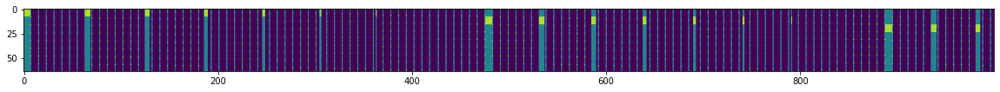

In [28]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

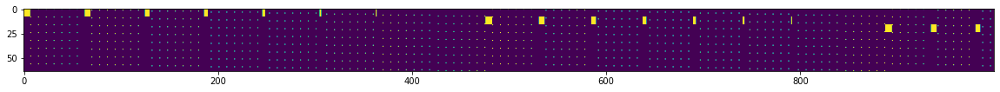

In [29]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

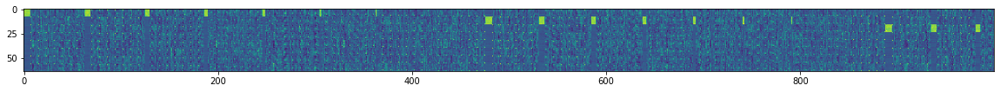

In [30]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

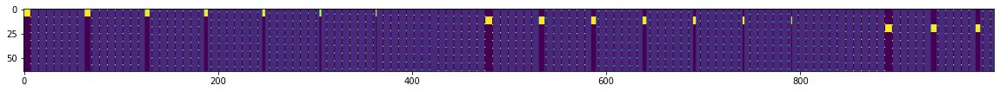

In [31]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

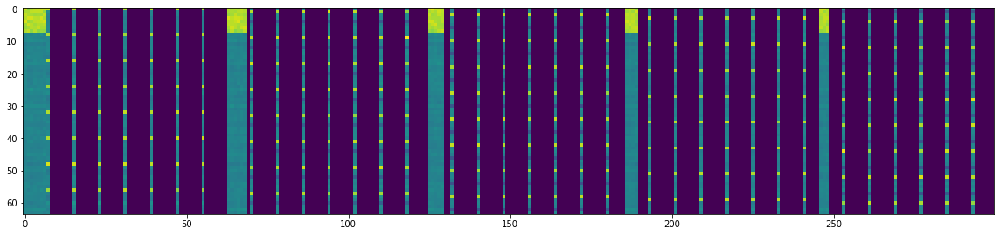

In [33]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

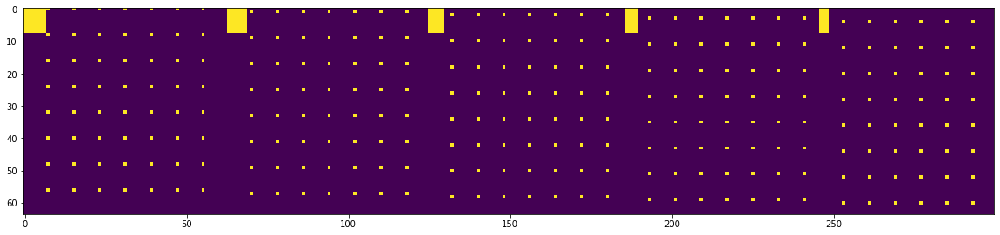

In [34]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

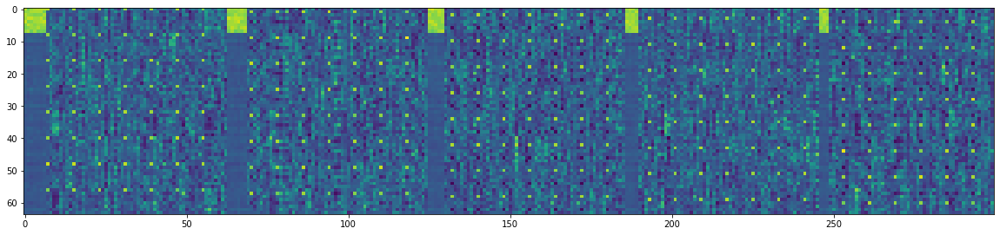

In [35]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

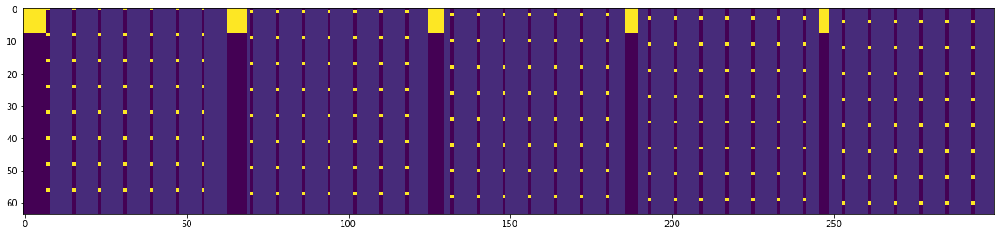

In [36]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])

## Continue Training from checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '2iwcafn1') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

In [ ]:
trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=800, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
    callbacks=[checkpoint_callback]
)

with torch.autograd.detect_anomaly():
    trainer.fit(trainmodule, game_datamodule)
    
wandb.save(os.path.join(ckpt_dir_PATH, 'last.ckpt'))

## Test after reloading checkpoint

In [ ]:
checkpoint_PATH = os.path.join(ckpt_dir_PATH, 'last.ckpt')
run_PATH = os.path.join(project_name, '2iwcafn1') # also from wandb interface

wandb.restore(checkpoint_PATH, run_path=run_PATH)
checkpoint = torch.load(checkpoint_PATH, map_location=lambda storage, loc: storage)
trainmodule.load_state_dict(checkpoint['state_dict'])

trainer = pl.Trainer(
    gpus=[1], 
    min_epochs=2, max_epochs=300, 
    precision=32, 
    logger=wd_logger,
    log_gpu_memory='all',
    weights_summary = 'full',
    gradient_clip_val=hparams['gradient_clip_val'],
    replace_sampler_ddp=False,
#     callbacks=[checkpoint_callback]
)

In [ ]:
test_loader = DataLoader(
            GameTestFullDataset(raw_data=game_data, debug=True), 
            batch_size=hparams['batch_size'], shuffle=False
        )
res = trainer.test(model=trainmodule, test_dataloaders=test_loader)

In [ ]:
model_distribution_res = trainmodule.pull_model_distribution(debug=True)
print('xy_hat_rank:', model_distribution_res['xy_hat_rank'])
print('xy_div_xyind_hat_rank:', model_distribution_res['xy_div_xyind_hat_rank'])
print('mi_hat:', model_distribution_res['mi_hat'])
print('mi_gt_minus_hat:', model_distribution_res['mi_gt_minus_hat'])
print('kl_div:', model_distribution_res['kl_div'])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(xy[figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow(model_distribution_res['xy_div_xyind_hat'][figrange[0]:figrange[1], figrange[2]:figrange[3]])

In [ ]:
plt.figure(figsize = figsize)
plt.imshow((xy/xyind)[figrange[0]:figrange[1], figrange[2]:figrange[3]])